## Import library

In [32]:
import tensorflow as tf
from tensorflow.keras import backend
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras import utils

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.utils.vis_utils import plot_model

import matplotlib.pyplot as plt
from IPython import display
from PIL import Image
import imageio

import numpy as np
from tqdm import tqdm
import glob
import os
import time

## Initialize Parameter

In [15]:
BUFFER_SIZE = 60000
BATCH_SIZE = 64

EPOCHS = 200
noise_dim = 256
num_examples_to_generate = 16

img_shape = (28, 28, 1)

gradient_penalty_weight = 10

seed = tf.random.normal([num_examples_to_generate, noise_dim])

## Bulding model

### Generator

In [33]:
# Both the generator and discriminator are defined using the Keras Sequential API.
def build_generator(input_shape=(noise_dim,)):

    img_input = layers.Input(shape=input_shape)

    x = layers.Dense(7 * 7 * 256,
                   activation=tf.nn.leaky_relu,
                   use_bias=False,
                   name='fc1')(img_input)
    x = layers.BatchNormalization(name='bn1')(x)

    x = layers.Reshape(target_shape=(7, 7, 256), name='reshape1')(x)

    x = layers.Conv2DTranspose(128, (5, 5),
                             strides=(1, 1),
                             activation=tf.nn.leaky_relu,
                             padding='same',
                             use_bias=False,
                             name='deconv1')(x)
    x = layers.BatchNormalization(name='bn2')(x)

    x = layers.Conv2DTranspose(64, (5, 5),
                             strides=(2, 2),
                             activation=tf.nn.leaky_relu,
                             padding='same',
                             use_bias=False,
                             name='deconv2')(x)
    x = layers.BatchNormalization(name='bn3')(x)

    output = layers.Conv2DTranspose(1, (5, 5),
                             strides=(2, 2),
                             activation=tf.nn.tanh,
                             padding='same',
                             use_bias=False,
                             name='deconv3')(x)
    
    inputs = img_input

    model = Model(inputs, output, name='Generator_model')
    
    return model

Generator model:
Model: "Generator_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 256)]             0         
_________________________________________________________________
fc1 (Dense)                  (None, 12544)             3211264   
_________________________________________________________________
bn1 (BatchNormalization)     (None, 12544)             50176     
_________________________________________________________________
reshape1 (Reshape)           (None, 7, 7, 256)         0         
_________________________________________________________________
deconv1 (Conv2DTranspose)    (None, 7, 7, 128)         819200    
_________________________________________________________________
bn2 (BatchNormalization)     (None, 7, 7, 128)         512       
_________________________________________________________________
deconv2 (Conv2DTranspose)    (None

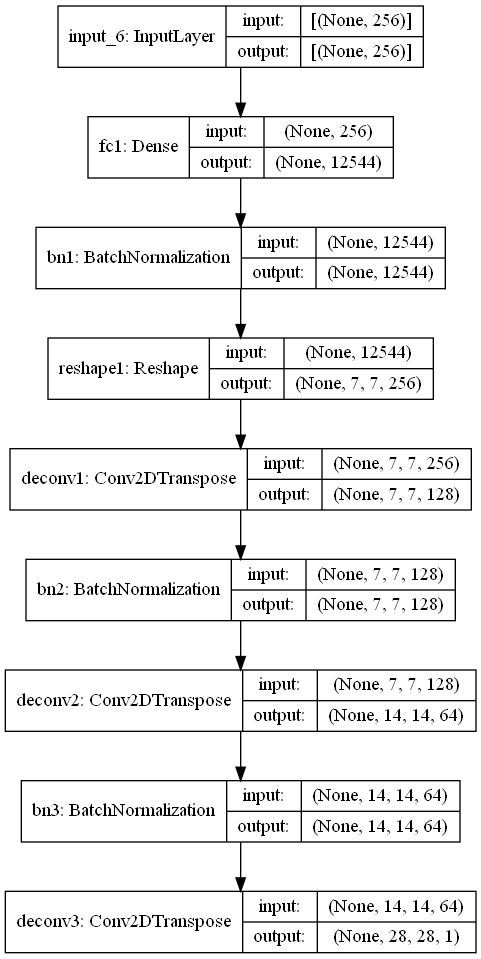

In [35]:
print('Generator model:')
generator = build_generator()
generator.summary()
plot_model(generator, to_file='generator_plot.png', show_shapes=True, show_layer_names=True)

### Discriminator

In [37]:
# The discriminator is a CNN-based image classifier.
def build_discriminator(input_shape=(28, 28, 1)):

    img_input = layers.Input(shape=input_shape)

    x = layers.Conv2D(64, (5, 5),
                    strides=(2, 2),
                    activation=tf.nn.leaky_relu,
                    padding='same',
                    name='conv1')(img_input)
    x = layers.Dropout(0.3, name='drop1')(x)

    x = layers.Conv2D(32, (5, 5),
                    strides=(2, 2),
                    activation=tf.nn.leaky_relu,
                    padding='same',
                    name='conv2')(x)
    x = layers.Dropout(0.3, name='drop2')(x)

    x = layers.Flatten(name='flatten')(x)
    
    output = layers.Dense(units=1, name='fc1')(x)

    inputs = img_input

    model = Model(inputs, output, name='Discriminator_model')
    
    return model

Discriminator model:
Model: "Discriminator_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 28, 28, 1)]       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 14, 14, 64)        1664      
_________________________________________________________________
drop1 (Dropout)              (None, 14, 14, 64)        0         
_________________________________________________________________
conv2 (Conv2D)               (None, 7, 7, 32)          51232     
_________________________________________________________________
drop2 (Dropout)              (None, 7, 7, 32)          0         
_________________________________________________________________
flatten (Flatten)            (None, 1568)              0         
_________________________________________________________________
fc1 (Dense)               

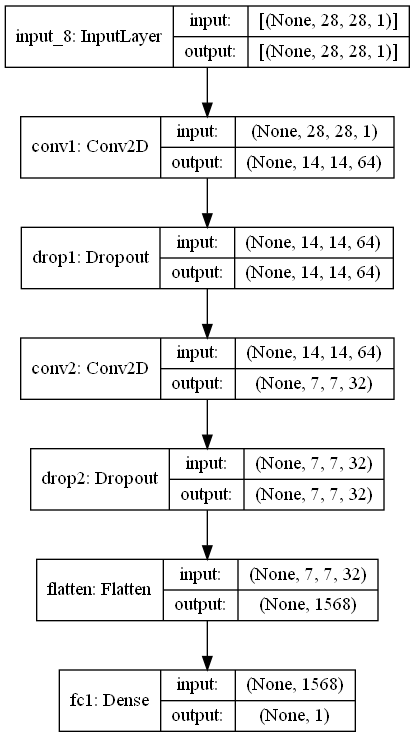

In [38]:
print('Discriminator model:')
discriminator = build_discriminator()
discriminator.summary()
plot_model(discriminator, to_file='Discriminator_plot.png', show_shapes=True, show_layer_names=True)

## W-GAN

In [20]:
# Define the loss and optimizers
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)


def gradient_penalty(real_img, generated_images):
    epsilon = tf.random.uniform([real_img.shape[0], 1, 1, 1], 0.0, 1.0)
    x_hat = epsilon * real_img + (1 - epsilon) * generated_images
    with tf.GradientTape() as t:
        t.watch(x_hat)
        d_hat = discriminator(x_hat)
    gradients = t.gradient(d_hat, x_hat)
    ddx = tf.sqrt(tf.reduce_sum(gradients ** 2, axis=[1, 2]))
    d_regularizer = tf.reduce_mean((ddx - 1.0) ** 2)
    return d_regularizer

In [21]:
# Generator loss
def generator_loss(fake_output):
    # losses of fake with label "1"
    return tf.reduce_mean(fake_output)


# Discriminator loss
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss


# The discriminator and the generator optimizers are different since
# we will train two networks separately.
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# Save checkpoints
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# create dir
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)

In [22]:
@tf.function
def train_step(images):
    noise = tf.random.normal([images.shape[0], noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        # gradient penalty
        d_regularizer = gradient_penalty(images, generated_images)
        # losses
        gen_loss = generator_loss(fake_output)
        disc_loss = (
                tf.reduce_mean(real_output)
                - tf.reduce_mean(fake_output)
                + d_regularizer * gradient_penalty_weight
        )

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    return gen_loss, disc_loss


def train(dataset, epochs):
    loss_d = []
    loss_g = []
    for epoch in range(epochs):
        print(f'epoch {epoch+1}/{epochs}: ', end='\n')
        start = time.time()
        
        d_loss = []
        g_loss = []
                
        for image_batch in tqdm(dataset):
            gen_loss, disc_loss = train_step(image_batch)
            
            d_loss.append(disc_loss)
            g_loss.append(gen_loss)
            

        loss_d.append(np.mean(d_loss))
        loss_g.append(np.mean(g_loss))
        
        print(f'Time={time.time() - start:.4f} sec, gen_loss={np.mean(g_loss)}, disc_loss={np.mean(d_loss)}')
        
        # Produce images for the GIF as we go
        if epoch % 10 == 0:
            generate_and_save_images(generator,
                                     epoch + 1,
                                     seed)

        # Save the model every 200 epochs
        if (epoch + 1) % 200 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        
    history = {'gen_loss':loss_g, 'disc_loss':loss_d}
    # Generate after the final epoch
    generate_and_save_images(generator,
                           epochs,
                           seed)
    return history

In [26]:
# Generate and save images
def generate_and_save_images(model, epoch, test_input):
   
    predictions = model(test_input)

    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')

    plt.savefig(checkpoint_dir + '/' + 'image_at_epoch_{:04d}.png'.format(epoch))
    plt.show(fig)
    plt.close(fig)



# Display a single image using the epoch number
def display_image(epoch_no):
    return Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

# Create a GIF
def create_gif(file_name):
    with imageio.get_writer(file_name, mode='I') as writer:
        filenames = glob.glob(checkpoint_dir + '/' + 'image*.png')
        filenames = sorted(filenames)
        last = -1
        for i, filename in enumerate(filenames):
            frame = 2 * (i ** 0.5)
            if round(frame) > round(last):
                last = frame
            else:
                continue
            image = imageio.imread(filename)
            writer.append_data(image)
        image = imageio.imread(filename)
        writer.append_data(image);

## Load Dataset

In [24]:
# def load_data(buffer_size, batch_size):

#     # load datasets
#     (train_images, _), (_, _) = tf.keras.datasets.fashion_mnist.load_data()

#     # split datasets
#     train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
#     train_images = train_images / 255.0  # Normalize the images to [0, 1]

#     # Batch and shuffle the data
#     train_dataset = (
#         tf.data.Dataset.from_tensor_slices(train_images)
#         .shuffle(buffer_size)
#         .batch(batch_size)
#     )
#     return train_dataset

def load_data(buffer_size, batch_size = 8):
    
    datagen = ImageDataGenerator( 
#         rescale=1./255,
#         rotation_range=10.,
#         width_shift_range=0.1,
#         height_shift_range=0.1,
#         zoom_range=0.2,
#         horizontal_flip=True
    )
    
    train_gen = datagen.flow_from_directory(
        '../Dataset',
        target_size=(28, 28),
        color_mode='grayscale',
        batch_size=1005,
        classes=['one', 'two', 'three', 'four', 'five'],
        class_mode='categorical'
    )

    train_images, _ = train_gen.next()
    print(train_images.shape)
    
    # split datasets
    train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
    train_images = train_images / 255.0  # Normalize the images to [0, 1]

    # Batch and shuffle the data
    train_dataset = (
        tf.data.Dataset.from_tensor_slices(train_images)
        .shuffle(buffer_size)
        .batch(batch_size)
    )
    
    return train_dataset


## Train Model

Found 1005 images belonging to 5 classes.
(1005, 28, 28, 1)
epoch 1/1500: 


100%|██████████| 16/16 [00:01<00:00, 12.57it/s]


Time=1.2826 sec, gen_loss=-0.051098886877298355, disc_loss=7.279788494110107


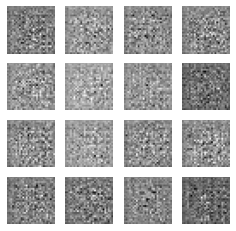

epoch 2/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.38it/s]


Time=0.2704 sec, gen_loss=-0.2334846556186676, disc_loss=6.3271589279174805
epoch 3/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.50it/s]


Time=0.2700 sec, gen_loss=-0.5855101943016052, disc_loss=5.032127380371094
epoch 4/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.58it/s]


Time=0.2706 sec, gen_loss=-1.2829759120941162, disc_loss=3.08669114112854
epoch 5/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.44it/s]


Time=0.2692 sec, gen_loss=-2.7634124755859375, disc_loss=0.27267253398895264
epoch 6/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2693 sec, gen_loss=-5.459813117980957, disc_loss=-2.5976643562316895
epoch 7/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.51it/s]


Time=0.2689 sec, gen_loss=-8.120342254638672, disc_loss=-3.521176815032959
epoch 8/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.30it/s]


Time=0.2698 sec, gen_loss=-7.687663555145264, disc_loss=-3.9058902263641357
epoch 9/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.82it/s]


Time=0.2728 sec, gen_loss=-5.188470840454102, disc_loss=-4.524355888366699
epoch 10/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.07it/s]


Time=0.2666 sec, gen_loss=-3.3791937828063965, disc_loss=-4.444667816162109
epoch 11/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2773 sec, gen_loss=-3.3564419746398926, disc_loss=-3.7222251892089844


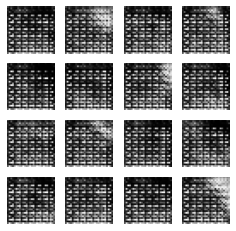

epoch 12/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.91it/s]


Time=0.2757 sec, gen_loss=-4.240536212921143, disc_loss=-3.1954338550567627
epoch 13/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.54it/s]


Time=0.2698 sec, gen_loss=-5.455356597900391, disc_loss=-2.5666449069976807
epoch 14/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.47it/s]


Time=0.2701 sec, gen_loss=-5.789041519165039, disc_loss=-1.9828957319259644
epoch 15/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2722 sec, gen_loss=-5.245922565460205, disc_loss=-1.6225481033325195
epoch 16/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-4.260888576507568, disc_loss=-1.488417148590088
epoch 17/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.11it/s]


Time=0.2716 sec, gen_loss=-2.8475403785705566, disc_loss=-1.8119471073150635
epoch 18/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.04it/s]


Time=0.2719 sec, gen_loss=-1.3224461078643799, disc_loss=-2.355961799621582
epoch 19/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.07it/s]


Time=0.2707 sec, gen_loss=0.3150292634963989, disc_loss=-2.9954516887664795
epoch 20/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.13it/s]


Time=0.2705 sec, gen_loss=0.997576117515564, disc_loss=-2.86275053024292
epoch 21/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.56it/s]


Time=0.2738 sec, gen_loss=1.137273907661438, disc_loss=-2.635005474090576


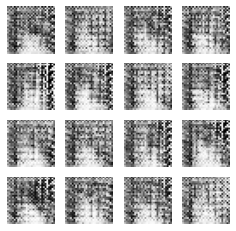

epoch 22/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.26it/s]


Time=0.2742 sec, gen_loss=1.5010528564453125, disc_loss=-3.225801706314087
epoch 23/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.15it/s]


Time=0.2724 sec, gen_loss=1.3678187131881714, disc_loss=-2.912172317504883
epoch 24/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.89it/s]


Time=0.2755 sec, gen_loss=1.3471479415893555, disc_loss=-2.67305326461792
epoch 25/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.20it/s]


Time=0.2712 sec, gen_loss=1.810868501663208, disc_loss=-2.6152241230010986
epoch 26/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.21it/s]


Time=0.2697 sec, gen_loss=1.3482179641723633, disc_loss=-2.1772866249084473
epoch 27/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=0.8741940259933472, disc_loss=-1.878483772277832
epoch 28/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2763 sec, gen_loss=0.3328947424888611, disc_loss=-1.3384432792663574
epoch 29/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2713 sec, gen_loss=-0.18982288241386414, disc_loss=-1.29837965965271
epoch 30/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.66it/s]


Time=0.2734 sec, gen_loss=-0.7834126353263855, disc_loss=-1.155863642692566
epoch 31/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.27it/s]


Time=0.2699 sec, gen_loss=-1.327121376991272, disc_loss=-0.9648138880729675


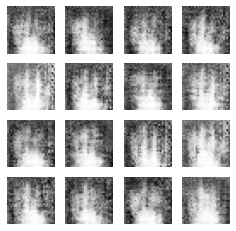

epoch 32/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2733 sec, gen_loss=-1.8528081178665161, disc_loss=-0.8003196120262146
epoch 33/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2741 sec, gen_loss=-1.9342151880264282, disc_loss=-0.7503050565719604
epoch 34/1500: 


100%|██████████| 16/16 [00:00<00:00, 51.42it/s]


Time=0.3251 sec, gen_loss=-1.7482295036315918, disc_loss=-0.5482159852981567
epoch 35/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2773 sec, gen_loss=-1.4038137197494507, disc_loss=-0.5437797904014587
epoch 36/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-1.6029547452926636, disc_loss=-0.4712298512458801
epoch 37/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2723 sec, gen_loss=-2.061189651489258, disc_loss=-0.5249524116516113
epoch 38/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-2.541656255722046, disc_loss=-0.46084147691726685
epoch 39/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-2.6318557262420654, disc_loss=-0.5034120678901672
epoch 40/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2723 sec, gen_loss=-2.679386615753174, disc_loss=-0.510642409324646
epoch 41/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.48it/s]


Time=0.2700 sec, gen_loss=-2.5236496925354004, disc_loss=-0.49279341101646423


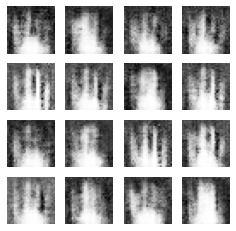

epoch 42/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-2.3805899620056152, disc_loss=-0.45556640625
epoch 43/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.85it/s]


Time=0.2716 sec, gen_loss=-2.428943395614624, disc_loss=-0.5801665782928467
epoch 44/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-3.0651638507843018, disc_loss=-0.3822324275970459
epoch 45/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-3.451206684112549, disc_loss=-0.3857581913471222
epoch 46/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2744 sec, gen_loss=-3.106377124786377, disc_loss=-0.37372782826423645
epoch 47/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.45it/s]


Time=0.2692 sec, gen_loss=-2.6188721656799316, disc_loss=-0.4585893750190735
epoch 48/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.14it/s]


Time=0.2734 sec, gen_loss=-2.4720048904418945, disc_loss=-0.29613274335861206
epoch 49/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2707 sec, gen_loss=-2.1416592597961426, disc_loss=-0.3998243510723114
epoch 50/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2713 sec, gen_loss=-2.1727585792541504, disc_loss=-0.4185008704662323
epoch 51/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2723 sec, gen_loss=-2.538339376449585, disc_loss=-0.3839030861854553


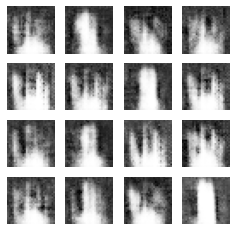

epoch 52/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.12it/s]


Time=0.2715 sec, gen_loss=-3.433004856109619, disc_loss=-0.41709956526756287
epoch 53/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.49it/s]


Time=0.2702 sec, gen_loss=-4.403435230255127, disc_loss=-0.39064693450927734
epoch 54/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2693 sec, gen_loss=-4.777728080749512, disc_loss=-0.5110678672790527
epoch 55/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.67it/s]


Time=0.2683 sec, gen_loss=-4.659237861633301, disc_loss=-0.36313602328300476
epoch 56/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.66it/s]


Time=0.2653 sec, gen_loss=-3.7077364921569824, disc_loss=-0.37980765104293823
epoch 57/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.16it/s]


Time=0.2673 sec, gen_loss=-2.5299839973449707, disc_loss=-0.36887598037719727
epoch 58/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.87it/s]


Time=0.2675 sec, gen_loss=-1.7760210037231445, disc_loss=-0.43013420701026917
epoch 59/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.03it/s]


Time=0.2668 sec, gen_loss=-1.704145073890686, disc_loss=-0.4720812439918518
epoch 60/1500: 


100%|██████████| 16/16 [00:00<00:00, 53.74it/s]


Time=0.3107 sec, gen_loss=-2.152057409286499, disc_loss=-0.447756826877594
epoch 61/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.16it/s]


Time=0.2673 sec, gen_loss=-2.24021577835083, disc_loss=-0.5016707181930542


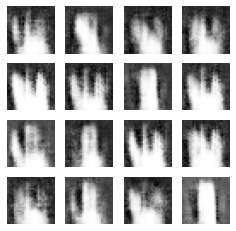

epoch 62/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2703 sec, gen_loss=-2.1390347480773926, disc_loss=-0.41240227222442627
epoch 63/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.17it/s]


Time=0.2672 sec, gen_loss=-2.3705859184265137, disc_loss=-0.419582724571228
epoch 64/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.78it/s]


Time=0.2668 sec, gen_loss=-3.054105758666992, disc_loss=-0.4343554377555847
epoch 65/1500: 


100%|██████████| 16/16 [00:00<00:00, 54.20it/s]


Time=0.3092 sec, gen_loss=-3.985471725463867, disc_loss=-0.4842418432235718
epoch 66/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.18it/s]


Time=0.2680 sec, gen_loss=-4.624114513397217, disc_loss=-0.6248718500137329
epoch 67/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.91it/s]


Time=0.2673 sec, gen_loss=-4.361396312713623, disc_loss=-0.536797821521759
epoch 68/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.97it/s]


Time=0.2670 sec, gen_loss=-3.2984275817871094, disc_loss=-0.4051295220851898
epoch 69/1500: 


100%|██████████| 16/16 [00:00<00:00, 56.69it/s]


Time=0.2952 sec, gen_loss=-2.6408371925354004, disc_loss=-0.5013911724090576
epoch 70/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.16it/s]


Time=0.2663 sec, gen_loss=-2.607286214828491, disc_loss=-0.5171000957489014
epoch 71/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.12it/s]


Time=0.2675 sec, gen_loss=-2.983325719833374, disc_loss=-0.5757431387901306


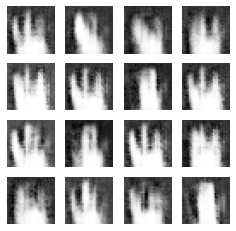

epoch 72/1500: 


100%|██████████| 16/16 [00:00<00:00, 52.59it/s]


Time=0.3172 sec, gen_loss=-3.4430034160614014, disc_loss=-0.46968215703964233
epoch 73/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-2.9041664600372314, disc_loss=-0.4518531560897827
epoch 74/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2738 sec, gen_loss=-1.1734834909439087, disc_loss=-0.5760729312896729
epoch 75/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.53it/s]


Time=0.2783 sec, gen_loss=-1.4082698822021484, disc_loss=-0.5777859091758728
epoch 76/1500: 


100%|██████████| 16/16 [00:00<00:00, 54.37it/s]


Time=0.3082 sec, gen_loss=-3.5953311920166016, disc_loss=-0.7192044258117676
epoch 77/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.99it/s]


Time=0.2753 sec, gen_loss=-4.462935924530029, disc_loss=-0.5539730787277222
epoch 78/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2722 sec, gen_loss=-2.9081239700317383, disc_loss=-0.7697052955627441
epoch 79/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.88it/s]


Time=0.2758 sec, gen_loss=-2.201639175415039, disc_loss=-0.7402151823043823
epoch 80/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2739 sec, gen_loss=-3.4668493270874023, disc_loss=-0.8704397678375244
epoch 81/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.40it/s]


Time=0.2735 sec, gen_loss=-5.444676399230957, disc_loss=-0.8377733826637268


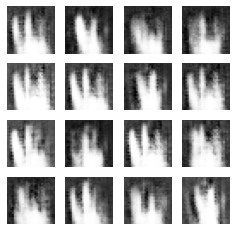

epoch 82/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2753 sec, gen_loss=-5.906048774719238, disc_loss=-0.5061164498329163
epoch 83/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.50it/s]


Time=0.2741 sec, gen_loss=-2.8588385581970215, disc_loss=-0.8751072883605957
epoch 84/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=0.8389248847961426, disc_loss=-1.2618920803070068
epoch 85/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=0.1823371946811676, disc_loss=-1.1460902690887451
epoch 86/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.63it/s]


Time=0.2736 sec, gen_loss=-2.5700483322143555, disc_loss=-1.0145313739776611
epoch 87/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.42it/s]


Time=0.2735 sec, gen_loss=-4.7079057693481445, disc_loss=-0.6789474487304688
epoch 88/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2753 sec, gen_loss=-4.669642448425293, disc_loss=-0.6519298553466797
epoch 89/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-3.7809829711914062, disc_loss=-0.9487346410751343
epoch 90/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2723 sec, gen_loss=-3.976748466491699, disc_loss=-1.1464934349060059
epoch 91/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2728 sec, gen_loss=-5.4111833572387695, disc_loss=-1.1812963485717773


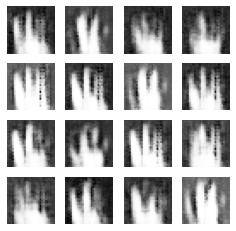

epoch 92/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.40it/s]


Time=0.2745 sec, gen_loss=-5.816900253295898, disc_loss=-0.9881425499916077
epoch 93/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.03it/s]


Time=0.2709 sec, gen_loss=-4.188233375549316, disc_loss=-0.7891961336135864
epoch 94/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-0.8561174869537354, disc_loss=-0.9998411536216736
epoch 95/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.31it/s]


Time=0.2750 sec, gen_loss=1.0517776012420654, disc_loss=-1.1216702461242676
epoch 96/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.40it/s]


Time=0.2746 sec, gen_loss=-1.2941093444824219, disc_loss=-1.0322213172912598
epoch 97/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.57it/s]


Time=0.2738 sec, gen_loss=-4.592251300811768, disc_loss=-0.8484678268432617
epoch 98/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.40it/s]


Time=0.2746 sec, gen_loss=-5.343962669372559, disc_loss=-0.7619798183441162
epoch 99/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.97it/s]


Time=0.2711 sec, gen_loss=-3.6307449340820312, disc_loss=-0.9747432470321655
epoch 100/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.06it/s]


Time=0.2708 sec, gen_loss=-2.7710185050964355, disc_loss=-0.932905912399292
epoch 101/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-4.133715629577637, disc_loss=-0.8498940467834473


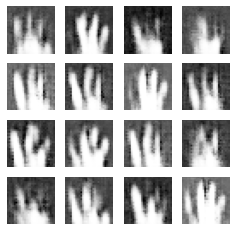

epoch 102/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.75it/s]


Time=0.2721 sec, gen_loss=-5.46790885925293, disc_loss=-0.8285483121871948
epoch 103/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2723 sec, gen_loss=-5.669042110443115, disc_loss=-0.7985130548477173
epoch 104/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2713 sec, gen_loss=-4.966131210327148, disc_loss=-0.7976894378662109
epoch 105/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.29it/s]


Time=0.2741 sec, gen_loss=-3.9339475631713867, disc_loss=-0.8383520841598511
epoch 106/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-3.834270715713501, disc_loss=-0.6698406934738159
epoch 107/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-4.501399993896484, disc_loss=-0.6897279620170593
epoch 108/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.88it/s]


Time=0.2735 sec, gen_loss=-5.11916971206665, disc_loss=-0.9006563425064087
epoch 109/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.96it/s]


Time=0.2712 sec, gen_loss=-5.422568321228027, disc_loss=-0.6962371468544006
epoch 110/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2723 sec, gen_loss=-5.170475006103516, disc_loss=-0.8391032218933105
epoch 111/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.84it/s]


Time=0.2722 sec, gen_loss=-4.902560234069824, disc_loss=-0.8581194281578064


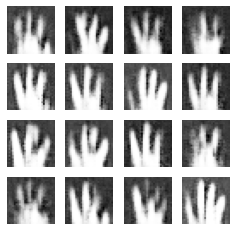

epoch 112/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.48it/s]


Time=0.2732 sec, gen_loss=-5.2427659034729, disc_loss=-0.7952901124954224
epoch 113/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2713 sec, gen_loss=-5.518647193908691, disc_loss=-0.7735673189163208
epoch 114/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2733 sec, gen_loss=-5.215409278869629, disc_loss=-0.7978870272636414
epoch 115/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2758 sec, gen_loss=-4.767946720123291, disc_loss=-0.8407541513442993
epoch 116/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.26it/s]


Time=0.2752 sec, gen_loss=-4.956681728363037, disc_loss=-0.9027165174484253
epoch 117/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.03it/s]


Time=0.2725 sec, gen_loss=-5.20339298248291, disc_loss=-0.8544705510139465
epoch 118/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.59it/s]


Time=0.2737 sec, gen_loss=-5.228300094604492, disc_loss=-0.7992265820503235
epoch 119/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2743 sec, gen_loss=-5.19551944732666, disc_loss=-0.7509244084358215
epoch 120/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.17it/s]


Time=0.2733 sec, gen_loss=-5.9003682136535645, disc_loss=-0.7146791219711304
epoch 121/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.52it/s]


Time=0.2731 sec, gen_loss=-6.807005882263184, disc_loss=-0.7171322107315063


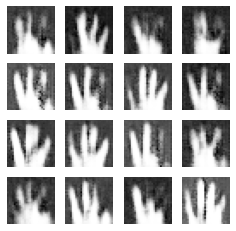

epoch 122/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.74it/s]


Time=0.2741 sec, gen_loss=-7.26246452331543, disc_loss=-0.8316423892974854
epoch 123/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2733 sec, gen_loss=-6.782253265380859, disc_loss=-0.8538081645965576
epoch 124/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.66it/s]


Time=0.2744 sec, gen_loss=-5.679728031158447, disc_loss=-0.7708169221878052
epoch 125/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.36it/s]


Time=0.2737 sec, gen_loss=-4.560959815979004, disc_loss=-0.7629922032356262
epoch 126/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2726 sec, gen_loss=-4.42221736907959, disc_loss=-0.8433370590209961
epoch 127/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.28it/s]


Time=0.2741 sec, gen_loss=-4.951545715332031, disc_loss=-0.8397313356399536
epoch 128/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.59it/s]


Time=0.2727 sec, gen_loss=-5.547519683837891, disc_loss=-0.827519416809082
epoch 129/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.05it/s]


Time=0.2718 sec, gen_loss=-5.981471061706543, disc_loss=-0.7935423254966736
epoch 130/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2723 sec, gen_loss=-6.411255836486816, disc_loss=-0.7534007430076599
epoch 131/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2750 sec, gen_loss=-6.791990756988525, disc_loss=-0.7643455266952515


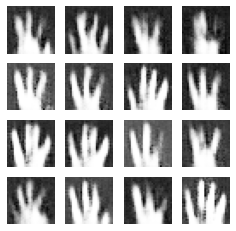

epoch 132/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-6.40498685836792, disc_loss=-0.8024754524230957
epoch 133/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-5.575534820556641, disc_loss=-0.8498349189758301
epoch 134/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.02it/s]


Time=0.2728 sec, gen_loss=-4.888518810272217, disc_loss=-0.7617425918579102
epoch 135/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-5.323825359344482, disc_loss=-0.7792798280715942
epoch 136/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2743 sec, gen_loss=-6.027369499206543, disc_loss=-0.6788557767868042
epoch 137/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-6.9769673347473145, disc_loss=-0.769584059715271
epoch 138/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.73it/s]


Time=0.2742 sec, gen_loss=-7.376273155212402, disc_loss=-0.6938065886497498
epoch 139/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.65it/s]


Time=0.2745 sec, gen_loss=-6.594989776611328, disc_loss=-0.706161618232727
epoch 140/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2738 sec, gen_loss=-4.853263854980469, disc_loss=-0.7668639421463013
epoch 141/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.88it/s]


Time=0.2735 sec, gen_loss=-4.246614933013916, disc_loss=-0.7543424367904663


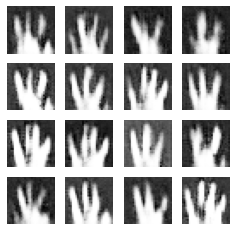

epoch 142/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.66it/s]


Time=0.2734 sec, gen_loss=-5.915111541748047, disc_loss=-0.8422015309333801
epoch 143/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.64it/s]


Time=0.2745 sec, gen_loss=-7.094325065612793, disc_loss=-0.6730380058288574
epoch 144/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.64it/s]


Time=0.2735 sec, gen_loss=-7.791634559631348, disc_loss=-0.6371269822120667
epoch 145/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.61it/s]


Time=0.2727 sec, gen_loss=-8.283882141113281, disc_loss=-0.7830389738082886
epoch 146/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2723 sec, gen_loss=-8.341489791870117, disc_loss=-0.718985915184021
epoch 147/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2758 sec, gen_loss=-7.245987892150879, disc_loss=-0.8663082122802734
epoch 148/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.08it/s]


Time=0.2769 sec, gen_loss=-6.489637851715088, disc_loss=-0.7341217398643494
epoch 149/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.62it/s]


Time=0.2736 sec, gen_loss=-6.465824127197266, disc_loss=-0.6730350255966187
epoch 150/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.59it/s]


Time=0.2731 sec, gen_loss=-6.620305061340332, disc_loss=-0.653390109539032
epoch 151/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2733 sec, gen_loss=-6.874966621398926, disc_loss=-0.7026283144950867


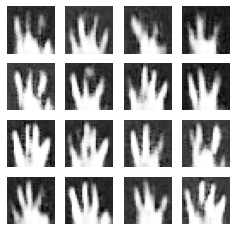

epoch 152/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.91it/s]


Time=0.2714 sec, gen_loss=-7.62160062789917, disc_loss=-0.8165420889854431
epoch 153/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.61it/s]


Time=0.2737 sec, gen_loss=-7.911344528198242, disc_loss=-0.6817712187767029
epoch 154/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.32it/s]


Time=0.2749 sec, gen_loss=-7.312460422515869, disc_loss=-0.625759482383728
epoch 155/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-6.328763961791992, disc_loss=-0.7515321969985962
epoch 156/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2723 sec, gen_loss=-6.3720903396606445, disc_loss=-0.7445260286331177
epoch 157/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2714 sec, gen_loss=-6.890453815460205, disc_loss=-0.7225241661071777
epoch 158/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2703 sec, gen_loss=-7.541698455810547, disc_loss=-0.7716708183288574
epoch 159/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.67it/s]


Time=0.2693 sec, gen_loss=-8.580233573913574, disc_loss=-0.6346390247344971
epoch 160/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.62it/s]


Time=0.2695 sec, gen_loss=-8.854623794555664, disc_loss=-0.6726825833320618
epoch 161/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.16it/s]


Time=0.2704 sec, gen_loss=-8.439069747924805, disc_loss=-0.872079610824585


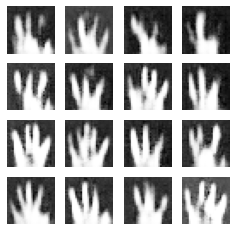

epoch 162/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.88it/s]


Time=0.2715 sec, gen_loss=-7.783150672912598, disc_loss=-0.7347627282142639
epoch 163/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.63it/s]


Time=0.2694 sec, gen_loss=-7.545473098754883, disc_loss=-0.737488865852356
epoch 164/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.91it/s]


Time=0.2673 sec, gen_loss=-8.296247482299805, disc_loss=-0.7316559553146362
epoch 165/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.67it/s]


Time=0.2683 sec, gen_loss=-8.58619499206543, disc_loss=-0.8199981451034546
epoch 166/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2753 sec, gen_loss=-8.515783309936523, disc_loss=-0.7715972661972046
epoch 167/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.36it/s]


Time=0.2695 sec, gen_loss=-8.331501007080078, disc_loss=-0.7524444460868835
epoch 168/1500: 


100%|██████████| 16/16 [00:00<00:00, 51.32it/s]


Time=0.3247 sec, gen_loss=-8.586201667785645, disc_loss=-0.6043686866760254
epoch 169/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.56it/s]


Time=0.2698 sec, gen_loss=-8.781900405883789, disc_loss=-0.8116521835327148
epoch 170/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.78it/s]


Time=0.2678 sec, gen_loss=-9.788629531860352, disc_loss=-0.6287176012992859
epoch 171/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.58it/s]


Time=0.2686 sec, gen_loss=-11.08295726776123, disc_loss=-0.6614639163017273


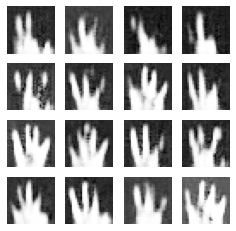

epoch 172/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.16it/s]


Time=0.2683 sec, gen_loss=-11.207218170166016, disc_loss=-0.6726166605949402
epoch 173/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.90it/s]


Time=0.2683 sec, gen_loss=-9.868772506713867, disc_loss=-0.8120396137237549
epoch 174/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.70it/s]


Time=0.2692 sec, gen_loss=-8.47569465637207, disc_loss=-0.791303277015686
epoch 175/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.63it/s]


Time=0.2736 sec, gen_loss=-6.828548431396484, disc_loss=-0.7619743347167969
epoch 176/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2738 sec, gen_loss=-6.9003705978393555, disc_loss=-0.8336194753646851
epoch 177/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-7.844393730163574, disc_loss=-0.7702325582504272
epoch 178/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.21it/s]


Time=0.2773 sec, gen_loss=-9.466670989990234, disc_loss=-0.7155925035476685
epoch 179/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.08it/s]


Time=0.2759 sec, gen_loss=-10.876389503479004, disc_loss=-0.738377571105957
epoch 180/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.42it/s]


Time=0.2764 sec, gen_loss=-11.58979320526123, disc_loss=-0.7633732557296753
epoch 181/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-11.659540176391602, disc_loss=-0.6655816435813904


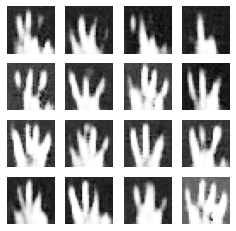

epoch 182/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.11it/s]


Time=0.2757 sec, gen_loss=-11.14944839477539, disc_loss=-0.744743824005127
epoch 183/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.76it/s]


Time=0.2730 sec, gen_loss=-10.224844932556152, disc_loss=-0.793358325958252
epoch 184/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2713 sec, gen_loss=-9.957741737365723, disc_loss=-0.6801072359085083
epoch 185/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.82it/s]


Time=0.2728 sec, gen_loss=-10.052290916442871, disc_loss=-0.7788735628128052
epoch 186/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.50it/s]


Time=0.2731 sec, gen_loss=-10.657045364379883, disc_loss=-0.6951889991760254
epoch 187/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.20it/s]


Time=0.2754 sec, gen_loss=-10.841371536254883, disc_loss=-0.7914813756942749
epoch 188/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2750 sec, gen_loss=-9.999058723449707, disc_loss=-0.7853394746780396
epoch 189/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2753 sec, gen_loss=-9.549629211425781, disc_loss=-0.6863245964050293
epoch 190/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-9.844386100769043, disc_loss=-0.7312197685241699
epoch 191/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2729 sec, gen_loss=-10.327251434326172, disc_loss=-0.8090413808822632


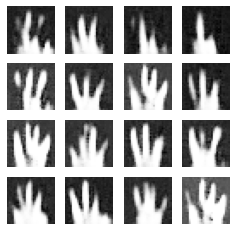

epoch 192/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.66it/s]


Time=0.2735 sec, gen_loss=-10.939817428588867, disc_loss=-0.8164553642272949
epoch 193/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.05it/s]


Time=0.2717 sec, gen_loss=-11.438279151916504, disc_loss=-0.7331104278564453
epoch 194/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.17it/s]


Time=0.2723 sec, gen_loss=-12.061386108398438, disc_loss=-0.7780092358589172
epoch 195/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.64it/s]


Time=0.2725 sec, gen_loss=-12.28521728515625, disc_loss=-0.7470747828483582
epoch 196/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.89it/s]


Time=0.2741 sec, gen_loss=-11.62091064453125, disc_loss=-0.7443468570709229
epoch 197/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-10.424946784973145, disc_loss=-0.7928494215011597
epoch 198/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.73it/s]


Time=0.2721 sec, gen_loss=-9.979198455810547, disc_loss=-0.8786603808403015
epoch 199/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.67it/s]


Time=0.2734 sec, gen_loss=-10.383548736572266, disc_loss=-0.8011705875396729
epoch 200/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2732 sec, gen_loss=-10.834964752197266, disc_loss=-0.6577891111373901
epoch 201/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.90it/s]


Time=0.2821 sec, gen_loss=-11.274524688720703, disc_loss=-0.8096896409988403


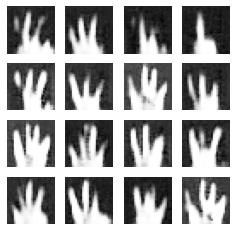

epoch 202/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2719 sec, gen_loss=-11.99174690246582, disc_loss=-0.8287245035171509
epoch 203/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-12.227987289428711, disc_loss=-0.8174461126327515
epoch 204/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-12.048162460327148, disc_loss=-0.8164300918579102
epoch 205/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.88it/s]


Time=0.2768 sec, gen_loss=-11.261249542236328, disc_loss=-0.8123202323913574
epoch 206/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-11.130117416381836, disc_loss=-0.7076979875564575
epoch 207/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-11.695836067199707, disc_loss=-0.7674221992492676
epoch 208/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-12.681360244750977, disc_loss=-0.7217153906822205
epoch 209/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2726 sec, gen_loss=-13.113828659057617, disc_loss=-0.8033571243286133
epoch 210/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.72it/s]


Time=0.2742 sec, gen_loss=-12.964302062988281, disc_loss=-0.8766624331474304
epoch 211/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-12.831027030944824, disc_loss=-0.7782207727432251


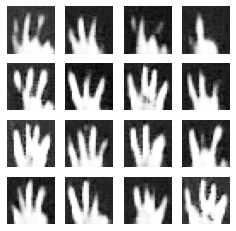

epoch 212/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2751 sec, gen_loss=-12.463191032409668, disc_loss=-0.8643029928207397
epoch 213/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.77it/s]


Time=0.2740 sec, gen_loss=-12.020557403564453, disc_loss=-0.7447060346603394
epoch 214/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.31it/s]


Time=0.2769 sec, gen_loss=-11.51681137084961, disc_loss=-0.7476770877838135
epoch 215/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-11.411188125610352, disc_loss=-0.7448692321777344
epoch 216/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-11.698427200317383, disc_loss=-0.7875727415084839
epoch 217/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.89it/s]


Time=0.2729 sec, gen_loss=-12.437971115112305, disc_loss=-0.7905805110931396
epoch 218/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2744 sec, gen_loss=-12.634258270263672, disc_loss=-0.7463942766189575
epoch 219/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.91it/s]


Time=0.2734 sec, gen_loss=-13.00202751159668, disc_loss=-0.78066086769104
epoch 220/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.65it/s]


Time=0.2745 sec, gen_loss=-13.818107604980469, disc_loss=-0.8119012713432312
epoch 221/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.76it/s]


Time=0.2730 sec, gen_loss=-13.859500885009766, disc_loss=-0.6965427398681641


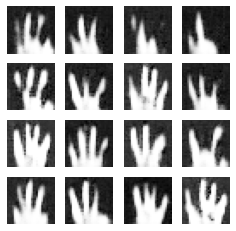

epoch 222/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.87it/s]


Time=0.2726 sec, gen_loss=-13.253406524658203, disc_loss=-0.7091206312179565
epoch 223/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.40it/s]


Time=0.2702 sec, gen_loss=-13.243934631347656, disc_loss=-0.8206632733345032
epoch 224/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.53it/s]


Time=0.2773 sec, gen_loss=-13.525598526000977, disc_loss=-0.7461245656013489
epoch 225/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-13.212992668151855, disc_loss=-0.7628692984580994
epoch 226/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.06it/s]


Time=0.2718 sec, gen_loss=-12.653074264526367, disc_loss=-0.8949826955795288
epoch 227/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-12.10405445098877, disc_loss=-0.6885263919830322
epoch 228/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2703 sec, gen_loss=-12.144800186157227, disc_loss=-0.6956427097320557
epoch 229/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.14it/s]


Time=0.2714 sec, gen_loss=-12.480225563049316, disc_loss=-0.5929527878761292
epoch 230/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.36it/s]


Time=0.2716 sec, gen_loss=-13.194779396057129, disc_loss=-0.7689963579177856
epoch 231/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.04it/s]


Time=0.2718 sec, gen_loss=-13.511005401611328, disc_loss=-0.8672932386398315


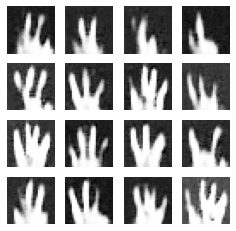

epoch 232/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2728 sec, gen_loss=-14.243257522583008, disc_loss=-0.8049135804176331
epoch 233/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.99it/s]


Time=0.2753 sec, gen_loss=-14.514716148376465, disc_loss=-0.8373584747314453
epoch 234/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2723 sec, gen_loss=-14.368108749389648, disc_loss=-0.7439454793930054
epoch 235/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.43it/s]


Time=0.2713 sec, gen_loss=-14.855365753173828, disc_loss=-0.7136766910552979
epoch 236/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.08it/s]


Time=0.2717 sec, gen_loss=-14.277432441711426, disc_loss=-0.7583268880844116
epoch 237/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2737 sec, gen_loss=-13.660832405090332, disc_loss=-0.8316596746444702
epoch 238/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.38it/s]


Time=0.2736 sec, gen_loss=-13.601400375366211, disc_loss=-0.7682775855064392
epoch 239/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2733 sec, gen_loss=-13.303791046142578, disc_loss=-0.7940812110900879
epoch 240/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.35it/s]


Time=0.2696 sec, gen_loss=-13.043346405029297, disc_loss=-0.6864416599273682
epoch 241/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2737 sec, gen_loss=-13.110000610351562, disc_loss=-0.8085091710090637


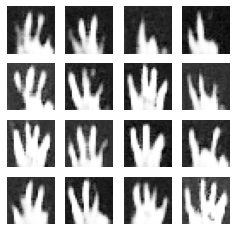

epoch 242/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2729 sec, gen_loss=-12.660711288452148, disc_loss=-0.8459277153015137
epoch 243/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.03it/s]


Time=0.2709 sec, gen_loss=-13.2899169921875, disc_loss=-0.767235517501831
epoch 244/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.00it/s]


Time=0.2720 sec, gen_loss=-13.479300498962402, disc_loss=-0.8021837472915649
epoch 245/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.99it/s]


Time=0.2731 sec, gen_loss=-13.641414642333984, disc_loss=-0.7978743314743042
epoch 246/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2713 sec, gen_loss=-14.699087142944336, disc_loss=-0.7599738836288452
epoch 247/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-14.695171356201172, disc_loss=-0.784921407699585
epoch 248/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.06it/s]


Time=0.2718 sec, gen_loss=-14.776150703430176, disc_loss=-0.892693281173706
epoch 249/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.77it/s]


Time=0.2730 sec, gen_loss=-14.2132568359375, disc_loss=-0.8624989986419678
epoch 250/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.15it/s]


Time=0.2714 sec, gen_loss=-14.333566665649414, disc_loss=-0.7671655416488647
epoch 251/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.11it/s]


Time=0.2716 sec, gen_loss=-14.181318283081055, disc_loss=-0.8280000686645508


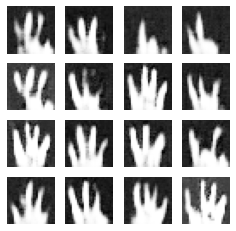

epoch 252/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2713 sec, gen_loss=-14.564090728759766, disc_loss=-0.8679821491241455
epoch 253/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2713 sec, gen_loss=-14.700044631958008, disc_loss=-0.7464273571968079
epoch 254/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-14.41618537902832, disc_loss=-0.7779552340507507
epoch 255/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.63it/s]


Time=0.2739 sec, gen_loss=-13.993518829345703, disc_loss=-0.8640346527099609
epoch 256/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2748 sec, gen_loss=-14.283306121826172, disc_loss=-0.7218677401542664
epoch 257/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-15.118311882019043, disc_loss=-0.8075917959213257
epoch 258/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2703 sec, gen_loss=-15.612225532531738, disc_loss=-0.7787783145904541
epoch 259/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.91it/s]


Time=0.2683 sec, gen_loss=-15.278276443481445, disc_loss=-0.7365005612373352
epoch 260/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.28it/s]


Time=0.2678 sec, gen_loss=-14.60549545288086, disc_loss=-0.8805415630340576
epoch 261/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.33it/s]


Time=0.2666 sec, gen_loss=-14.858110427856445, disc_loss=-0.8273302316665649


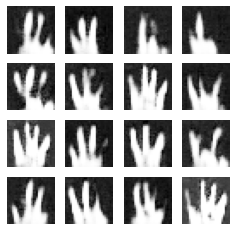

epoch 262/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.52it/s]


Time=0.2694 sec, gen_loss=-15.13054084777832, disc_loss=-0.848222017288208
epoch 263/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.69it/s]


Time=0.2692 sec, gen_loss=-15.338546752929688, disc_loss=-0.7003226280212402
epoch 264/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.16it/s]


Time=0.2682 sec, gen_loss=-15.164491653442383, disc_loss=-0.8439475297927856
epoch 265/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.03it/s]


Time=0.2678 sec, gen_loss=-14.567747116088867, disc_loss=-0.7840795516967773
epoch 266/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.11it/s]


Time=0.2685 sec, gen_loss=-14.037881851196289, disc_loss=-0.8238682746887207
epoch 267/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.54it/s]


Time=0.2708 sec, gen_loss=-14.8135986328125, disc_loss=-0.8259101510047913
epoch 268/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.67it/s]


Time=0.2683 sec, gen_loss=-14.812156677246094, disc_loss=-0.7630599737167358
epoch 269/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.91it/s]


Time=0.2673 sec, gen_loss=-14.649803161621094, disc_loss=-0.832252562046051
epoch 270/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.06it/s]


Time=0.2677 sec, gen_loss=-15.2764253616333, disc_loss=-0.8482812643051147
epoch 271/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.65it/s]


Time=0.2704 sec, gen_loss=-15.701066970825195, disc_loss=-0.7898535132408142


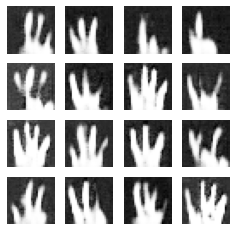

epoch 272/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.77it/s]


Time=0.2679 sec, gen_loss=-16.057750701904297, disc_loss=-0.8475298881530762
epoch 273/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.03it/s]


Time=0.2688 sec, gen_loss=-16.23221206665039, disc_loss=-0.85991370677948
epoch 274/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.03it/s]


Time=0.2668 sec, gen_loss=-15.851211547851562, disc_loss=-0.8548890352249146
epoch 275/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.91it/s]


Time=0.2673 sec, gen_loss=-15.965970039367676, disc_loss=-0.8478810787200928
epoch 276/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.96it/s]


Time=0.2681 sec, gen_loss=-15.625146865844727, disc_loss=-0.7556830644607544
epoch 277/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.67it/s]


Time=0.2681 sec, gen_loss=-15.628926277160645, disc_loss=-0.7804872393608093
epoch 278/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.20it/s]


Time=0.2712 sec, gen_loss=-15.39528751373291, disc_loss=-0.7641947269439697
epoch 279/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.98it/s]


Time=0.2754 sec, gen_loss=-15.681133270263672, disc_loss=-0.8094765543937683
epoch 280/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.02it/s]


Time=0.2711 sec, gen_loss=-15.751178741455078, disc_loss=-0.8381966948509216
epoch 281/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.52it/s]


Time=0.2720 sec, gen_loss=-15.472599029541016, disc_loss=-0.9105781316757202


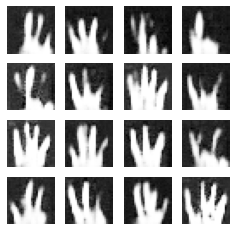

epoch 282/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-15.724428176879883, disc_loss=-0.7957735657691956
epoch 283/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.70it/s]


Time=0.2766 sec, gen_loss=-15.75484561920166, disc_loss=-0.8315224647521973
epoch 284/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2753 sec, gen_loss=-15.933281898498535, disc_loss=-0.9093438386917114
epoch 285/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.75it/s]


Time=0.2731 sec, gen_loss=-15.928375244140625, disc_loss=-0.7965901494026184
epoch 286/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2732 sec, gen_loss=-16.255090713500977, disc_loss=-0.6752563714981079
epoch 287/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-16.003231048583984, disc_loss=-0.8593258857727051
epoch 288/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-16.126720428466797, disc_loss=-0.9108184576034546
epoch 289/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2723 sec, gen_loss=-16.93141746520996, disc_loss=-0.8580418825149536
epoch 290/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.05it/s]


Time=0.2728 sec, gen_loss=-16.099082946777344, disc_loss=-0.666141152381897
epoch 291/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.29it/s]


Time=0.2740 sec, gen_loss=-16.30938148498535, disc_loss=-0.8190233707427979


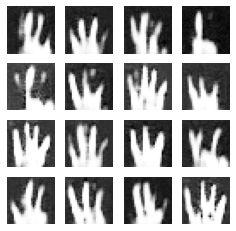

epoch 292/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.66it/s]


Time=0.2724 sec, gen_loss=-16.381336212158203, disc_loss=-0.8511333465576172
epoch 293/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-16.184593200683594, disc_loss=-0.8070234060287476
epoch 294/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-15.637595176696777, disc_loss=-0.8251960277557373
epoch 295/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2733 sec, gen_loss=-15.820478439331055, disc_loss=-0.7906075716018677
epoch 296/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2729 sec, gen_loss=-15.474872589111328, disc_loss=-0.8138300180435181
epoch 297/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-16.02105712890625, disc_loss=-0.8278802633285522
epoch 298/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.20it/s]


Time=0.2754 sec, gen_loss=-15.920904159545898, disc_loss=-0.8197629451751709
epoch 299/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.84it/s]


Time=0.2707 sec, gen_loss=-16.686094284057617, disc_loss=-0.8285015821456909
epoch 300/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.62it/s]


Time=0.2746 sec, gen_loss=-16.343379974365234, disc_loss=-0.81495201587677
epoch 301/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.59it/s]


Time=0.2728 sec, gen_loss=-15.644041061401367, disc_loss=-0.9079592227935791


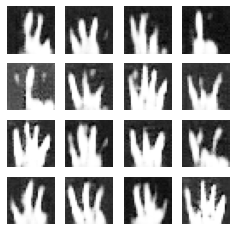

epoch 302/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.42it/s]


Time=0.2745 sec, gen_loss=-16.566810607910156, disc_loss=-0.8196074962615967
epoch 303/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.85it/s]


Time=0.2726 sec, gen_loss=-16.7373046875, disc_loss=-0.8504965305328369
epoch 304/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.65it/s]


Time=0.2725 sec, gen_loss=-15.949005126953125, disc_loss=-0.8153451681137085
epoch 305/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2728 sec, gen_loss=-15.740849494934082, disc_loss=-0.7340772151947021
epoch 306/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.86it/s]


Time=0.2736 sec, gen_loss=-16.579147338867188, disc_loss=-0.8959947824478149
epoch 307/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2753 sec, gen_loss=-16.179882049560547, disc_loss=-0.8011853694915771
epoch 308/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.40it/s]


Time=0.2704 sec, gen_loss=-16.21868896484375, disc_loss=-0.7256430983543396
epoch 309/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.98it/s]


Time=0.2731 sec, gen_loss=-15.830755233764648, disc_loss=-0.9048207998275757
epoch 310/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.37it/s]


Time=0.2737 sec, gen_loss=-15.74947738647461, disc_loss=-0.8842219114303589
epoch 311/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2713 sec, gen_loss=-16.217975616455078, disc_loss=-0.8446407318115234


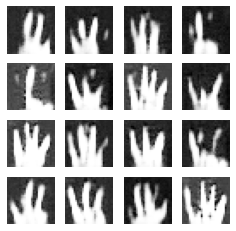

epoch 312/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.17it/s]


Time=0.2755 sec, gen_loss=-16.250999450683594, disc_loss=-0.8134053945541382
epoch 313/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2699 sec, gen_loss=-16.553733825683594, disc_loss=-0.8797075748443604
epoch 314/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2718 sec, gen_loss=-16.230762481689453, disc_loss=-0.8492242097854614
epoch 315/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2738 sec, gen_loss=-15.609766006469727, disc_loss=-0.8543885946273804
epoch 316/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2728 sec, gen_loss=-16.352535247802734, disc_loss=-0.8864781856536865
epoch 317/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.12it/s]


Time=0.2757 sec, gen_loss=-16.344322204589844, disc_loss=-0.7820292711257935
epoch 318/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2724 sec, gen_loss=-16.012651443481445, disc_loss=-0.8847283720970154
epoch 319/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.02it/s]


Time=0.2709 sec, gen_loss=-15.079341888427734, disc_loss=-0.7455995082855225
epoch 320/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2734 sec, gen_loss=-15.51773738861084, disc_loss=-0.9739724397659302
epoch 321/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2703 sec, gen_loss=-15.892812728881836, disc_loss=-0.8493117690086365


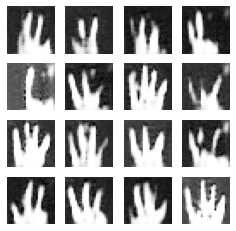

epoch 322/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.85it/s]


Time=0.2727 sec, gen_loss=-16.393539428710938, disc_loss=-0.7582165598869324
epoch 323/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.03it/s]


Time=0.2709 sec, gen_loss=-16.537614822387695, disc_loss=-0.8539817333221436
epoch 324/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-15.987237930297852, disc_loss=-0.8636888265609741
epoch 325/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.88it/s]


Time=0.2758 sec, gen_loss=-15.58836555480957, disc_loss=-0.8246231079101562
epoch 326/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2733 sec, gen_loss=-15.718809127807617, disc_loss=-0.881925106048584
epoch 327/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.21it/s]


Time=0.2744 sec, gen_loss=-15.668916702270508, disc_loss=-0.6700733304023743
epoch 328/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-16.076457977294922, disc_loss=-0.7691911458969116
epoch 329/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.65it/s]


Time=0.2735 sec, gen_loss=-16.21180534362793, disc_loss=-0.7589609622955322
epoch 330/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2709 sec, gen_loss=-16.034822463989258, disc_loss=-0.7131315469741821
epoch 331/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.64it/s]


Time=0.2735 sec, gen_loss=-15.641193389892578, disc_loss=-0.8041006326675415


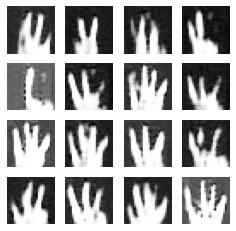

epoch 332/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.75it/s]


Time=0.2731 sec, gen_loss=-15.436101913452148, disc_loss=-0.8732774257659912
epoch 333/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-15.346406936645508, disc_loss=-0.8167481422424316
epoch 334/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2733 sec, gen_loss=-16.268625259399414, disc_loss=-0.642251193523407
epoch 335/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.03it/s]


Time=0.2709 sec, gen_loss=-16.429027557373047, disc_loss=-0.7448675632476807
epoch 336/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.88it/s]


Time=0.2722 sec, gen_loss=-15.775239944458008, disc_loss=-0.7582004070281982
epoch 337/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.63it/s]


Time=0.2726 sec, gen_loss=-15.379494667053223, disc_loss=-0.8060178756713867
epoch 338/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.13it/s]


Time=0.2695 sec, gen_loss=-15.2324800491333, disc_loss=-0.7551091909408569
epoch 339/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2729 sec, gen_loss=-15.540740013122559, disc_loss=-0.7253286838531494
epoch 340/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2713 sec, gen_loss=-15.70388412475586, disc_loss=-0.7648807764053345
epoch 341/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2738 sec, gen_loss=-15.873198509216309, disc_loss=-0.7757769823074341


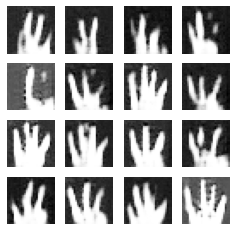

epoch 342/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2734 sec, gen_loss=-16.210609436035156, disc_loss=-0.7816134691238403
epoch 343/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2744 sec, gen_loss=-16.275659561157227, disc_loss=-0.8020086884498596
epoch 344/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2713 sec, gen_loss=-15.414072036743164, disc_loss=-0.8104379177093506
epoch 345/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2722 sec, gen_loss=-15.342155456542969, disc_loss=-0.9169130325317383
epoch 346/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2748 sec, gen_loss=-16.266202926635742, disc_loss=-0.7776870131492615
epoch 347/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2743 sec, gen_loss=-17.061559677124023, disc_loss=-0.6801356077194214
epoch 348/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2729 sec, gen_loss=-16.17290687561035, disc_loss=-0.7440505623817444
epoch 349/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.76it/s]


Time=0.2720 sec, gen_loss=-15.457439422607422, disc_loss=-0.8384146094322205
epoch 350/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.78it/s]


Time=0.2749 sec, gen_loss=-15.573882102966309, disc_loss=-0.7926497459411621
epoch 351/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-15.352054595947266, disc_loss=-0.7789881229400635


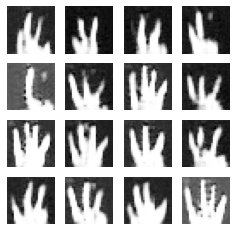

epoch 352/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2743 sec, gen_loss=-15.554655075073242, disc_loss=-0.8091119527816772
epoch 353/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.72it/s]


Time=0.2722 sec, gen_loss=-16.196029663085938, disc_loss=-0.7184047698974609
epoch 354/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2738 sec, gen_loss=-15.335433959960938, disc_loss=-0.8027544617652893
epoch 355/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-15.162680625915527, disc_loss=-0.7279776930809021
epoch 356/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.67it/s]


Time=0.2744 sec, gen_loss=-15.76051139831543, disc_loss=-0.8242443799972534
epoch 357/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.90it/s]


Time=0.2777 sec, gen_loss=-15.98650074005127, disc_loss=-0.6680375933647156
epoch 358/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2754 sec, gen_loss=-15.575847625732422, disc_loss=-0.7410051822662354
epoch 359/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.57it/s]


Time=0.2738 sec, gen_loss=-15.83027172088623, disc_loss=-0.8685100674629211
epoch 360/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.64it/s]


Time=0.2745 sec, gen_loss=-15.79370403289795, disc_loss=-0.8668140172958374
epoch 361/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2743 sec, gen_loss=-15.917743682861328, disc_loss=-0.6673401594161987


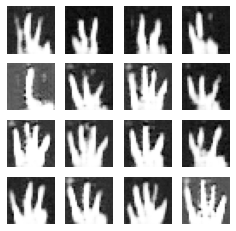

epoch 362/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.13it/s]


Time=0.2715 sec, gen_loss=-16.030433654785156, disc_loss=-0.7684730291366577
epoch 363/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2703 sec, gen_loss=-15.42940902709961, disc_loss=-0.7723541259765625
epoch 364/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.00it/s]


Time=0.2720 sec, gen_loss=-15.290867805480957, disc_loss=-0.7708929777145386
epoch 365/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.62it/s]


Time=0.2695 sec, gen_loss=-15.432315826416016, disc_loss=-0.8843944668769836
epoch 366/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2693 sec, gen_loss=-16.136911392211914, disc_loss=-0.8556725382804871
epoch 367/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2783 sec, gen_loss=-16.241483688354492, disc_loss=-0.8410962820053101
epoch 368/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.11it/s]


Time=0.2758 sec, gen_loss=-16.112794876098633, disc_loss=-0.8468804359436035
epoch 369/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.67it/s]


Time=0.2698 sec, gen_loss=-16.057201385498047, disc_loss=-0.797944188117981
epoch 370/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.36it/s]


Time=0.2705 sec, gen_loss=-16.270952224731445, disc_loss=-0.7570151090621948
epoch 371/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.03it/s]


Time=0.2757 sec, gen_loss=-15.87314224243164, disc_loss=-0.7075223326683044


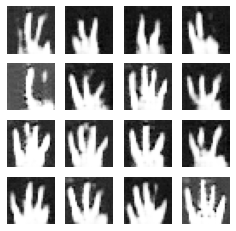

epoch 372/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.46it/s]


Time=0.2781 sec, gen_loss=-15.209182739257812, disc_loss=-0.8335238695144653
epoch 373/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.81it/s]


Time=0.2786 sec, gen_loss=-15.418073654174805, disc_loss=-0.711524248123169
epoch 374/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2782 sec, gen_loss=-15.184694290161133, disc_loss=-0.7110970616340637
epoch 375/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.14it/s]


Time=0.2757 sec, gen_loss=-15.318412780761719, disc_loss=-0.7383506298065186
epoch 376/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.20it/s]


Time=0.2706 sec, gen_loss=-15.799769401550293, disc_loss=-0.7460401058197021
epoch 377/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.77it/s]


Time=0.2688 sec, gen_loss=-15.742680549621582, disc_loss=-0.8712344169616699
epoch 378/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.35it/s]


Time=0.2691 sec, gen_loss=-16.587696075439453, disc_loss=-0.7200449109077454
epoch 379/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.37it/s]


Time=0.2695 sec, gen_loss=-15.654653549194336, disc_loss=-0.8394468426704407
epoch 380/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2758 sec, gen_loss=-16.04147720336914, disc_loss=-0.7546552419662476
epoch 381/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2739 sec, gen_loss=-15.595535278320312, disc_loss=-0.687775731086731


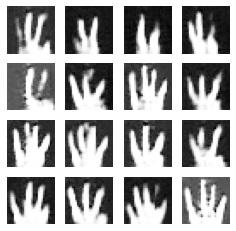

epoch 382/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.13it/s]


Time=0.2767 sec, gen_loss=-14.750837326049805, disc_loss=-0.8520170450210571
epoch 383/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-15.507631301879883, disc_loss=-0.8180564641952515
epoch 384/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2713 sec, gen_loss=-15.813541412353516, disc_loss=-0.8022580742835999
epoch 385/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.31it/s]


Time=0.2739 sec, gen_loss=-15.346792221069336, disc_loss=-0.6126719117164612
epoch 386/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.04it/s]


Time=0.2771 sec, gen_loss=-15.597151756286621, disc_loss=-0.6837714910507202
epoch 387/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.07it/s]


Time=0.2770 sec, gen_loss=-15.721896171569824, disc_loss=-0.7662418484687805
epoch 388/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2763 sec, gen_loss=-15.840460777282715, disc_loss=-0.760155200958252
epoch 389/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-15.747506141662598, disc_loss=-0.7425748109817505
epoch 390/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.36it/s]


Time=0.2747 sec, gen_loss=-15.679693222045898, disc_loss=-0.7897155284881592
epoch 391/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.87it/s]


Time=0.2768 sec, gen_loss=-15.392175674438477, disc_loss=-0.7893432378768921


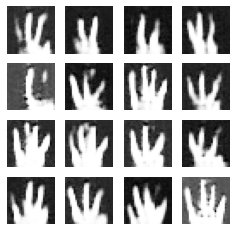

epoch 392/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2713 sec, gen_loss=-15.87821102142334, disc_loss=-0.8074549436569214
epoch 393/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.01it/s]


Time=0.2763 sec, gen_loss=-15.566351890563965, disc_loss=-0.6978937387466431
epoch 394/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2732 sec, gen_loss=-15.332603454589844, disc_loss=-0.8944288492202759
epoch 395/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2773 sec, gen_loss=-15.324359893798828, disc_loss=-0.8051592707633972
epoch 396/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.06it/s]


Time=0.2760 sec, gen_loss=-15.526752471923828, disc_loss=-0.863113522529602
epoch 397/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2753 sec, gen_loss=-14.734965324401855, disc_loss=-0.8041211366653442
epoch 398/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.20it/s]


Time=0.2764 sec, gen_loss=-15.506729125976562, disc_loss=-0.6860557794570923
epoch 399/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2712 sec, gen_loss=-15.793100357055664, disc_loss=-0.8091801404953003
epoch 400/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.72it/s]


Time=0.2736 sec, gen_loss=-15.967758178710938, disc_loss=-0.7059884667396545
epoch 401/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.20it/s]


Time=0.2744 sec, gen_loss=-15.575750350952148, disc_loss=-0.8651151657104492


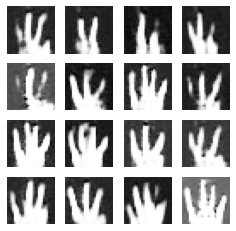

epoch 402/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.31it/s]


Time=0.2749 sec, gen_loss=-15.918603897094727, disc_loss=-0.6644910573959351
epoch 403/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-14.807947158813477, disc_loss=-0.6796079874038696
epoch 404/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2732 sec, gen_loss=-15.396171569824219, disc_loss=-0.7762519121170044
epoch 405/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2763 sec, gen_loss=-16.189424514770508, disc_loss=-0.6643506288528442
epoch 406/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.31it/s]


Time=0.2793 sec, gen_loss=-16.124576568603516, disc_loss=-0.6564766764640808
epoch 407/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2757 sec, gen_loss=-15.403637886047363, disc_loss=-0.8961583375930786
epoch 408/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2733 sec, gen_loss=-15.178092956542969, disc_loss=-0.8335797190666199
epoch 409/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2803 sec, gen_loss=-14.587677001953125, disc_loss=-0.7626984119415283
epoch 410/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.20it/s]


Time=0.2862 sec, gen_loss=-14.913671493530273, disc_loss=-0.7810312509536743
epoch 411/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2753 sec, gen_loss=-15.51619815826416, disc_loss=-0.7757543921470642


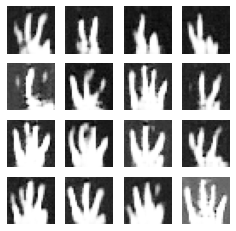

epoch 412/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.34it/s]


Time=0.2748 sec, gen_loss=-16.309123992919922, disc_loss=-0.8062968254089355
epoch 413/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.38it/s]


Time=0.2756 sec, gen_loss=-15.97728157043457, disc_loss=-0.7446029186248779
epoch 414/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.79it/s]


Time=0.2826 sec, gen_loss=-15.284259796142578, disc_loss=-0.8313236236572266
epoch 415/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.31it/s]


Time=0.2783 sec, gen_loss=-14.823328018188477, disc_loss=-0.784387469291687
epoch 416/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.08it/s]


Time=0.2813 sec, gen_loss=-15.175718307495117, disc_loss=-0.85917729139328
epoch 417/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.46it/s]


Time=0.2786 sec, gen_loss=-15.304149627685547, disc_loss=-0.6681123971939087
epoch 418/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.18it/s]


Time=0.2755 sec, gen_loss=-16.0782413482666, disc_loss=-0.7279443740844727
epoch 419/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.66it/s]


Time=0.2745 sec, gen_loss=-15.25760269165039, disc_loss=-0.6734356880187988
epoch 420/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.72it/s]


Time=0.2792 sec, gen_loss=-14.6760892868042, disc_loss=-0.6957399845123291
epoch 421/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2763 sec, gen_loss=-14.450950622558594, disc_loss=-0.8382924795150757


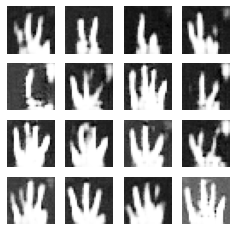

epoch 422/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.99it/s]


Time=0.2753 sec, gen_loss=-15.0691499710083, disc_loss=-0.8938917517662048
epoch 423/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2733 sec, gen_loss=-15.460554122924805, disc_loss=-0.9889565706253052
epoch 424/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2713 sec, gen_loss=-15.427088737487793, disc_loss=-0.7957065105438232
epoch 425/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2738 sec, gen_loss=-15.004316329956055, disc_loss=-0.734573483467102
epoch 426/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.10it/s]


Time=0.2767 sec, gen_loss=-15.78879451751709, disc_loss=-0.7931267023086548
epoch 427/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2773 sec, gen_loss=-16.002704620361328, disc_loss=-0.7604923844337463
epoch 428/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2773 sec, gen_loss=-15.204343795776367, disc_loss=-0.7411797046661377
epoch 429/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.99it/s]


Time=0.2763 sec, gen_loss=-13.897555351257324, disc_loss=-0.7474669218063354
epoch 430/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.32it/s]


Time=0.2792 sec, gen_loss=-14.213909149169922, disc_loss=-0.7777183055877686
epoch 431/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.87it/s]


Time=0.2758 sec, gen_loss=-14.496774673461914, disc_loss=-0.729638397693634


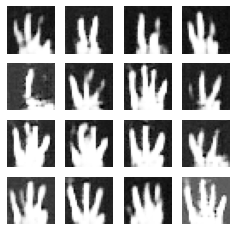

epoch 432/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2766 sec, gen_loss=-14.375055313110352, disc_loss=-0.8846645355224609
epoch 433/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2733 sec, gen_loss=-14.531698226928711, disc_loss=-0.8046205043792725
epoch 434/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-15.451398849487305, disc_loss=-0.6532641053199768
epoch 435/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.99it/s]


Time=0.2763 sec, gen_loss=-15.09278678894043, disc_loss=-0.762475311756134
epoch 436/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2757 sec, gen_loss=-15.434846878051758, disc_loss=-0.7581283450126648
epoch 437/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2773 sec, gen_loss=-15.517148971557617, disc_loss=-0.677935004234314
epoch 438/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.34it/s]


Time=0.2748 sec, gen_loss=-15.314899444580078, disc_loss=-0.7333499193191528
epoch 439/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.51it/s]


Time=0.2751 sec, gen_loss=-14.368125915527344, disc_loss=-0.6980400085449219
epoch 440/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2751 sec, gen_loss=-14.277591705322266, disc_loss=-0.7411141395568848
epoch 441/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-14.884613037109375, disc_loss=-0.8028749227523804


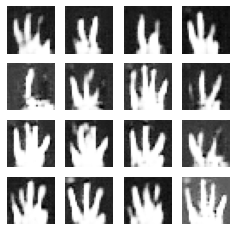

epoch 442/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.89it/s]


Time=0.2767 sec, gen_loss=-14.644140243530273, disc_loss=-0.7656601071357727
epoch 443/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.57it/s]


Time=0.2732 sec, gen_loss=-14.79261589050293, disc_loss=-0.7918956279754639
epoch 444/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2748 sec, gen_loss=-14.721253395080566, disc_loss=-0.8642881512641907
epoch 445/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2773 sec, gen_loss=-14.132448196411133, disc_loss=-0.684083104133606
epoch 446/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.88it/s]


Time=0.2768 sec, gen_loss=-14.4159517288208, disc_loss=-0.6644443273544312
epoch 447/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.09it/s]


Time=0.2792 sec, gen_loss=-14.504199028015137, disc_loss=-0.9162651300430298
epoch 448/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2733 sec, gen_loss=-14.875844955444336, disc_loss=-0.6172787547111511
epoch 449/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2763 sec, gen_loss=-15.268310546875, disc_loss=-0.6912182569503784
epoch 450/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-15.056013107299805, disc_loss=-0.82012939453125
epoch 451/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-14.200940132141113, disc_loss=-0.7588869333267212


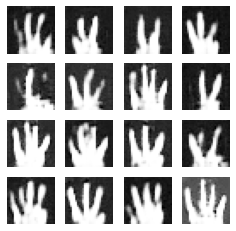

epoch 452/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.02it/s]


Time=0.2752 sec, gen_loss=-14.511249542236328, disc_loss=-0.6608250141143799
epoch 453/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.51it/s]


Time=0.2741 sec, gen_loss=-14.83952522277832, disc_loss=-0.6265741586685181
epoch 454/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2739 sec, gen_loss=-15.019797325134277, disc_loss=-0.6347411870956421
epoch 455/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2763 sec, gen_loss=-15.165525436401367, disc_loss=-0.747022271156311
epoch 456/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2773 sec, gen_loss=-15.398002624511719, disc_loss=-0.9233578443527222
epoch 457/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2738 sec, gen_loss=-15.734159469604492, disc_loss=-0.7228745222091675
epoch 458/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2742 sec, gen_loss=-14.935001373291016, disc_loss=-0.77890545129776
epoch 459/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.39it/s]


Time=0.2746 sec, gen_loss=-14.329034805297852, disc_loss=-0.7625002861022949
epoch 460/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2708 sec, gen_loss=-14.885478973388672, disc_loss=-0.8007282018661499
epoch 461/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.39it/s]


Time=0.2746 sec, gen_loss=-14.56074333190918, disc_loss=-0.9286001920700073


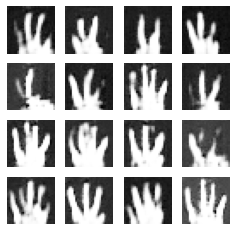

epoch 462/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.62it/s]


Time=0.2736 sec, gen_loss=-14.101507186889648, disc_loss=-0.8285627961158752
epoch 463/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.76it/s]


Time=0.2720 sec, gen_loss=-14.193107604980469, disc_loss=-0.7653471231460571
epoch 464/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.52it/s]


Time=0.2751 sec, gen_loss=-14.521517753601074, disc_loss=-0.7631574869155884
epoch 465/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.41it/s]


Time=0.2735 sec, gen_loss=-15.236671447753906, disc_loss=-0.6731113791465759
epoch 466/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.19it/s]


Time=0.2712 sec, gen_loss=-15.375799179077148, disc_loss=-0.7860628366470337
epoch 467/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-15.353239059448242, disc_loss=-0.743759036064148
epoch 468/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2743 sec, gen_loss=-15.673297882080078, disc_loss=-0.7884333729743958
epoch 469/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.24it/s]


Time=0.2720 sec, gen_loss=-15.060311317443848, disc_loss=-0.6488356590270996
epoch 470/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.76it/s]


Time=0.2722 sec, gen_loss=-14.987829208374023, disc_loss=-0.8321620225906372
epoch 471/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2703 sec, gen_loss=-14.264814376831055, disc_loss=-0.6973087787628174


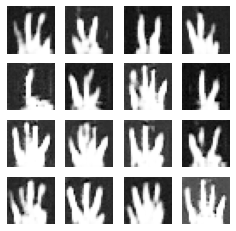

epoch 472/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.48it/s]


Time=0.2690 sec, gen_loss=-14.155759811401367, disc_loss=-0.7695342898368835
epoch 473/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2703 sec, gen_loss=-15.095735549926758, disc_loss=-0.9159917235374451
epoch 474/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.08it/s]


Time=0.2717 sec, gen_loss=-15.827692031860352, disc_loss=-0.859673023223877
epoch 475/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.21it/s]


Time=0.2702 sec, gen_loss=-15.65495777130127, disc_loss=-0.8601531386375427
epoch 476/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2706 sec, gen_loss=-15.251090049743652, disc_loss=-0.7105017900466919
epoch 477/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.11it/s]


Time=0.2768 sec, gen_loss=-14.702499389648438, disc_loss=-0.8048968315124512
epoch 478/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-15.250142097473145, disc_loss=-0.8218920230865479
epoch 479/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.67it/s]


Time=0.2683 sec, gen_loss=-14.888155937194824, disc_loss=-0.7680103778839111
epoch 480/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.74it/s]


Time=0.2731 sec, gen_loss=-15.13622760772705, disc_loss=-0.7985128164291382
epoch 481/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.57it/s]


Time=0.2697 sec, gen_loss=-15.381425857543945, disc_loss=-0.6850237846374512


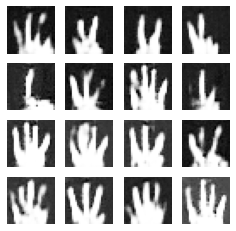

epoch 482/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.57it/s]


Time=0.2687 sec, gen_loss=-15.124635696411133, disc_loss=-0.6953503489494324
epoch 483/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.03it/s]


Time=0.2725 sec, gen_loss=-14.917989730834961, disc_loss=-0.7713010907173157
epoch 484/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.52it/s]


Time=0.2750 sec, gen_loss=-14.820343971252441, disc_loss=-0.7222489714622498
epoch 485/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2741 sec, gen_loss=-14.412219047546387, disc_loss=-0.8093056678771973
epoch 486/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2733 sec, gen_loss=-15.235240936279297, disc_loss=-0.7176443338394165
epoch 487/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.31it/s]


Time=0.2783 sec, gen_loss=-15.007949829101562, disc_loss=-0.676459789276123
epoch 488/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.32it/s]


Time=0.2749 sec, gen_loss=-14.478245735168457, disc_loss=-0.7442464828491211
epoch 489/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.56it/s]


Time=0.2739 sec, gen_loss=-15.028680801391602, disc_loss=-0.7193709015846252
epoch 490/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2743 sec, gen_loss=-15.217720031738281, disc_loss=-0.673827588558197
epoch 491/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.07it/s]


Time=0.2717 sec, gen_loss=-15.373910903930664, disc_loss=-0.5697071552276611


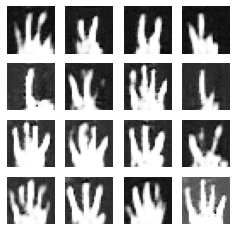

epoch 492/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.91it/s]


Time=0.2725 sec, gen_loss=-14.709169387817383, disc_loss=-0.7641119956970215
epoch 493/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2703 sec, gen_loss=-15.390283584594727, disc_loss=-0.8333405256271362
epoch 494/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2713 sec, gen_loss=-15.575714111328125, disc_loss=-0.799321174621582
epoch 495/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2738 sec, gen_loss=-14.925737380981445, disc_loss=-0.7938222885131836
epoch 496/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.84it/s]


Time=0.2727 sec, gen_loss=-14.951150894165039, disc_loss=-0.6673005223274231
epoch 497/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.88it/s]


Time=0.2758 sec, gen_loss=-15.142717361450195, disc_loss=-0.75055330991745
epoch 498/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2733 sec, gen_loss=-14.214027404785156, disc_loss=-0.7357280254364014
epoch 499/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-13.515947341918945, disc_loss=-0.7064510583877563
epoch 500/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2723 sec, gen_loss=-14.533609390258789, disc_loss=-0.7641839385032654
epoch 501/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.75it/s]


Time=0.2731 sec, gen_loss=-15.56535530090332, disc_loss=-0.8045979142189026


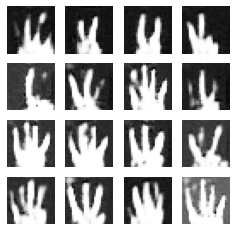

epoch 502/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-15.786580085754395, disc_loss=-0.7358333468437195
epoch 503/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2760 sec, gen_loss=-15.116105079650879, disc_loss=-0.8046137094497681
epoch 504/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2753 sec, gen_loss=-15.262725830078125, disc_loss=-0.7458099126815796
epoch 505/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.35it/s]


Time=0.2697 sec, gen_loss=-15.317343711853027, disc_loss=-0.7914664149284363
epoch 506/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.50it/s]


Time=0.2751 sec, gen_loss=-14.929752349853516, disc_loss=-0.7770497798919678
epoch 507/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.11it/s]


Time=0.2758 sec, gen_loss=-14.557241439819336, disc_loss=-0.7262948751449585
epoch 508/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.82it/s]


Time=0.2728 sec, gen_loss=-14.576456069946289, disc_loss=-0.7733420729637146
epoch 509/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.83it/s]


Time=0.2769 sec, gen_loss=-15.302555084228516, disc_loss=-0.7898644208908081
epoch 510/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.31it/s]


Time=0.2749 sec, gen_loss=-15.283092498779297, disc_loss=-0.8913601636886597
epoch 511/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-14.831783294677734, disc_loss=-0.7590909004211426


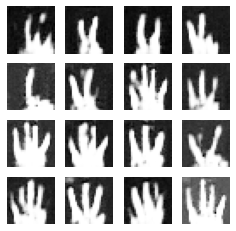

epoch 512/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.38it/s]


Time=0.2736 sec, gen_loss=-14.77604866027832, disc_loss=-0.7541526556015015
epoch 513/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2723 sec, gen_loss=-14.650609970092773, disc_loss=-0.7314236164093018
epoch 514/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-14.266885757446289, disc_loss=-0.7668113708496094
epoch 515/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-15.23834228515625, disc_loss=-0.7554152011871338
epoch 516/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.93it/s]


Time=0.2756 sec, gen_loss=-15.74616813659668, disc_loss=-0.7251766920089722
epoch 517/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-14.949705123901367, disc_loss=-0.6484013795852661
epoch 518/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2723 sec, gen_loss=-14.117884635925293, disc_loss=-0.6731070280075073
epoch 519/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-14.577620506286621, disc_loss=-0.5319395065307617
epoch 520/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.16it/s]


Time=0.2714 sec, gen_loss=-14.935020446777344, disc_loss=-0.800260066986084
epoch 521/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2732 sec, gen_loss=-14.814908981323242, disc_loss=-0.905556857585907


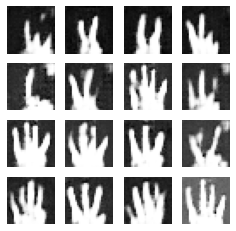

epoch 522/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-14.764114379882812, disc_loss=-0.7454162240028381
epoch 523/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.55it/s]


Time=0.2792 sec, gen_loss=-14.20156192779541, disc_loss=-0.7551324367523193
epoch 524/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2783 sec, gen_loss=-14.361964225769043, disc_loss=-0.745566189289093
epoch 525/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.67it/s]


Time=0.2724 sec, gen_loss=-14.076170921325684, disc_loss=-0.6401380300521851
epoch 526/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2763 sec, gen_loss=-14.997304916381836, disc_loss=-0.6967756748199463
epoch 527/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.96it/s]


Time=0.2712 sec, gen_loss=-15.730454444885254, disc_loss=-0.7131878733634949
epoch 528/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2723 sec, gen_loss=-14.713558197021484, disc_loss=-0.662857174873352
epoch 529/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-13.676721572875977, disc_loss=-0.8024641275405884
epoch 530/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.88it/s]


Time=0.2725 sec, gen_loss=-13.683950424194336, disc_loss=-0.6675860285758972
epoch 531/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2733 sec, gen_loss=-14.024168968200684, disc_loss=-0.6402454972267151


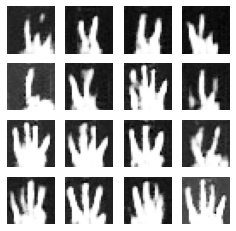

epoch 532/1500: 


100%|██████████| 16/16 [00:00<00:00, 56.48it/s]


Time=0.2992 sec, gen_loss=-14.661657333374023, disc_loss=-0.7822633981704712
epoch 533/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2732 sec, gen_loss=-15.13086986541748, disc_loss=-0.7720820903778076
epoch 534/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2713 sec, gen_loss=-13.983936309814453, disc_loss=-0.7821857929229736
epoch 535/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-13.649237632751465, disc_loss=-0.843298077583313
epoch 536/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.51it/s]


Time=0.2741 sec, gen_loss=-14.386786460876465, disc_loss=-0.8915790915489197
epoch 537/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-15.287057876586914, disc_loss=-0.8536974191665649
epoch 538/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.20it/s]


Time=0.2712 sec, gen_loss=-15.035364151000977, disc_loss=-0.6610854864120483
epoch 539/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2742 sec, gen_loss=-14.435040473937988, disc_loss=-0.8063591122627258
epoch 540/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-13.751888275146484, disc_loss=-0.752506673336029
epoch 541/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.87it/s]


Time=0.2758 sec, gen_loss=-14.145605087280273, disc_loss=-0.8485508561134338


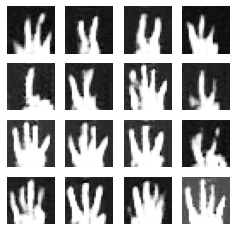

epoch 542/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.36it/s]


Time=0.2790 sec, gen_loss=-14.759156227111816, disc_loss=-0.7460694313049316
epoch 543/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2738 sec, gen_loss=-14.79002571105957, disc_loss=-0.8659794330596924
epoch 544/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2773 sec, gen_loss=-15.190177917480469, disc_loss=-0.6652349233627319
epoch 545/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2743 sec, gen_loss=-14.113118171691895, disc_loss=-0.7329614162445068
epoch 546/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2767 sec, gen_loss=-14.552050590515137, disc_loss=-0.6535665988922119
epoch 547/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2783 sec, gen_loss=-14.829248428344727, disc_loss=-0.74455326795578
epoch 548/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.82it/s]


Time=0.2718 sec, gen_loss=-15.124197006225586, disc_loss=-0.5946807861328125
epoch 549/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.40it/s]


Time=0.2714 sec, gen_loss=-14.73031997680664, disc_loss=-0.7383350133895874
epoch 550/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2746 sec, gen_loss=-14.322067260742188, disc_loss=-0.8095070123672485
epoch 551/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-13.793159484863281, disc_loss=-0.6384170055389404


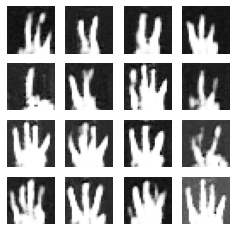

epoch 552/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.55it/s]


Time=0.2749 sec, gen_loss=-13.920291900634766, disc_loss=-0.6549355983734131
epoch 553/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2718 sec, gen_loss=-15.652533531188965, disc_loss=-0.8063565492630005
epoch 554/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2718 sec, gen_loss=-16.19582176208496, disc_loss=-0.872771680355072
epoch 555/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-14.859148979187012, disc_loss=-0.7411401867866516
epoch 556/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2742 sec, gen_loss=-14.708697319030762, disc_loss=-0.7444292902946472
epoch 557/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2783 sec, gen_loss=-15.531240463256836, disc_loss=-0.7594366669654846
epoch 558/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2728 sec, gen_loss=-15.502974510192871, disc_loss=-0.6667512655258179
epoch 559/1500: 


100%|██████████| 16/16 [00:00<00:00, 52.59it/s]


Time=0.3177 sec, gen_loss=-14.530385971069336, disc_loss=-0.6019868850708008
epoch 560/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2792 sec, gen_loss=-13.847663879394531, disc_loss=-0.63472580909729
epoch 561/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.49it/s]


Time=0.2795 sec, gen_loss=-13.831464767456055, disc_loss=-0.7870587110519409


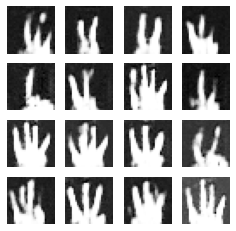

epoch 562/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2739 sec, gen_loss=-15.031744003295898, disc_loss=-0.6891531944274902
epoch 563/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-15.111953735351562, disc_loss=-0.8602700233459473
epoch 564/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.06it/s]


Time=0.2708 sec, gen_loss=-14.959676742553711, disc_loss=-0.8475472927093506
epoch 565/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-14.455755233764648, disc_loss=-0.714497447013855
epoch 566/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2783 sec, gen_loss=-14.177335739135742, disc_loss=-0.7203608155250549
epoch 567/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2783 sec, gen_loss=-14.611289978027344, disc_loss=-0.8357347846031189
epoch 568/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-14.942110061645508, disc_loss=-0.6870669722557068
epoch 569/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2753 sec, gen_loss=-14.676809310913086, disc_loss=-0.7844256162643433
epoch 570/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2763 sec, gen_loss=-14.578487396240234, disc_loss=-0.8164076209068298
epoch 571/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.32it/s]


Time=0.2749 sec, gen_loss=-14.522083282470703, disc_loss=-0.6544216871261597


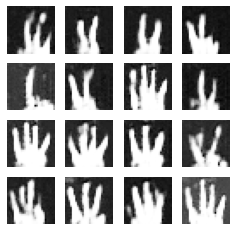

epoch 572/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2723 sec, gen_loss=-14.740358352661133, disc_loss=-0.6165949106216431
epoch 573/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2743 sec, gen_loss=-14.275117874145508, disc_loss=-0.7538250684738159
epoch 574/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.47it/s]


Time=0.2711 sec, gen_loss=-14.622303009033203, disc_loss=-0.8018983006477356
epoch 575/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-15.060798645019531, disc_loss=-0.7149076461791992
epoch 576/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2733 sec, gen_loss=-14.903704643249512, disc_loss=-0.8244296312332153
epoch 577/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2763 sec, gen_loss=-14.50030517578125, disc_loss=-0.6480920314788818
epoch 578/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2743 sec, gen_loss=-13.837257385253906, disc_loss=-0.6115328073501587
epoch 579/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.29it/s]


Time=0.2708 sec, gen_loss=-14.984313011169434, disc_loss=-0.7014952898025513
epoch 580/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2753 sec, gen_loss=-14.999656677246094, disc_loss=-0.6265895366668701
epoch 581/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.06it/s]


Time=0.2713 sec, gen_loss=-14.2645263671875, disc_loss=-0.6883788704872131


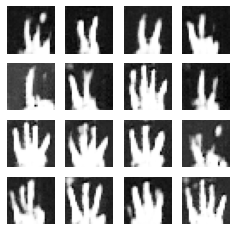

epoch 582/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.65it/s]


Time=0.2704 sec, gen_loss=-14.203861236572266, disc_loss=-0.8495208024978638
epoch 583/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2744 sec, gen_loss=-14.351364135742188, disc_loss=-0.7830361127853394
epoch 584/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2718 sec, gen_loss=-14.59555435180664, disc_loss=-0.6876488924026489
epoch 585/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.54it/s]


Time=0.2729 sec, gen_loss=-14.969042778015137, disc_loss=-0.7333237528800964
epoch 586/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.51it/s]


Time=0.2741 sec, gen_loss=-14.420221328735352, disc_loss=-0.6774992346763611
epoch 587/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.01it/s]


Time=0.2782 sec, gen_loss=-14.461115837097168, disc_loss=-0.7219387292861938
epoch 588/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.44it/s]


Time=0.2787 sec, gen_loss=-14.592357635498047, disc_loss=-0.6504045724868774
epoch 589/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2723 sec, gen_loss=-14.297637939453125, disc_loss=-0.6004276275634766
epoch 590/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2753 sec, gen_loss=-13.982708930969238, disc_loss=-0.6647428870201111
epoch 591/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-14.47558307647705, disc_loss=-0.8554074764251709


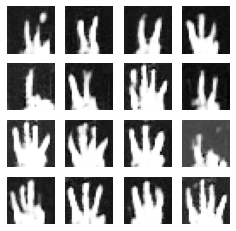

epoch 592/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.64it/s]


Time=0.2768 sec, gen_loss=-14.868959426879883, disc_loss=-0.875026285648346
epoch 593/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2733 sec, gen_loss=-14.709657669067383, disc_loss=-0.997959315776825
epoch 594/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2773 sec, gen_loss=-14.291275024414062, disc_loss=-0.8389372825622559
epoch 595/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.32it/s]


Time=0.2792 sec, gen_loss=-13.425975799560547, disc_loss=-0.8070217370986938
epoch 596/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.31it/s]


Time=0.2793 sec, gen_loss=-13.84097671508789, disc_loss=-0.657806396484375
epoch 597/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.11it/s]


Time=0.2758 sec, gen_loss=-15.044639587402344, disc_loss=-0.7730690240859985
epoch 598/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.98it/s]


Time=0.2763 sec, gen_loss=-15.669395446777344, disc_loss=-0.8058941960334778
epoch 599/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.86it/s]


Time=0.2778 sec, gen_loss=-15.22091293334961, disc_loss=-0.8174455165863037
epoch 600/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.34it/s]


Time=0.2758 sec, gen_loss=-13.80059814453125, disc_loss=-0.6068263649940491
epoch 601/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.30it/s]


Time=0.2793 sec, gen_loss=-13.182833671569824, disc_loss=-0.8726050853729248


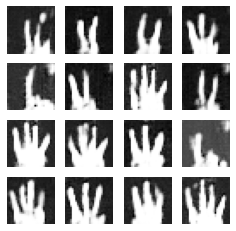

epoch 602/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.49it/s]


Time=0.2785 sec, gen_loss=-13.733481407165527, disc_loss=-0.7527557015419006
epoch 603/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2748 sec, gen_loss=-14.701406478881836, disc_loss=-0.7482839226722717
epoch 604/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2743 sec, gen_loss=-15.013223648071289, disc_loss=-0.7876866459846497
epoch 605/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2763 sec, gen_loss=-13.844011306762695, disc_loss=-0.6477193236351013
epoch 606/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2758 sec, gen_loss=-14.003427505493164, disc_loss=-0.7711538076400757
epoch 607/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.21it/s]


Time=0.2744 sec, gen_loss=-14.254096984863281, disc_loss=-0.7931854724884033
epoch 608/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2747 sec, gen_loss=-13.802762985229492, disc_loss=-0.8316768407821655
epoch 609/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2734 sec, gen_loss=-13.577211380004883, disc_loss=-0.5932189226150513
epoch 610/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-13.387527465820312, disc_loss=-0.786281943321228
epoch 611/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-13.613997459411621, disc_loss=-0.6838728189468384


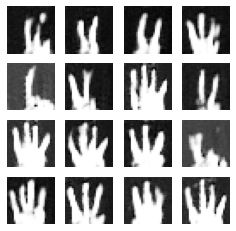

epoch 612/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.86it/s]


Time=0.2768 sec, gen_loss=-14.352461814880371, disc_loss=-0.7156723141670227
epoch 613/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2766 sec, gen_loss=-14.815990447998047, disc_loss=-0.7540479302406311
epoch 614/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2742 sec, gen_loss=-14.220609664916992, disc_loss=-0.8616241216659546
epoch 615/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.30it/s]


Time=0.2793 sec, gen_loss=-14.23289966583252, disc_loss=-0.670421838760376
epoch 616/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-14.395916938781738, disc_loss=-0.7153421640396118
epoch 617/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.98it/s]


Time=0.2817 sec, gen_loss=-14.390396118164062, disc_loss=-0.6537044048309326
epoch 618/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.11it/s]


Time=0.2758 sec, gen_loss=-13.438701629638672, disc_loss=-0.5781129002571106
epoch 619/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.54it/s]


Time=0.2750 sec, gen_loss=-13.379638671875, disc_loss=-0.7212800979614258
epoch 620/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.27it/s]


Time=0.2751 sec, gen_loss=-13.830148696899414, disc_loss=-0.7994534969329834
epoch 621/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.52it/s]


Time=0.2740 sec, gen_loss=-14.495370864868164, disc_loss=-0.6286556720733643


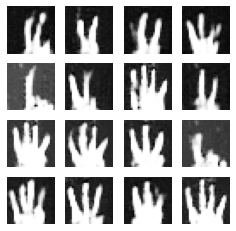

epoch 622/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.32it/s]


Time=0.2769 sec, gen_loss=-14.758173942565918, disc_loss=-0.7675204277038574
epoch 623/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.51it/s]


Time=0.2741 sec, gen_loss=-13.967841148376465, disc_loss=-0.7432636022567749
epoch 624/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.30it/s]


Time=0.2760 sec, gen_loss=-14.482133865356445, disc_loss=-0.6781398057937622
epoch 625/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.32it/s]


Time=0.2792 sec, gen_loss=-14.87210464477539, disc_loss=-0.709176242351532
epoch 626/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.99it/s]


Time=0.2773 sec, gen_loss=-14.447861671447754, disc_loss=-0.8766882419586182
epoch 627/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2783 sec, gen_loss=-14.209835052490234, disc_loss=-0.7671106457710266
epoch 628/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2753 sec, gen_loss=-14.11712646484375, disc_loss=-0.7957730293273926
epoch 629/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2778 sec, gen_loss=-13.959840774536133, disc_loss=-0.7326475381851196
epoch 630/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.71it/s]


Time=0.2765 sec, gen_loss=-13.920401573181152, disc_loss=-0.6281214952468872
epoch 631/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2764 sec, gen_loss=-13.775224685668945, disc_loss=-0.6781986355781555


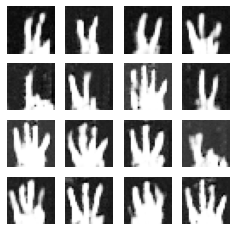

epoch 632/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2734 sec, gen_loss=-13.815414428710938, disc_loss=-0.8624914884567261
epoch 633/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.72it/s]


Time=0.2722 sec, gen_loss=-14.32790756225586, disc_loss=-0.7427085041999817
epoch 634/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.57it/s]


Time=0.2738 sec, gen_loss=-14.876148223876953, disc_loss=-0.6697322130203247
epoch 635/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.31it/s]


Time=0.2793 sec, gen_loss=-14.787397384643555, disc_loss=-0.7599633932113647
epoch 636/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.97it/s]


Time=0.2798 sec, gen_loss=-14.10317611694336, disc_loss=-0.6906222105026245
epoch 637/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2763 sec, gen_loss=-14.397917747497559, disc_loss=-0.6495214700698853
epoch 638/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2773 sec, gen_loss=-14.489813804626465, disc_loss=-0.7798255681991577
epoch 639/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2744 sec, gen_loss=-14.264349937438965, disc_loss=-0.6916401386260986
epoch 640/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-13.515647888183594, disc_loss=-0.7868688106536865
epoch 641/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2730 sec, gen_loss=-13.836612701416016, disc_loss=-0.5990527272224426


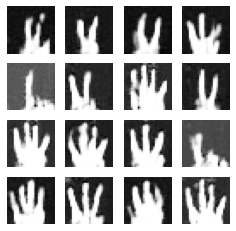

epoch 642/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2737 sec, gen_loss=-14.69221305847168, disc_loss=-0.713248610496521
epoch 643/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-14.85776138305664, disc_loss=-0.7135058641433716
epoch 644/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2724 sec, gen_loss=-14.314075469970703, disc_loss=-0.8692594766616821
epoch 645/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-13.783438682556152, disc_loss=-0.7761760950088501
epoch 646/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2724 sec, gen_loss=-14.251628875732422, disc_loss=-0.8637434244155884
epoch 647/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.65it/s]


Time=0.2778 sec, gen_loss=-14.70792007446289, disc_loss=-0.698706865310669
epoch 648/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.13it/s]


Time=0.2757 sec, gen_loss=-14.688578605651855, disc_loss=-0.6460319757461548
epoch 649/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.08it/s]


Time=0.2717 sec, gen_loss=-14.765105247497559, disc_loss=-0.6370490789413452
epoch 650/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.19it/s]


Time=0.2744 sec, gen_loss=-13.582826614379883, disc_loss=-0.5930703282356262
epoch 651/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-13.928399085998535, disc_loss=-0.5955368280410767


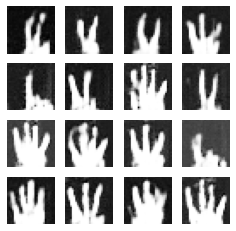

epoch 652/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2724 sec, gen_loss=-15.039203643798828, disc_loss=-0.6542806625366211
epoch 653/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2736 sec, gen_loss=-15.021392822265625, disc_loss=-0.7965058088302612
epoch 654/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.67it/s]


Time=0.2739 sec, gen_loss=-15.177858352661133, disc_loss=-0.8535065054893494
epoch 655/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2752 sec, gen_loss=-14.550265312194824, disc_loss=-0.7083006501197815
epoch 656/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2733 sec, gen_loss=-13.32297134399414, disc_loss=-0.703245997428894
epoch 657/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.09it/s]


Time=0.2792 sec, gen_loss=-13.195049285888672, disc_loss=-0.8410720825195312
epoch 658/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.66it/s]


Time=0.2735 sec, gen_loss=-13.95323657989502, disc_loss=-0.7822756767272949
epoch 659/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2744 sec, gen_loss=-14.364805221557617, disc_loss=-0.5971850156784058
epoch 660/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.66it/s]


Time=0.2733 sec, gen_loss=-14.842000007629395, disc_loss=-0.7871863842010498
epoch 661/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2713 sec, gen_loss=-14.382845878601074, disc_loss=-0.7146071195602417


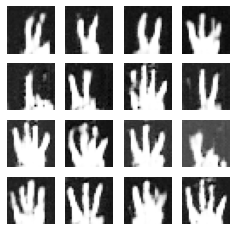

epoch 662/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.34it/s]


Time=0.2758 sec, gen_loss=-13.836030960083008, disc_loss=-0.7473496198654175
epoch 663/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2724 sec, gen_loss=-13.940607070922852, disc_loss=-0.7780354022979736
epoch 664/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2744 sec, gen_loss=-14.801121711730957, disc_loss=-0.7054637670516968
epoch 665/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-14.550678253173828, disc_loss=-0.6148874759674072
epoch 666/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.60it/s]


Time=0.2737 sec, gen_loss=-14.564043045043945, disc_loss=-0.7397230863571167
epoch 667/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.89it/s]


Time=0.2767 sec, gen_loss=-14.094732284545898, disc_loss=-0.6492965221405029
epoch 668/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2713 sec, gen_loss=-13.604776382446289, disc_loss=-0.7194017171859741
epoch 669/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2702 sec, gen_loss=-14.105470657348633, disc_loss=-0.8242837190628052
epoch 670/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.64it/s]


Time=0.2681 sec, gen_loss=-14.275630950927734, disc_loss=-0.7748641967773438
epoch 671/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2713 sec, gen_loss=-14.153962135314941, disc_loss=-0.7122489213943481


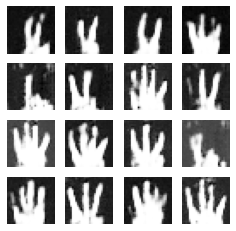

epoch 672/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.53it/s]


Time=0.2720 sec, gen_loss=-13.50639533996582, disc_loss=-0.7634870409965515
epoch 673/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.66it/s]


Time=0.2683 sec, gen_loss=-13.98318862915039, disc_loss=-0.6957169771194458
epoch 674/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2723 sec, gen_loss=-13.833364486694336, disc_loss=-0.8571466207504272
epoch 675/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.49it/s]


Time=0.2691 sec, gen_loss=-13.776150703430176, disc_loss=-0.7767555713653564
epoch 676/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.16it/s]


Time=0.2723 sec, gen_loss=-14.113635063171387, disc_loss=-0.6844388246536255
epoch 677/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.82it/s]


Time=0.2708 sec, gen_loss=-14.106456756591797, disc_loss=-0.8014885187149048
epoch 678/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.70it/s]


Time=0.2681 sec, gen_loss=-14.481414794921875, disc_loss=-0.6876903772354126
epoch 679/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.90it/s]


Time=0.2734 sec, gen_loss=-14.44250774383545, disc_loss=-0.7483772039413452
epoch 680/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.05it/s]


Time=0.2728 sec, gen_loss=-14.011585235595703, disc_loss=-0.6420416235923767
epoch 681/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.43it/s]


Time=0.2702 sec, gen_loss=-13.674335479736328, disc_loss=-0.62890625


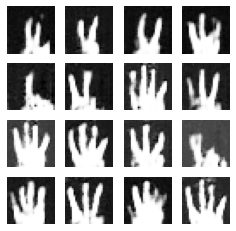

epoch 682/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.40it/s]


Time=0.2735 sec, gen_loss=-13.629613876342773, disc_loss=-0.8085227012634277
epoch 683/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.70it/s]


Time=0.2682 sec, gen_loss=-13.956195831298828, disc_loss=-0.7723166942596436
epoch 684/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.26it/s]


Time=0.2700 sec, gen_loss=-13.615501403808594, disc_loss=-0.7155243158340454
epoch 685/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.65it/s]


Time=0.2768 sec, gen_loss=-14.306087493896484, disc_loss=-0.6886281967163086
epoch 686/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-14.223759651184082, disc_loss=-0.6640523672103882
epoch 687/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2764 sec, gen_loss=-13.687820434570312, disc_loss=-0.6612255573272705
epoch 688/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2728 sec, gen_loss=-13.835517883300781, disc_loss=-0.7786200642585754
epoch 689/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2763 sec, gen_loss=-13.992044448852539, disc_loss=-0.6591162085533142
epoch 690/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.82it/s]


Time=0.2737 sec, gen_loss=-14.104743957519531, disc_loss=-1.002387523651123
epoch 691/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2763 sec, gen_loss=-14.243408203125, disc_loss=-0.7113598585128784


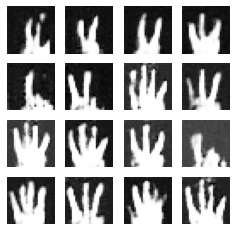

epoch 692/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.48it/s]


Time=0.2732 sec, gen_loss=-14.743343353271484, disc_loss=-0.5547551512718201
epoch 693/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.87it/s]


Time=0.2736 sec, gen_loss=-13.895040512084961, disc_loss=-0.872836709022522
epoch 694/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.36it/s]


Time=0.2752 sec, gen_loss=-13.31041145324707, disc_loss=-0.6696006059646606
epoch 695/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2758 sec, gen_loss=-12.91172981262207, disc_loss=-0.6276108622550964
epoch 696/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-13.86492919921875, disc_loss=-0.7361886501312256
epoch 697/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-14.195817947387695, disc_loss=-0.6074799299240112
epoch 698/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.37it/s]


Time=0.2737 sec, gen_loss=-13.727598190307617, disc_loss=-0.6563632488250732
epoch 699/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.11it/s]


Time=0.2758 sec, gen_loss=-13.545963287353516, disc_loss=-0.6625570058822632
epoch 700/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.13it/s]


Time=0.2757 sec, gen_loss=-13.555115699768066, disc_loss=-0.767249345779419
epoch 701/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2734 sec, gen_loss=-13.894179344177246, disc_loss=-0.6393104791641235


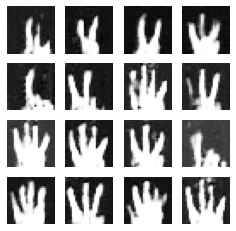

epoch 702/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.11it/s]


Time=0.2758 sec, gen_loss=-14.136007308959961, disc_loss=-0.7648211717605591
epoch 703/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2733 sec, gen_loss=-14.574705123901367, disc_loss=-0.6906377673149109
epoch 704/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2754 sec, gen_loss=-13.81983757019043, disc_loss=-0.7907149195671082
epoch 705/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-13.443456649780273, disc_loss=-0.6011403799057007
epoch 706/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.56it/s]


Time=0.2739 sec, gen_loss=-13.167325019836426, disc_loss=-0.6511766314506531
epoch 707/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.99it/s]


Time=0.2753 sec, gen_loss=-13.950942993164062, disc_loss=-0.8273165822029114
epoch 708/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.29it/s]


Time=0.2755 sec, gen_loss=-14.590662956237793, disc_loss=-0.6587523818016052
epoch 709/1500: 


100%|██████████| 16/16 [00:00<00:00, 52.07it/s]


Time=0.3212 sec, gen_loss=-13.359415054321289, disc_loss=-0.7687414288520813
epoch 710/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2723 sec, gen_loss=-13.318353652954102, disc_loss=-0.7751888036727905
epoch 711/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2734 sec, gen_loss=-14.63293743133545, disc_loss=-0.7566860914230347


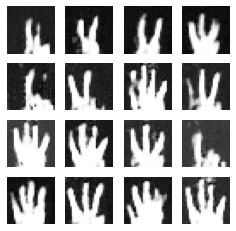

epoch 712/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.14it/s]


Time=0.2777 sec, gen_loss=-14.77478313446045, disc_loss=-0.6095670461654663
epoch 713/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-13.580940246582031, disc_loss=-0.6711838245391846
epoch 714/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2752 sec, gen_loss=-13.609923362731934, disc_loss=-0.6948992609977722
epoch 715/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2743 sec, gen_loss=-14.341456413269043, disc_loss=-0.7686518430709839
epoch 716/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-14.195518493652344, disc_loss=-0.715186357498169
epoch 717/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2773 sec, gen_loss=-13.523408889770508, disc_loss=-0.865830659866333
epoch 718/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.74it/s]


Time=0.2721 sec, gen_loss=-12.870318412780762, disc_loss=-0.702464759349823
epoch 719/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2763 sec, gen_loss=-13.471586227416992, disc_loss=-0.8690463900566101
epoch 720/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2748 sec, gen_loss=-14.785865783691406, disc_loss=-0.8108880519866943
epoch 721/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2724 sec, gen_loss=-14.973379135131836, disc_loss=-0.6872838735580444


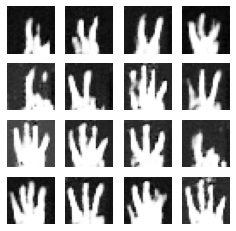

epoch 722/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.36it/s]


Time=0.2737 sec, gen_loss=-15.110374450683594, disc_loss=-0.9034546613693237
epoch 723/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2713 sec, gen_loss=-14.137482643127441, disc_loss=-0.6167148351669312
epoch 724/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2753 sec, gen_loss=-12.836854934692383, disc_loss=-0.6000871062278748
epoch 725/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.09it/s]


Time=0.2706 sec, gen_loss=-13.162593841552734, disc_loss=-0.700482964515686
epoch 726/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2742 sec, gen_loss=-14.388961791992188, disc_loss=-0.7209120988845825
epoch 727/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.81it/s]


Time=0.2771 sec, gen_loss=-14.365535736083984, disc_loss=-0.7547570466995239
epoch 728/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.60it/s]


Time=0.2781 sec, gen_loss=-12.623058319091797, disc_loss=-0.8122797608375549
epoch 729/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.29it/s]


Time=0.2722 sec, gen_loss=-13.318941116333008, disc_loss=-0.8327765464782715
epoch 730/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2734 sec, gen_loss=-14.037179946899414, disc_loss=-0.7575666308403015
epoch 731/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2721 sec, gen_loss=-14.369277954101562, disc_loss=-0.7560434937477112


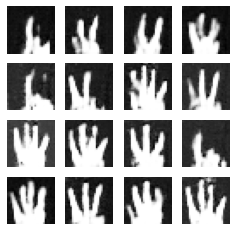

epoch 732/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2737 sec, gen_loss=-14.690649032592773, disc_loss=-0.7645159959793091
epoch 733/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2724 sec, gen_loss=-14.462350845336914, disc_loss=-0.7077073454856873
epoch 734/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2719 sec, gen_loss=-13.192720413208008, disc_loss=-0.7640545964241028
epoch 735/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.05it/s]


Time=0.2728 sec, gen_loss=-13.534531593322754, disc_loss=-0.6702021956443787
epoch 736/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-13.185708045959473, disc_loss=-0.7560982704162598
epoch 737/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-13.482583999633789, disc_loss=-0.6438232660293579
epoch 738/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.51it/s]


Time=0.2731 sec, gen_loss=-13.943158149719238, disc_loss=-0.7956159114837646
epoch 739/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.02it/s]


Time=0.2740 sec, gen_loss=-14.340734481811523, disc_loss=-0.680169939994812
epoch 740/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.91it/s]


Time=0.2729 sec, gen_loss=-13.794267654418945, disc_loss=-0.72730553150177
epoch 741/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2740 sec, gen_loss=-13.594165802001953, disc_loss=-0.6504957675933838


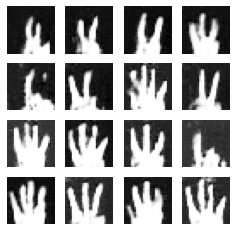

epoch 742/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2735 sec, gen_loss=-13.43875503540039, disc_loss=-0.8568452596664429
epoch 743/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.20it/s]


Time=0.2755 sec, gen_loss=-14.023846626281738, disc_loss=-0.7644473314285278
epoch 744/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.91it/s]


Time=0.2724 sec, gen_loss=-13.931753158569336, disc_loss=-0.7870854139328003
epoch 745/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2753 sec, gen_loss=-13.740184783935547, disc_loss=-0.8072412014007568
epoch 746/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2744 sec, gen_loss=-14.002178192138672, disc_loss=-0.7758156061172485
epoch 747/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2768 sec, gen_loss=-13.617795944213867, disc_loss=-0.7609930038452148
epoch 748/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.61it/s]


Time=0.2732 sec, gen_loss=-13.318191528320312, disc_loss=-0.6424944400787354
epoch 749/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.79it/s]


Time=0.2738 sec, gen_loss=-13.683137893676758, disc_loss=-0.6963231563568115
epoch 750/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2743 sec, gen_loss=-14.796965599060059, disc_loss=-0.5823312401771545
epoch 751/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2753 sec, gen_loss=-14.53948974609375, disc_loss=-0.8244085311889648


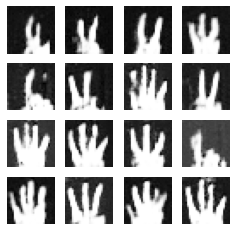

epoch 752/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.08it/s]


Time=0.2759 sec, gen_loss=-13.938884735107422, disc_loss=-0.6250711679458618
epoch 753/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2720 sec, gen_loss=-12.857377052307129, disc_loss=-0.7478529810905457
epoch 754/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2723 sec, gen_loss=-13.438285827636719, disc_loss=-0.637168288230896
epoch 755/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2783 sec, gen_loss=-14.209358215332031, disc_loss=-0.7152208089828491
epoch 756/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2745 sec, gen_loss=-14.013593673706055, disc_loss=-0.742016077041626
epoch 757/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2744 sec, gen_loss=-13.487625122070312, disc_loss=-0.6449075937271118
epoch 758/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2762 sec, gen_loss=-13.831356048583984, disc_loss=-0.6390396356582642
epoch 759/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.89it/s]


Time=0.2731 sec, gen_loss=-13.53417682647705, disc_loss=-0.7866308689117432
epoch 760/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.32it/s]


Time=0.2751 sec, gen_loss=-13.876490592956543, disc_loss=-0.6344330310821533
epoch 761/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2744 sec, gen_loss=-13.82628345489502, disc_loss=-0.6193605065345764


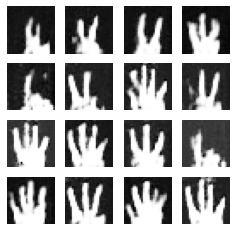

epoch 762/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.09it/s]


Time=0.2758 sec, gen_loss=-14.123476028442383, disc_loss=-0.7180929183959961
epoch 763/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.67it/s]


Time=0.2734 sec, gen_loss=-13.463518142700195, disc_loss=-0.7659769654273987
epoch 764/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.10it/s]


Time=0.2748 sec, gen_loss=-13.141780853271484, disc_loss=-0.6960341930389404
epoch 765/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-12.884866714477539, disc_loss=-0.7638364434242249
epoch 766/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.54it/s]


Time=0.2749 sec, gen_loss=-13.467967987060547, disc_loss=-0.7115839719772339
epoch 767/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.66it/s]


Time=0.2821 sec, gen_loss=-14.627298355102539, disc_loss=-0.6434693336486816
epoch 768/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2750 sec, gen_loss=-13.926799774169922, disc_loss=-0.6007084250450134
epoch 769/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.19it/s]


Time=0.2713 sec, gen_loss=-13.732122421264648, disc_loss=-0.7076084613800049
epoch 770/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.53it/s]


Time=0.2689 sec, gen_loss=-14.311830520629883, disc_loss=-0.6140127778053284
epoch 771/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2713 sec, gen_loss=-14.192329406738281, disc_loss=-0.7378501296043396


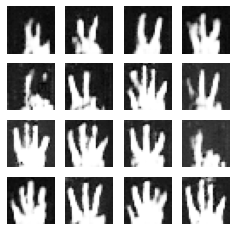

epoch 772/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.60it/s]


Time=0.2706 sec, gen_loss=-13.89663314819336, disc_loss=-0.6682080030441284
epoch 773/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.66it/s]


Time=0.2693 sec, gen_loss=-13.762802124023438, disc_loss=-0.6633526682853699
epoch 774/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.46it/s]


Time=0.2681 sec, gen_loss=-14.454534530639648, disc_loss=-0.7558505535125732
epoch 775/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.83it/s]


Time=0.2738 sec, gen_loss=-13.981209754943848, disc_loss=-0.7647298574447632
epoch 776/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2713 sec, gen_loss=-13.312186241149902, disc_loss=-0.7363036274909973
epoch 777/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.19it/s]


Time=0.2702 sec, gen_loss=-13.579572677612305, disc_loss=-0.6519742012023926
epoch 778/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2714 sec, gen_loss=-13.975478172302246, disc_loss=-0.686630129814148
epoch 779/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.65it/s]


Time=0.2684 sec, gen_loss=-14.157299041748047, disc_loss=-0.731840968132019
epoch 780/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.50it/s]


Time=0.2690 sec, gen_loss=-14.563497543334961, disc_loss=-0.6931422352790833
epoch 781/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.19it/s]


Time=0.2702 sec, gen_loss=-13.918763160705566, disc_loss=-0.7120422124862671


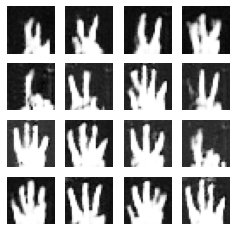

epoch 782/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.06it/s]


Time=0.2718 sec, gen_loss=-13.02968978881836, disc_loss=-0.6662128567695618
epoch 783/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.41it/s]


Time=0.2709 sec, gen_loss=-13.359859466552734, disc_loss=-0.6859275102615356
epoch 784/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2713 sec, gen_loss=-14.189708709716797, disc_loss=-0.6843208074569702
epoch 785/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.55it/s]


Time=0.2773 sec, gen_loss=-14.61327838897705, disc_loss=-0.5755947828292847
epoch 786/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.27it/s]


Time=0.2761 sec, gen_loss=-13.64358901977539, disc_loss=-0.7036068439483643
epoch 787/1500: 


100%|██████████| 16/16 [00:00<00:00, 58.93it/s]


Time=0.2874 sec, gen_loss=-12.648458480834961, disc_loss=-0.6276974081993103
epoch 788/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.50it/s]


Time=0.2742 sec, gen_loss=-13.030930519104004, disc_loss=-0.6213125586509705
epoch 789/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.26it/s]


Time=0.2742 sec, gen_loss=-14.212528228759766, disc_loss=-0.792747974395752
epoch 790/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-14.190696716308594, disc_loss=-0.670717179775238
epoch 791/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-13.045282363891602, disc_loss=-0.664536714553833


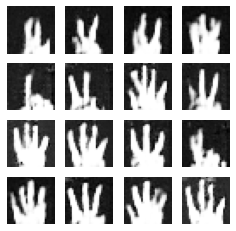

epoch 792/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.83it/s]


Time=0.2727 sec, gen_loss=-12.560083389282227, disc_loss=-0.6819457411766052
epoch 793/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2751 sec, gen_loss=-12.491622924804688, disc_loss=-0.6705430150032043
epoch 794/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.05it/s]


Time=0.2760 sec, gen_loss=-13.470428466796875, disc_loss=-0.7048381567001343
epoch 795/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2747 sec, gen_loss=-13.347891807556152, disc_loss=-0.5820584893226624
epoch 796/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.21it/s]


Time=0.2748 sec, gen_loss=-12.51486873626709, disc_loss=-0.7926990389823914
epoch 797/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.78it/s]


Time=0.2772 sec, gen_loss=-12.965411186218262, disc_loss=-0.7274889349937439
epoch 798/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.96it/s]


Time=0.2722 sec, gen_loss=-13.59459114074707, disc_loss=-0.7767510414123535
epoch 799/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2732 sec, gen_loss=-13.982257843017578, disc_loss=-0.7129960060119629
epoch 800/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2751 sec, gen_loss=-13.66283130645752, disc_loss=-0.7895848751068115
epoch 801/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.84it/s]


Time=0.2779 sec, gen_loss=-13.0414457321167, disc_loss=-0.8045682907104492


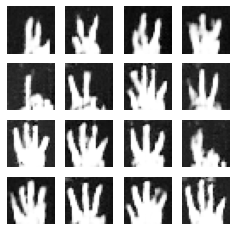

epoch 802/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.21it/s]


Time=0.2753 sec, gen_loss=-12.307031631469727, disc_loss=-0.6883142590522766
epoch 803/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.29it/s]


Time=0.2750 sec, gen_loss=-12.46742057800293, disc_loss=-0.6322919130325317
epoch 804/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2733 sec, gen_loss=-13.196557998657227, disc_loss=-0.767715573310852
epoch 805/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-13.681878089904785, disc_loss=-0.7222762703895569
epoch 806/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2763 sec, gen_loss=-13.135161399841309, disc_loss=-0.8843632936477661
epoch 807/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-12.950397491455078, disc_loss=-0.6889248490333557
epoch 808/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.48it/s]


Time=0.2751 sec, gen_loss=-13.135956764221191, disc_loss=-0.7474665641784668
epoch 809/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.98it/s]


Time=0.2763 sec, gen_loss=-13.343009948730469, disc_loss=-0.6939663887023926
epoch 810/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2729 sec, gen_loss=-13.282718658447266, disc_loss=-0.8777211308479309
epoch 811/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.39it/s]


Time=0.2746 sec, gen_loss=-13.648377418518066, disc_loss=-0.6433770656585693


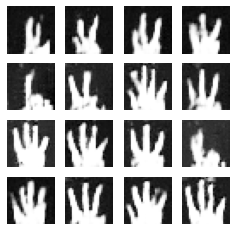

epoch 812/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.79it/s]


Time=0.2729 sec, gen_loss=-13.47005844116211, disc_loss=-0.7518179416656494
epoch 813/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.87it/s]


Time=0.2717 sec, gen_loss=-13.154151916503906, disc_loss=-0.6840760707855225
epoch 814/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.55it/s]


Time=0.2782 sec, gen_loss=-13.160028457641602, disc_loss=-0.6685298681259155
epoch 815/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.34it/s]


Time=0.2748 sec, gen_loss=-13.78705883026123, disc_loss=-0.6488738656044006
epoch 816/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2738 sec, gen_loss=-14.00244140625, disc_loss=-0.7727198600769043
epoch 817/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.99it/s]


Time=0.2763 sec, gen_loss=-13.466815948486328, disc_loss=-0.8038557171821594
epoch 818/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2746 sec, gen_loss=-13.641166687011719, disc_loss=-0.6893901824951172
epoch 819/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2744 sec, gen_loss=-12.997509002685547, disc_loss=-0.8075348138809204
epoch 820/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.54it/s]


Time=0.2729 sec, gen_loss=-12.497133255004883, disc_loss=-0.6676983833312988
epoch 821/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2744 sec, gen_loss=-12.629995346069336, disc_loss=-0.8010764718055725


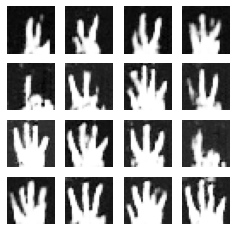

epoch 822/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.04it/s]


Time=0.2766 sec, gen_loss=-13.509746551513672, disc_loss=-0.8137942552566528
epoch 823/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2732 sec, gen_loss=-13.939949989318848, disc_loss=-0.7180730104446411
epoch 824/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.06it/s]


Time=0.2708 sec, gen_loss=-13.838143348693848, disc_loss=-0.9277437329292297
epoch 825/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.09it/s]


Time=0.2759 sec, gen_loss=-14.707870483398438, disc_loss=-0.5241448879241943
epoch 826/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2782 sec, gen_loss=-13.838768005371094, disc_loss=-0.6958882808685303
epoch 827/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.31it/s]


Time=0.2793 sec, gen_loss=-13.194257736206055, disc_loss=-0.7182517051696777
epoch 828/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-13.14717960357666, disc_loss=-0.8125966787338257
epoch 829/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.21it/s]


Time=0.2753 sec, gen_loss=-13.112478256225586, disc_loss=-0.8530020117759705
epoch 830/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.20it/s]


Time=0.2744 sec, gen_loss=-13.52560806274414, disc_loss=-0.7302796840667725
epoch 831/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.41it/s]


Time=0.2735 sec, gen_loss=-13.54445743560791, disc_loss=-0.5839943885803223


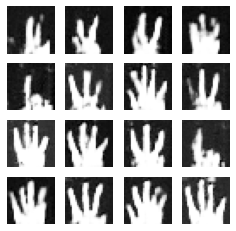

epoch 832/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.81it/s]


Time=0.2758 sec, gen_loss=-13.647188186645508, disc_loss=-0.6026688814163208
epoch 833/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.13it/s]


Time=0.2747 sec, gen_loss=-13.251533508300781, disc_loss=-0.5077660083770752
epoch 834/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-12.890111923217773, disc_loss=-0.7390134334564209
epoch 835/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2738 sec, gen_loss=-12.986988067626953, disc_loss=-0.8690162897109985
epoch 836/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.65it/s]


Time=0.2745 sec, gen_loss=-13.541251182556152, disc_loss=-0.8346906304359436
epoch 837/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2736 sec, gen_loss=-13.220205307006836, disc_loss=-0.5670068860054016
epoch 838/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2703 sec, gen_loss=-12.484967231750488, disc_loss=-0.6368702054023743
epoch 839/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2703 sec, gen_loss=-12.653993606567383, disc_loss=-0.7577077746391296
epoch 840/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.21it/s]


Time=0.2764 sec, gen_loss=-12.792059898376465, disc_loss=-0.7483423352241516
epoch 841/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2733 sec, gen_loss=-13.226299285888672, disc_loss=-0.790656328201294


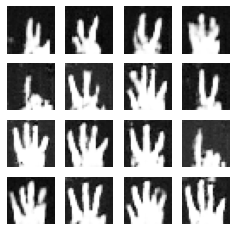

epoch 842/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-13.035228729248047, disc_loss=-0.6000910401344299
epoch 843/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2744 sec, gen_loss=-12.980040550231934, disc_loss=-0.5687552690505981
epoch 844/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2732 sec, gen_loss=-12.472556114196777, disc_loss=-0.7091165781021118
epoch 845/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2713 sec, gen_loss=-12.735967636108398, disc_loss=-0.5532945394515991
epoch 846/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-13.045788764953613, disc_loss=-0.6749625205993652
epoch 847/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2748 sec, gen_loss=-12.510076522827148, disc_loss=-0.6715435981750488
epoch 848/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2753 sec, gen_loss=-12.267085075378418, disc_loss=-0.7196880578994751
epoch 849/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.65it/s]


Time=0.2777 sec, gen_loss=-12.114263534545898, disc_loss=-0.7887129783630371
epoch 850/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.94it/s]


Time=0.2779 sec, gen_loss=-13.08913803100586, disc_loss=-0.815392255783081
epoch 851/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.25it/s]


Time=0.2761 sec, gen_loss=-13.911053657531738, disc_loss=-0.627931535243988


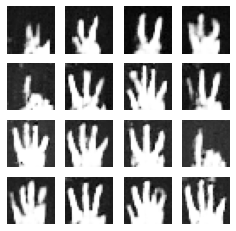

epoch 852/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.38it/s]


Time=0.2789 sec, gen_loss=-13.58572769165039, disc_loss=-0.7269592881202698
epoch 853/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.89it/s]


Time=0.2767 sec, gen_loss=-12.294126510620117, disc_loss=-0.7612679600715637
epoch 854/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.09it/s]


Time=0.2778 sec, gen_loss=-12.076549530029297, disc_loss=-0.6924187541007996
epoch 855/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.53it/s]


Time=0.2803 sec, gen_loss=-12.89924144744873, disc_loss=-0.6442016363143921
epoch 856/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2748 sec, gen_loss=-13.324581146240234, disc_loss=-0.7028181552886963
epoch 857/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.08it/s]


Time=0.2813 sec, gen_loss=-12.766031265258789, disc_loss=-0.8213579654693604
epoch 858/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.28it/s]


Time=0.2750 sec, gen_loss=-12.243827819824219, disc_loss=-0.7376176118850708
epoch 859/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.86it/s]


Time=0.2759 sec, gen_loss=-12.764132499694824, disc_loss=-0.5604435205459595
epoch 860/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.32it/s]


Time=0.2749 sec, gen_loss=-13.268841743469238, disc_loss=-0.8677729368209839
epoch 861/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.01it/s]


Time=0.2763 sec, gen_loss=-14.242244720458984, disc_loss=-0.7509274482727051


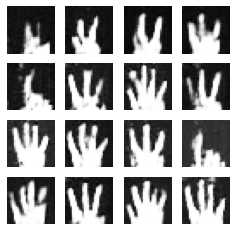

epoch 862/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.02it/s]


Time=0.2719 sec, gen_loss=-13.438919067382812, disc_loss=-0.9372183680534363
epoch 863/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2743 sec, gen_loss=-12.496318817138672, disc_loss=-0.7650278210639954
epoch 864/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2712 sec, gen_loss=-11.683433532714844, disc_loss=-0.8256929516792297
epoch 865/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2743 sec, gen_loss=-12.2545166015625, disc_loss=-0.7283587455749512
epoch 866/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.79it/s]


Time=0.2761 sec, gen_loss=-13.973104476928711, disc_loss=-0.7683008313179016
epoch 867/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2753 sec, gen_loss=-14.178389549255371, disc_loss=-0.7320010662078857
epoch 868/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.08it/s]


Time=0.2759 sec, gen_loss=-12.390186309814453, disc_loss=-0.6746666431427002
epoch 869/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2744 sec, gen_loss=-11.18781852722168, disc_loss=-0.762271523475647
epoch 870/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.30it/s]


Time=0.2795 sec, gen_loss=-12.173651695251465, disc_loss=-0.7825748920440674
epoch 871/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.97it/s]


Time=0.2771 sec, gen_loss=-13.017179489135742, disc_loss=-0.5660790205001831


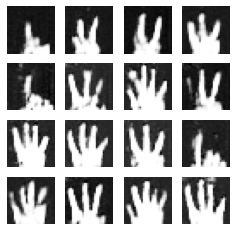

epoch 872/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2753 sec, gen_loss=-13.834373474121094, disc_loss=-0.6153342723846436
epoch 873/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2723 sec, gen_loss=-13.653167724609375, disc_loss=-0.5231271982192993
epoch 874/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-12.457179069519043, disc_loss=-0.5879225134849548
epoch 875/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2733 sec, gen_loss=-11.612728118896484, disc_loss=-0.7502568960189819
epoch 876/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.01it/s]


Time=0.2719 sec, gen_loss=-12.377609252929688, disc_loss=-0.6520521640777588
epoch 877/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.63it/s]


Time=0.2726 sec, gen_loss=-12.79123306274414, disc_loss=-0.7729140520095825
epoch 878/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.55it/s]


Time=0.2688 sec, gen_loss=-13.330085754394531, disc_loss=-0.810036301612854
epoch 879/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.00it/s]


Time=0.2673 sec, gen_loss=-13.646797180175781, disc_loss=-0.6622598767280579
epoch 880/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.86it/s]


Time=0.2692 sec, gen_loss=-12.475051879882812, disc_loss=-0.6325918436050415
epoch 881/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.63it/s]


Time=0.2706 sec, gen_loss=-11.671388626098633, disc_loss=-0.7436598539352417


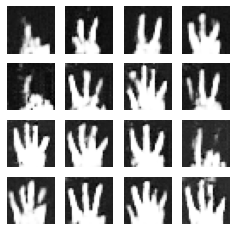

epoch 882/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.76it/s]


Time=0.2730 sec, gen_loss=-12.260599136352539, disc_loss=-0.7764434814453125
epoch 883/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.04it/s]


Time=0.2738 sec, gen_loss=-13.081253051757812, disc_loss=-0.7447643876075745
epoch 884/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.17it/s]


Time=0.2703 sec, gen_loss=-13.047601699829102, disc_loss=-0.573314905166626
epoch 885/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2719 sec, gen_loss=-11.462657928466797, disc_loss=-0.6743794679641724
epoch 886/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.06it/s]


Time=0.2720 sec, gen_loss=-11.470579147338867, disc_loss=-0.7416874170303345
epoch 887/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.60it/s]


Time=0.2695 sec, gen_loss=-12.31849479675293, disc_loss=-0.7377867698669434
epoch 888/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2712 sec, gen_loss=-13.961931228637695, disc_loss=-0.6186080574989319
epoch 889/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.91it/s]


Time=0.2702 sec, gen_loss=-14.293291091918945, disc_loss=-0.7067487239837646
epoch 890/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.04it/s]


Time=0.2719 sec, gen_loss=-12.691534996032715, disc_loss=-0.7370983362197876
epoch 891/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.21it/s]


Time=0.2764 sec, gen_loss=-12.07839298248291, disc_loss=-0.7712657451629639


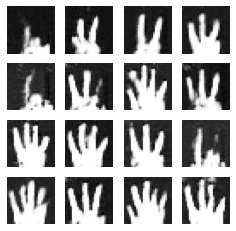

epoch 892/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.31it/s]


Time=0.2749 sec, gen_loss=-12.840414047241211, disc_loss=-0.6589658260345459
epoch 893/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.17it/s]


Time=0.2713 sec, gen_loss=-13.253217697143555, disc_loss=-0.7420158386230469
epoch 894/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.98it/s]


Time=0.2773 sec, gen_loss=-12.975351333618164, disc_loss=-0.8332773447036743
epoch 895/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.01it/s]


Time=0.2753 sec, gen_loss=-12.052618026733398, disc_loss=-0.7039485573768616
epoch 896/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.21it/s]


Time=0.2744 sec, gen_loss=-11.878687858581543, disc_loss=-0.7300665378570557
epoch 897/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2773 sec, gen_loss=-12.985943794250488, disc_loss=-0.6214359998703003
epoch 898/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2773 sec, gen_loss=-13.820718765258789, disc_loss=-0.6647365093231201
epoch 899/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.73it/s]


Time=0.2776 sec, gen_loss=-13.447809219360352, disc_loss=-0.5149877071380615
epoch 900/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2753 sec, gen_loss=-12.783565521240234, disc_loss=-0.7394987344741821
epoch 901/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2783 sec, gen_loss=-12.498954772949219, disc_loss=-0.7467580437660217


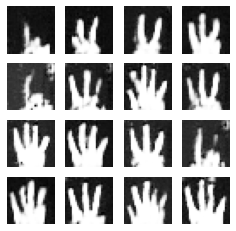

epoch 902/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2763 sec, gen_loss=-12.61106014251709, disc_loss=-0.6484201550483704
epoch 903/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.36it/s]


Time=0.2747 sec, gen_loss=-12.840543746948242, disc_loss=-0.6063433289527893
epoch 904/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.34it/s]


Time=0.2758 sec, gen_loss=-12.796422958374023, disc_loss=-0.5841766595840454
epoch 905/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2773 sec, gen_loss=-12.60374927520752, disc_loss=-0.7688559889793396
epoch 906/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2772 sec, gen_loss=-13.221025466918945, disc_loss=-0.8427581787109375
epoch 907/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2773 sec, gen_loss=-12.69137191772461, disc_loss=-0.8314080238342285
epoch 908/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2757 sec, gen_loss=-12.412904739379883, disc_loss=-0.6610565781593323
epoch 909/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.07it/s]


Time=0.2768 sec, gen_loss=-12.671281814575195, disc_loss=-0.7683361172676086
epoch 910/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.25it/s]


Time=0.2752 sec, gen_loss=-12.262142181396484, disc_loss=-0.6230263710021973
epoch 911/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.87it/s]


Time=0.2768 sec, gen_loss=-12.792218208312988, disc_loss=-0.6368009448051453


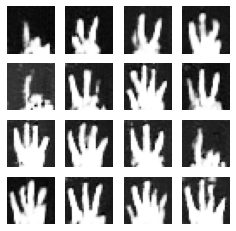

epoch 912/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.31it/s]


Time=0.2791 sec, gen_loss=-13.198131561279297, disc_loss=-0.6728988885879517
epoch 913/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.98it/s]


Time=0.2773 sec, gen_loss=-12.535981178283691, disc_loss=-0.7809439301490784
epoch 914/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.99it/s]


Time=0.2773 sec, gen_loss=-12.296890258789062, disc_loss=-0.7931022644042969
epoch 915/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.17it/s]


Time=0.2788 sec, gen_loss=-12.457771301269531, disc_loss=-0.736592173576355
epoch 916/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.87it/s]


Time=0.2768 sec, gen_loss=-12.945611953735352, disc_loss=-0.5354676246643066
epoch 917/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2773 sec, gen_loss=-13.14328384399414, disc_loss=-0.5727201700210571
epoch 918/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.01it/s]


Time=0.2763 sec, gen_loss=-12.870530128479004, disc_loss=-0.7090871334075928
epoch 919/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.98it/s]


Time=0.2764 sec, gen_loss=-12.687255859375, disc_loss=-0.7319533824920654
epoch 920/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.29it/s]


Time=0.2760 sec, gen_loss=-12.511421203613281, disc_loss=-0.6375709772109985
epoch 921/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2753 sec, gen_loss=-12.208294868469238, disc_loss=-0.6907477974891663


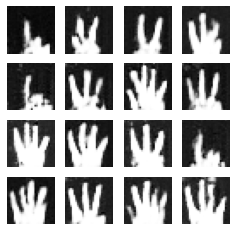

epoch 922/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.41it/s]


Time=0.2799 sec, gen_loss=-12.387531280517578, disc_loss=-0.7430572509765625
epoch 923/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.09it/s]


Time=0.2749 sec, gen_loss=-12.792924880981445, disc_loss=-0.7339068651199341
epoch 924/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2753 sec, gen_loss=-12.992454528808594, disc_loss=-0.8551893830299377
epoch 925/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.78it/s]


Time=0.2773 sec, gen_loss=-12.718441009521484, disc_loss=-0.607522189617157
epoch 926/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2752 sec, gen_loss=-12.556333541870117, disc_loss=-0.5872725248336792
epoch 927/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.52it/s]


Time=0.2773 sec, gen_loss=-12.207818984985352, disc_loss=-0.8504153490066528
epoch 928/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.31it/s]


Time=0.2739 sec, gen_loss=-12.349970817565918, disc_loss=-0.6108235716819763
epoch 929/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.81it/s]


Time=0.2765 sec, gen_loss=-12.338569641113281, disc_loss=-0.7605289816856384
epoch 930/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-12.958768844604492, disc_loss=-0.5396377444267273
epoch 931/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-12.81025505065918, disc_loss=-0.5132719278335571


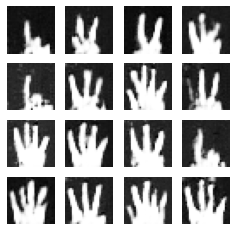

epoch 932/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.21it/s]


Time=0.2756 sec, gen_loss=-12.149271011352539, disc_loss=-0.6679939031600952
epoch 933/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.28it/s]


Time=0.2703 sec, gen_loss=-12.233860969543457, disc_loss=-0.695870041847229
epoch 934/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2743 sec, gen_loss=-12.797017097473145, disc_loss=-0.7071677446365356
epoch 935/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.72it/s]


Time=0.2723 sec, gen_loss=-12.590055465698242, disc_loss=-0.693770706653595
epoch 936/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2738 sec, gen_loss=-12.645899772644043, disc_loss=-0.5995588302612305
epoch 937/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.10it/s]


Time=0.2738 sec, gen_loss=-12.800531387329102, disc_loss=-0.6123150587081909
epoch 938/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-11.657989501953125, disc_loss=-0.8086847066879272
epoch 939/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.01it/s]


Time=0.2720 sec, gen_loss=-11.720749855041504, disc_loss=-0.5516066551208496
epoch 940/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-13.737947463989258, disc_loss=-0.665095329284668
epoch 941/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2723 sec, gen_loss=-13.153661727905273, disc_loss=-0.7235358357429504


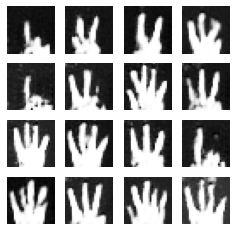

epoch 942/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.57it/s]


Time=0.2741 sec, gen_loss=-11.718777656555176, disc_loss=-0.8012076020240784
epoch 943/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.05it/s]


Time=0.2729 sec, gen_loss=-11.904924392700195, disc_loss=-0.717203676700592
epoch 944/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.89it/s]


Time=0.2725 sec, gen_loss=-12.871543884277344, disc_loss=-0.7939631938934326
epoch 945/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.14it/s]


Time=0.2714 sec, gen_loss=-13.526304244995117, disc_loss=-0.6314013600349426
epoch 946/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.15it/s]


Time=0.2724 sec, gen_loss=-13.169286727905273, disc_loss=-0.7393327951431274
epoch 947/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2752 sec, gen_loss=-12.059412956237793, disc_loss=-0.673595666885376
epoch 948/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2733 sec, gen_loss=-11.598755836486816, disc_loss=-0.7298339605331421
epoch 949/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2723 sec, gen_loss=-13.111385345458984, disc_loss=-0.7343584299087524
epoch 950/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2723 sec, gen_loss=-14.065074920654297, disc_loss=-0.660403311252594
epoch 951/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-13.390872955322266, disc_loss=-0.6711148023605347


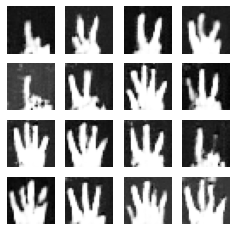

epoch 952/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2713 sec, gen_loss=-12.529248237609863, disc_loss=-0.7893025279045105
epoch 953/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2732 sec, gen_loss=-11.256464004516602, disc_loss=-0.7147333025932312
epoch 954/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.41it/s]


Time=0.2704 sec, gen_loss=-11.918912887573242, disc_loss=-0.8928099274635315
epoch 955/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.78it/s]


Time=0.2730 sec, gen_loss=-12.789525032043457, disc_loss=-0.7605306506156921
epoch 956/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.59it/s]


Time=0.2780 sec, gen_loss=-13.784578323364258, disc_loss=-0.8804564476013184
epoch 957/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.56it/s]


Time=0.2750 sec, gen_loss=-13.412397384643555, disc_loss=-0.6770492792129517
epoch 958/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.15it/s]


Time=0.2724 sec, gen_loss=-11.396661758422852, disc_loss=-0.544623851776123
epoch 959/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.16it/s]


Time=0.2717 sec, gen_loss=-11.02737808227539, disc_loss=-0.5878094434738159
epoch 960/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2723 sec, gen_loss=-12.246639251708984, disc_loss=-0.513265073299408
epoch 961/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2731 sec, gen_loss=-13.963886260986328, disc_loss=-0.7623834609985352


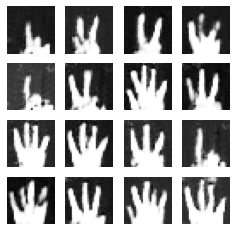

epoch 962/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2724 sec, gen_loss=-13.725314140319824, disc_loss=-0.6241145133972168
epoch 963/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.54it/s]


Time=0.2719 sec, gen_loss=-12.006484985351562, disc_loss=-0.5998935699462891
epoch 964/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.52it/s]


Time=0.2750 sec, gen_loss=-11.571880340576172, disc_loss=-0.5285502076148987
epoch 965/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2719 sec, gen_loss=-12.506464958190918, disc_loss=-0.718559741973877
epoch 966/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.17it/s]


Time=0.2713 sec, gen_loss=-13.519376754760742, disc_loss=-0.760239839553833
epoch 967/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.66it/s]


Time=0.2767 sec, gen_loss=-12.611003875732422, disc_loss=-0.6809306740760803
epoch 968/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2728 sec, gen_loss=-10.948261260986328, disc_loss=-0.5581127405166626
epoch 969/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2739 sec, gen_loss=-11.515985488891602, disc_loss=-0.577226996421814
epoch 970/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.91it/s]


Time=0.2724 sec, gen_loss=-13.623120307922363, disc_loss=-0.6859185695648193
epoch 971/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2743 sec, gen_loss=-13.388765335083008, disc_loss=-0.7167735695838928


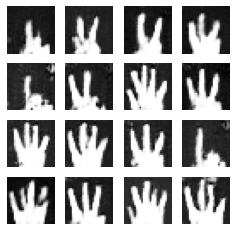

epoch 972/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.79it/s]


Time=0.2739 sec, gen_loss=-12.247426986694336, disc_loss=-0.7035133838653564
epoch 973/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.66it/s]


Time=0.2693 sec, gen_loss=-11.784339904785156, disc_loss=-0.602747917175293
epoch 974/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.52it/s]


Time=0.2699 sec, gen_loss=-11.726068496704102, disc_loss=-0.6598186492919922
epoch 975/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.17it/s]


Time=0.2703 sec, gen_loss=-11.949975967407227, disc_loss=-0.6321121454238892
epoch 976/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2743 sec, gen_loss=-12.794230461120605, disc_loss=-0.9317539930343628
epoch 977/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.11it/s]


Time=0.2672 sec, gen_loss=-13.386768341064453, disc_loss=-0.6582731008529663
epoch 978/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.39it/s]


Time=0.2664 sec, gen_loss=-12.098954200744629, disc_loss=-0.679961085319519
epoch 979/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.67it/s]


Time=0.2706 sec, gen_loss=-11.56002426147461, disc_loss=-0.7388498187065125
epoch 980/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.98it/s]


Time=0.2683 sec, gen_loss=-12.197195053100586, disc_loss=-0.7434996366500854
epoch 981/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2745 sec, gen_loss=-13.010446548461914, disc_loss=-0.703942596912384


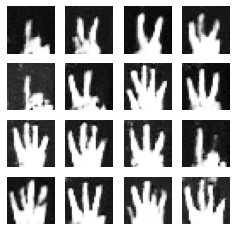

epoch 982/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.49it/s]


Time=0.2710 sec, gen_loss=-13.432394027709961, disc_loss=-0.6443200707435608
epoch 983/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.92it/s]


Time=0.2683 sec, gen_loss=-12.491682052612305, disc_loss=-0.6479406356811523
epoch 984/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.15it/s]


Time=0.2663 sec, gen_loss=-11.529511451721191, disc_loss=-0.7602245211601257
epoch 985/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.53it/s]


Time=0.2688 sec, gen_loss=-11.905433654785156, disc_loss=-0.5348942279815674
epoch 986/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2722 sec, gen_loss=-13.303444862365723, disc_loss=-0.6753790378570557
epoch 987/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2738 sec, gen_loss=-13.319849014282227, disc_loss=-0.6757272481918335
epoch 988/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.06it/s]


Time=0.2686 sec, gen_loss=-12.77011489868164, disc_loss=-0.5044519901275635
epoch 989/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.90it/s]


Time=0.2674 sec, gen_loss=-12.033259391784668, disc_loss=-0.7586907148361206
epoch 990/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.66it/s]


Time=0.2713 sec, gen_loss=-11.89571762084961, disc_loss=-0.6717453598976135
epoch 991/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.56it/s]


Time=0.2738 sec, gen_loss=-12.166756629943848, disc_loss=-0.6148862242698669


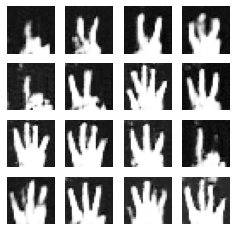

epoch 992/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2744 sec, gen_loss=-12.062393188476562, disc_loss=-0.6793811917304993
epoch 993/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.36it/s]


Time=0.2737 sec, gen_loss=-11.962071418762207, disc_loss=-0.6280518770217896
epoch 994/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2739 sec, gen_loss=-11.78272819519043, disc_loss=-0.842839241027832
epoch 995/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2724 sec, gen_loss=-12.45329475402832, disc_loss=-0.6932112574577332
epoch 996/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-12.641263961791992, disc_loss=-0.7262065410614014
epoch 997/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.82it/s]


Time=0.2760 sec, gen_loss=-12.430170059204102, disc_loss=-0.7301449775695801
epoch 998/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.79it/s]


Time=0.2742 sec, gen_loss=-12.076741218566895, disc_loss=-0.694952130317688
epoch 999/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.57it/s]


Time=0.2738 sec, gen_loss=-11.944390296936035, disc_loss=-0.6677871346473694
epoch 1000/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.17it/s]


Time=0.2713 sec, gen_loss=-12.891094207763672, disc_loss=-0.6617175340652466
epoch 1001/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.51it/s]


Time=0.2751 sec, gen_loss=-12.802278518676758, disc_loss=-0.789902925491333


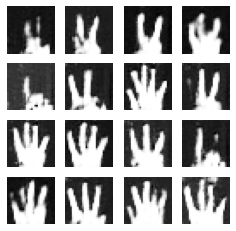

epoch 1002/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2729 sec, gen_loss=-12.467475891113281, disc_loss=-0.634584903717041
epoch 1003/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.39it/s]


Time=0.2746 sec, gen_loss=-12.359041213989258, disc_loss=-0.6341092586517334
epoch 1004/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.97it/s]


Time=0.2721 sec, gen_loss=-12.970043182373047, disc_loss=-0.6106958389282227
epoch 1005/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2753 sec, gen_loss=-12.262730598449707, disc_loss=-0.6265333890914917
epoch 1006/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-11.418174743652344, disc_loss=-0.797580897808075
epoch 1007/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2726 sec, gen_loss=-11.895608901977539, disc_loss=-0.6089480519294739
epoch 1008/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2723 sec, gen_loss=-12.493888854980469, disc_loss=-0.6640679836273193
epoch 1009/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2732 sec, gen_loss=-12.974096298217773, disc_loss=-0.726375162601471
epoch 1010/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.97it/s]


Time=0.2712 sec, gen_loss=-13.223341941833496, disc_loss=-0.7287000417709351
epoch 1011/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2723 sec, gen_loss=-12.349021911621094, disc_loss=-0.5358675122261047


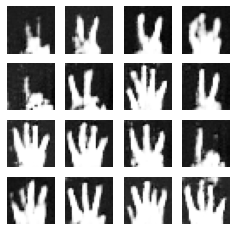

epoch 1012/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.40it/s]


Time=0.2745 sec, gen_loss=-12.022241592407227, disc_loss=-0.6164635419845581
epoch 1013/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.82it/s]


Time=0.2718 sec, gen_loss=-12.706960678100586, disc_loss=-0.6903810501098633
epoch 1014/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2742 sec, gen_loss=-12.83740234375, disc_loss=-0.7166357636451721
epoch 1015/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2733 sec, gen_loss=-12.1285400390625, disc_loss=-0.6825584173202515
epoch 1016/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2763 sec, gen_loss=-11.852035522460938, disc_loss=-0.6739464998245239
epoch 1017/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-11.494550704956055, disc_loss=-0.6677959561347961
epoch 1018/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2742 sec, gen_loss=-11.97323989868164, disc_loss=-0.6760075688362122
epoch 1019/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.97it/s]


Time=0.2741 sec, gen_loss=-13.254274368286133, disc_loss=-0.7673759460449219
epoch 1020/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2718 sec, gen_loss=-12.8341064453125, disc_loss=-0.6844727396965027
epoch 1021/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.48it/s]


Time=0.2732 sec, gen_loss=-12.29537296295166, disc_loss=-0.5430906414985657


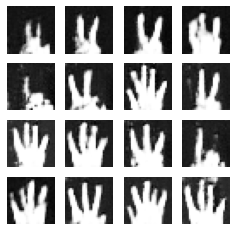

epoch 1022/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2723 sec, gen_loss=-11.636384010314941, disc_loss=-0.7157803773880005
epoch 1023/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-11.556339263916016, disc_loss=-0.7859951257705688
epoch 1024/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2753 sec, gen_loss=-12.405162811279297, disc_loss=-0.623958945274353
epoch 1025/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.56it/s]


Time=0.2729 sec, gen_loss=-13.163715362548828, disc_loss=-0.5990259051322937
epoch 1026/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2738 sec, gen_loss=-12.904109954833984, disc_loss=-0.47221070528030396
epoch 1027/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.98it/s]


Time=0.2743 sec, gen_loss=-11.512399673461914, disc_loss=-0.7393940091133118
epoch 1028/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2728 sec, gen_loss=-11.609514236450195, disc_loss=-0.610895037651062
epoch 1029/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2719 sec, gen_loss=-12.906545639038086, disc_loss=-0.6548062562942505
epoch 1030/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2713 sec, gen_loss=-13.589144706726074, disc_loss=-0.5234724879264832
epoch 1031/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-12.748347282409668, disc_loss=-0.6670565605163574


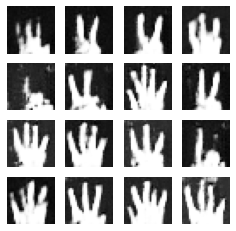

epoch 1032/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.03it/s]


Time=0.2729 sec, gen_loss=-11.439722061157227, disc_loss=-0.6305198669433594
epoch 1033/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.13it/s]


Time=0.2705 sec, gen_loss=-11.722420692443848, disc_loss=-0.8344285488128662
epoch 1034/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.73it/s]


Time=0.2732 sec, gen_loss=-11.767557144165039, disc_loss=-0.7605712413787842
epoch 1035/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.67it/s]


Time=0.2734 sec, gen_loss=-11.913105010986328, disc_loss=-0.6704772710800171
epoch 1036/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2722 sec, gen_loss=-11.174505233764648, disc_loss=-0.8207332491874695
epoch 1037/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-11.725825309753418, disc_loss=-0.7598704695701599
epoch 1038/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2742 sec, gen_loss=-12.653010368347168, disc_loss=-0.5722318887710571
epoch 1039/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2734 sec, gen_loss=-13.300931930541992, disc_loss=-0.7372978925704956
epoch 1040/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.85it/s]


Time=0.2757 sec, gen_loss=-12.502928733825684, disc_loss=-0.48334744572639465
epoch 1041/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.90it/s]


Time=0.2705 sec, gen_loss=-11.530969619750977, disc_loss=-0.7852352261543274


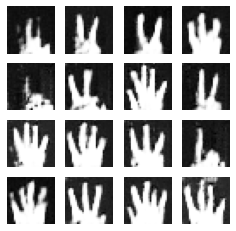

epoch 1042/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-11.9187650680542, disc_loss=-0.688169002532959
epoch 1043/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-12.724220275878906, disc_loss=-0.5913020372390747
epoch 1044/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2752 sec, gen_loss=-11.742759704589844, disc_loss=-0.7386815547943115
epoch 1045/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.01it/s]


Time=0.2720 sec, gen_loss=-10.898351669311523, disc_loss=-0.6490883827209473
epoch 1046/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.56it/s]


Time=0.2739 sec, gen_loss=-11.742975234985352, disc_loss=-0.6970715522766113
epoch 1047/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2753 sec, gen_loss=-12.219985008239746, disc_loss=-0.7082946300506592
epoch 1048/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-13.202094078063965, disc_loss=-0.6222494840621948
epoch 1049/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.17it/s]


Time=0.2719 sec, gen_loss=-13.496240615844727, disc_loss=-0.6180082559585571
epoch 1050/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2743 sec, gen_loss=-12.65433120727539, disc_loss=-0.5094128251075745
epoch 1051/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2729 sec, gen_loss=-11.632787704467773, disc_loss=-0.6617617607116699


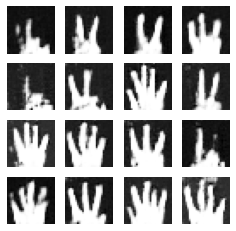

epoch 1052/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.95it/s]


Time=0.2755 sec, gen_loss=-11.177934646606445, disc_loss=-0.6410454511642456
epoch 1053/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.99it/s]


Time=0.2763 sec, gen_loss=-12.014467239379883, disc_loss=-0.6867926120758057
epoch 1054/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2722 sec, gen_loss=-12.966733932495117, disc_loss=-0.5884883999824524
epoch 1055/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-12.402130126953125, disc_loss=-0.5260152816772461
epoch 1056/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.74it/s]


Time=0.2722 sec, gen_loss=-11.412954330444336, disc_loss=-0.8121179342269897
epoch 1057/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2744 sec, gen_loss=-11.25356674194336, disc_loss=-0.7064839601516724
epoch 1058/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.04it/s]


Time=0.2709 sec, gen_loss=-11.791353225708008, disc_loss=-0.6346031427383423
epoch 1059/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2745 sec, gen_loss=-13.243782043457031, disc_loss=-0.5481002330780029
epoch 1060/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.03it/s]


Time=0.2719 sec, gen_loss=-14.046646118164062, disc_loss=-0.6447209119796753
epoch 1061/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2742 sec, gen_loss=-12.28499984741211, disc_loss=-0.6022361516952515


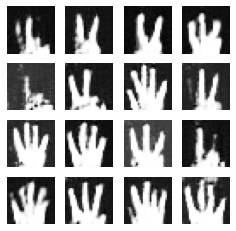

epoch 1062/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2745 sec, gen_loss=-9.82703685760498, disc_loss=-0.7846969366073608
epoch 1063/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.60it/s]


Time=0.2737 sec, gen_loss=-10.27804946899414, disc_loss=-0.5820098519325256
epoch 1064/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.43it/s]


Time=0.2713 sec, gen_loss=-12.666065216064453, disc_loss=-0.6022422909736633
epoch 1065/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2752 sec, gen_loss=-13.423032760620117, disc_loss=-0.5295364856719971
epoch 1066/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2734 sec, gen_loss=-12.080702781677246, disc_loss=-0.7020102739334106
epoch 1067/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2783 sec, gen_loss=-11.575407028198242, disc_loss=-0.547191858291626
epoch 1068/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2723 sec, gen_loss=-12.276267051696777, disc_loss=-0.5140775442123413
epoch 1069/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.64it/s]


Time=0.2777 sec, gen_loss=-12.48321533203125, disc_loss=-0.5521175861358643
epoch 1070/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2733 sec, gen_loss=-12.408748626708984, disc_loss=-0.6896661520004272
epoch 1071/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.19it/s]


Time=0.2744 sec, gen_loss=-12.386362075805664, disc_loss=-0.4812033772468567


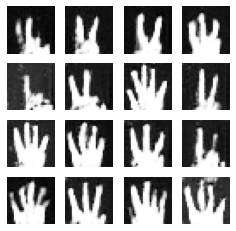

epoch 1072/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2742 sec, gen_loss=-11.988619804382324, disc_loss=-0.7472984194755554
epoch 1073/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2715 sec, gen_loss=-11.358824729919434, disc_loss=-0.7636227011680603
epoch 1074/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.60it/s]


Time=0.2747 sec, gen_loss=-11.339897155761719, disc_loss=-0.5609959959983826
epoch 1075/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.28it/s]


Time=0.2700 sec, gen_loss=-12.293083190917969, disc_loss=-0.7163631916046143
epoch 1076/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.65it/s]


Time=0.2685 sec, gen_loss=-12.737378120422363, disc_loss=-0.6694594621658325
epoch 1077/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2713 sec, gen_loss=-12.69628620147705, disc_loss=-0.5729160308837891
epoch 1078/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.66it/s]


Time=0.2683 sec, gen_loss=-12.114547729492188, disc_loss=-0.5988686084747314
epoch 1079/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.43it/s]


Time=0.2693 sec, gen_loss=-12.20384407043457, disc_loss=-0.6807312369346619
epoch 1080/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.44it/s]


Time=0.2693 sec, gen_loss=-13.231459617614746, disc_loss=-0.6601131558418274
epoch 1081/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.51it/s]


Time=0.2689 sec, gen_loss=-12.796623229980469, disc_loss=-0.6998507976531982


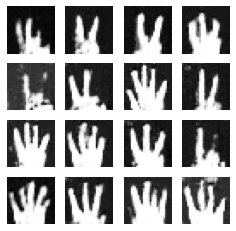

epoch 1082/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.53it/s]


Time=0.2689 sec, gen_loss=-12.27527141571045, disc_loss=-0.7005182504653931
epoch 1083/1500: 


100%|██████████| 16/16 [00:00<00:00, 63.03it/s]


Time=0.2668 sec, gen_loss=-12.01097297668457, disc_loss=-0.6318345069885254
epoch 1084/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.79it/s]


Time=0.2678 sec, gen_loss=-12.006502151489258, disc_loss=-0.768446147441864
epoch 1085/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.92it/s]


Time=0.2663 sec, gen_loss=-12.476067543029785, disc_loss=-0.7190483808517456
epoch 1086/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.91it/s]


Time=0.2673 sec, gen_loss=-12.942829132080078, disc_loss=-0.66335129737854
epoch 1087/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.56it/s]


Time=0.2688 sec, gen_loss=-12.470766067504883, disc_loss=-0.5319637656211853
epoch 1088/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.91it/s]


Time=0.2673 sec, gen_loss=-11.447138786315918, disc_loss=-0.7721484899520874
epoch 1089/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.41it/s]


Time=0.2694 sec, gen_loss=-11.864627838134766, disc_loss=-0.6084979176521301
epoch 1090/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.44it/s]


Time=0.2684 sec, gen_loss=-13.16115951538086, disc_loss=-0.5826288461685181
epoch 1091/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.43it/s]


Time=0.2703 sec, gen_loss=-13.065889358520508, disc_loss=-0.7552605867385864


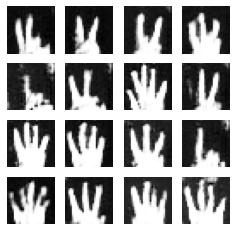

epoch 1092/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.41it/s]


Time=0.2693 sec, gen_loss=-12.079036712646484, disc_loss=-0.7159004211425781
epoch 1093/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.63it/s]


Time=0.2674 sec, gen_loss=-11.608404159545898, disc_loss=-0.48978191614151
epoch 1094/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-11.572134017944336, disc_loss=-0.714984655380249
epoch 1095/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.06it/s]


Time=0.2750 sec, gen_loss=-12.376350402832031, disc_loss=-0.879707932472229
epoch 1096/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2733 sec, gen_loss=-12.952438354492188, disc_loss=-0.8024814128875732
epoch 1097/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2713 sec, gen_loss=-13.276652336120605, disc_loss=-0.42133140563964844
epoch 1098/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2733 sec, gen_loss=-11.985630989074707, disc_loss=-0.5841572284698486
epoch 1099/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2762 sec, gen_loss=-11.852245330810547, disc_loss=-0.6700069904327393
epoch 1100/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2714 sec, gen_loss=-12.297680854797363, disc_loss=-0.8464901447296143
epoch 1101/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2727 sec, gen_loss=-12.933380126953125, disc_loss=-0.5758688449859619


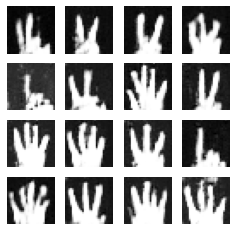

epoch 1102/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.53it/s]


Time=0.2730 sec, gen_loss=-12.052045822143555, disc_loss=-0.5450091361999512
epoch 1103/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2703 sec, gen_loss=-11.990287780761719, disc_loss=-0.5316396951675415
epoch 1104/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2752 sec, gen_loss=-12.178152084350586, disc_loss=-0.6654292941093445
epoch 1105/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2733 sec, gen_loss=-12.405935287475586, disc_loss=-0.7315268516540527
epoch 1106/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.09it/s]


Time=0.2749 sec, gen_loss=-13.284248352050781, disc_loss=-0.8131277561187744
epoch 1107/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.11it/s]


Time=0.2758 sec, gen_loss=-12.428653717041016, disc_loss=-0.732685923576355
epoch 1108/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-12.134112358093262, disc_loss=-0.690679669380188
epoch 1109/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.04it/s]


Time=0.2718 sec, gen_loss=-12.47293758392334, disc_loss=-0.693925142288208
epoch 1110/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2723 sec, gen_loss=-12.58369255065918, disc_loss=-0.6128005385398865
epoch 1111/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2748 sec, gen_loss=-12.66458797454834, disc_loss=-0.7182973623275757


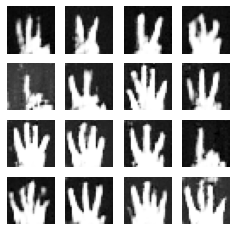

epoch 1112/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.84it/s]


Time=0.2736 sec, gen_loss=-12.739093780517578, disc_loss=-0.6286474466323853
epoch 1113/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2733 sec, gen_loss=-12.667496681213379, disc_loss=-0.6775751113891602
epoch 1114/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-12.25356674194336, disc_loss=-0.7728119492530823
epoch 1115/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-12.777913093566895, disc_loss=-0.7789323329925537
epoch 1116/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2742 sec, gen_loss=-13.26388931274414, disc_loss=-0.7407457828521729
epoch 1117/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2738 sec, gen_loss=-12.586258888244629, disc_loss=-0.7074171304702759
epoch 1118/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2732 sec, gen_loss=-12.032600402832031, disc_loss=-0.8626775741577148
epoch 1119/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.19it/s]


Time=0.2744 sec, gen_loss=-12.187652587890625, disc_loss=-0.6552058458328247
epoch 1120/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.67it/s]


Time=0.2749 sec, gen_loss=-12.490711212158203, disc_loss=-0.48907360434532166
epoch 1121/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.63it/s]


Time=0.2736 sec, gen_loss=-12.704392433166504, disc_loss=-0.5582200288772583


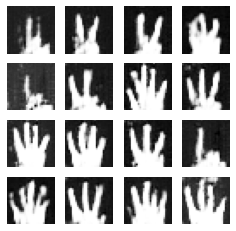

epoch 1122/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2743 sec, gen_loss=-12.397968292236328, disc_loss=-0.7436290979385376
epoch 1123/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2731 sec, gen_loss=-12.53127670288086, disc_loss=-0.4786317050457001
epoch 1124/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.15it/s]


Time=0.2704 sec, gen_loss=-13.460487365722656, disc_loss=-0.6722310185432434
epoch 1125/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.82it/s]


Time=0.2728 sec, gen_loss=-13.522767066955566, disc_loss=-0.5947635173797607
epoch 1126/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.32it/s]


Time=0.2749 sec, gen_loss=-12.762960433959961, disc_loss=-0.7206248044967651
epoch 1127/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-12.183146476745605, disc_loss=-0.7095483541488647
epoch 1128/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.17it/s]


Time=0.2745 sec, gen_loss=-12.138654708862305, disc_loss=-0.6681370139122009
epoch 1129/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2733 sec, gen_loss=-13.446968078613281, disc_loss=-0.6518908143043518
epoch 1130/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.61it/s]


Time=0.2737 sec, gen_loss=-13.65148639678955, disc_loss=-0.7654160261154175
epoch 1131/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2752 sec, gen_loss=-12.373089790344238, disc_loss=-0.7086384296417236


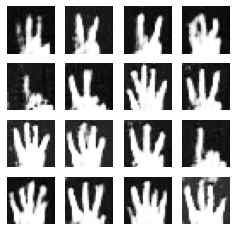

epoch 1132/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.75it/s]


Time=0.2741 sec, gen_loss=-11.841972351074219, disc_loss=-0.49615365266799927
epoch 1133/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2743 sec, gen_loss=-12.439895629882812, disc_loss=-0.5637394189834595
epoch 1134/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2742 sec, gen_loss=-12.865739822387695, disc_loss=-0.5941517353057861
epoch 1135/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2753 sec, gen_loss=-12.859081268310547, disc_loss=-0.7704570293426514
epoch 1136/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.21it/s]


Time=0.2711 sec, gen_loss=-12.399797439575195, disc_loss=-0.5612876415252686
epoch 1137/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.26it/s]


Time=0.2752 sec, gen_loss=-12.310481071472168, disc_loss=-0.6619476079940796
epoch 1138/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.03it/s]


Time=0.2719 sec, gen_loss=-12.47581958770752, disc_loss=-0.7693211436271667
epoch 1139/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-12.555379867553711, disc_loss=-0.7099491953849792
epoch 1140/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2723 sec, gen_loss=-13.140830039978027, disc_loss=-0.6756073832511902
epoch 1141/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.34it/s]


Time=0.2728 sec, gen_loss=-13.062154769897461, disc_loss=-0.6564545035362244


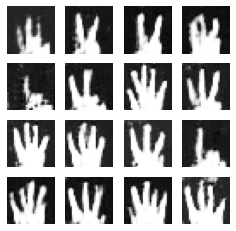

epoch 1142/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2734 sec, gen_loss=-12.54103946685791, disc_loss=-0.7083125114440918
epoch 1143/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2734 sec, gen_loss=-11.979866027832031, disc_loss=-0.6791706085205078
epoch 1144/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2738 sec, gen_loss=-12.752297401428223, disc_loss=-0.7515737414360046
epoch 1145/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-13.340240478515625, disc_loss=-0.5238866806030273
epoch 1146/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2772 sec, gen_loss=-12.283024787902832, disc_loss=-0.5633839964866638
epoch 1147/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.82it/s]


Time=0.2737 sec, gen_loss=-12.035216331481934, disc_loss=-0.5715011954307556
epoch 1148/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2723 sec, gen_loss=-12.727527618408203, disc_loss=-0.41915595531463623
epoch 1149/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2734 sec, gen_loss=-12.784956932067871, disc_loss=-0.5767968893051147
epoch 1150/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2728 sec, gen_loss=-12.799627304077148, disc_loss=-0.5636913776397705
epoch 1151/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2712 sec, gen_loss=-12.1185302734375, disc_loss=-0.7049689888954163


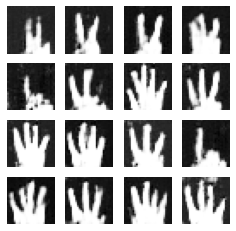

epoch 1152/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2738 sec, gen_loss=-12.11795711517334, disc_loss=-0.6746143102645874
epoch 1153/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-12.390604019165039, disc_loss=-0.6757965087890625
epoch 1154/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.57it/s]


Time=0.2748 sec, gen_loss=-12.411334991455078, disc_loss=-0.6240876913070679
epoch 1155/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2738 sec, gen_loss=-13.146949768066406, disc_loss=-0.4968256950378418
epoch 1156/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2732 sec, gen_loss=-12.601682662963867, disc_loss=-0.8927931785583496
epoch 1157/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2763 sec, gen_loss=-12.538803100585938, disc_loss=-0.714546263217926
epoch 1158/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.27it/s]


Time=0.2760 sec, gen_loss=-11.43394660949707, disc_loss=-0.6137359142303467
epoch 1159/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.65it/s]


Time=0.2745 sec, gen_loss=-11.865005493164062, disc_loss=-0.504818856716156
epoch 1160/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.73it/s]


Time=0.2732 sec, gen_loss=-12.472527503967285, disc_loss=-0.5629234910011292
epoch 1161/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2788 sec, gen_loss=-13.056577682495117, disc_loss=-0.7701321840286255


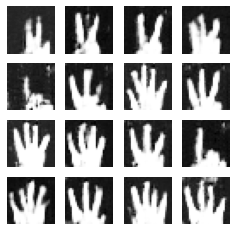

epoch 1162/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.29it/s]


Time=0.2803 sec, gen_loss=-12.3526611328125, disc_loss=-0.5850263833999634
epoch 1163/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-11.235574722290039, disc_loss=-0.5147978663444519
epoch 1164/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.89it/s]


Time=0.2767 sec, gen_loss=-11.994650840759277, disc_loss=-0.5453639030456543
epoch 1165/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.30it/s]


Time=0.2750 sec, gen_loss=-13.053356170654297, disc_loss=-0.7425605058670044
epoch 1166/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2783 sec, gen_loss=-13.08513069152832, disc_loss=-0.6189501881599426
epoch 1167/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.31it/s]


Time=0.2792 sec, gen_loss=-11.765453338623047, disc_loss=-0.8394380807876587
epoch 1168/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-10.724422454833984, disc_loss=-0.6629069447517395
epoch 1169/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.55it/s]


Time=0.2792 sec, gen_loss=-12.017366409301758, disc_loss=-0.5530139803886414
epoch 1170/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.27it/s]


Time=0.2751 sec, gen_loss=-12.812015533447266, disc_loss=-0.7842606902122498
epoch 1171/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.64it/s]


Time=0.2813 sec, gen_loss=-13.060161590576172, disc_loss=-0.7036525011062622


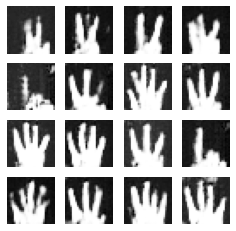

epoch 1172/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.41it/s]


Time=0.2788 sec, gen_loss=-12.147557258605957, disc_loss=-0.5933813452720642
epoch 1173/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.29it/s]


Time=0.2793 sec, gen_loss=-11.192625045776367, disc_loss=-0.6233718991279602
epoch 1174/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2753 sec, gen_loss=-11.515714645385742, disc_loss=-0.6496174335479736
epoch 1175/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-12.630925178527832, disc_loss=-0.8010181188583374
epoch 1176/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2752 sec, gen_loss=-12.81001091003418, disc_loss=-0.6171046495437622
epoch 1177/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.44it/s]


Time=0.2777 sec, gen_loss=-12.526748657226562, disc_loss=-0.6973823308944702
epoch 1178/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2733 sec, gen_loss=-11.944921493530273, disc_loss=-0.6600374579429626
epoch 1179/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.70it/s]


Time=0.2776 sec, gen_loss=-12.20850944519043, disc_loss=-0.6540164351463318
epoch 1180/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.78it/s]


Time=0.2720 sec, gen_loss=-13.266989707946777, disc_loss=-0.6318178176879883
epoch 1181/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.53it/s]


Time=0.2699 sec, gen_loss=-12.862977981567383, disc_loss=-0.6161988973617554


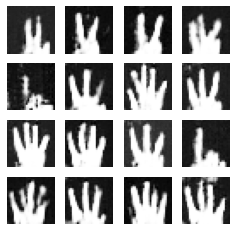

epoch 1182/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.86it/s]


Time=0.2778 sec, gen_loss=-11.726651191711426, disc_loss=-0.6586633324623108
epoch 1183/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-11.427373886108398, disc_loss=-0.6098051071166992
epoch 1184/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.29it/s]


Time=0.2703 sec, gen_loss=-11.192899703979492, disc_loss=-0.5777547359466553
epoch 1185/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-12.080162048339844, disc_loss=-0.6127359867095947
epoch 1186/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2763 sec, gen_loss=-13.501605033874512, disc_loss=-0.5483450293540955
epoch 1187/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.08it/s]


Time=0.2793 sec, gen_loss=-13.324563026428223, disc_loss=-0.5095025897026062
epoch 1188/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-12.62805461883545, disc_loss=-0.541664183139801
epoch 1189/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2693 sec, gen_loss=-12.308122634887695, disc_loss=-0.7503222823143005
epoch 1190/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.74it/s]


Time=0.2679 sec, gen_loss=-12.631340026855469, disc_loss=-0.6177223920822144
epoch 1191/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2743 sec, gen_loss=-12.900325775146484, disc_loss=-0.6702266931533813


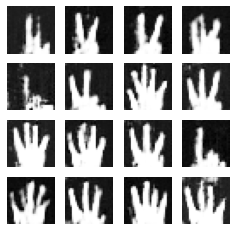

epoch 1192/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.05it/s]


Time=0.2718 sec, gen_loss=-12.680967330932617, disc_loss=-0.5143873691558838
epoch 1193/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2728 sec, gen_loss=-12.304412841796875, disc_loss=-0.7307533025741577
epoch 1194/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2729 sec, gen_loss=-11.941896438598633, disc_loss=-0.7304983139038086
epoch 1195/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2734 sec, gen_loss=-12.493234634399414, disc_loss=-0.6274086236953735
epoch 1196/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.65it/s]


Time=0.2768 sec, gen_loss=-12.61214828491211, disc_loss=-0.6018565893173218
epoch 1197/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2758 sec, gen_loss=-12.469725608825684, disc_loss=-0.6793068647384644
epoch 1198/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.21it/s]


Time=0.2764 sec, gen_loss=-12.244956016540527, disc_loss=-0.7309020757675171
epoch 1199/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.43it/s]


Time=0.2787 sec, gen_loss=-12.019840240478516, disc_loss=-0.6331881880760193
epoch 1200/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.61it/s]


Time=0.2779 sec, gen_loss=-11.985654830932617, disc_loss=-0.6751435995101929
epoch 1201/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.06it/s]


Time=0.2803 sec, gen_loss=-12.273208618164062, disc_loss=-0.6434011459350586


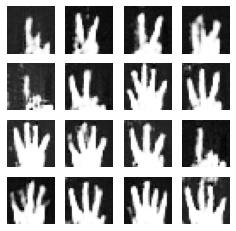

epoch 1202/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.06it/s]


Time=0.2760 sec, gen_loss=-12.704597473144531, disc_loss=-0.606408953666687
epoch 1203/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-12.85546875, disc_loss=-0.6815083622932434
epoch 1204/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.86it/s]


Time=0.2759 sec, gen_loss=-12.755367279052734, disc_loss=-0.595005989074707
epoch 1205/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-12.803930282592773, disc_loss=-0.5871440172195435
epoch 1206/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.17it/s]


Time=0.2758 sec, gen_loss=-12.458934783935547, disc_loss=-0.5818560123443604
epoch 1207/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.14it/s]


Time=0.2757 sec, gen_loss=-12.020489692687988, disc_loss=-0.7835215330123901
epoch 1208/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.88it/s]


Time=0.2759 sec, gen_loss=-12.691060066223145, disc_loss=-0.5299650430679321
epoch 1209/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.98it/s]


Time=0.2753 sec, gen_loss=-12.618062973022461, disc_loss=-0.7136461734771729
epoch 1210/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2772 sec, gen_loss=-12.101167678833008, disc_loss=-0.7877665758132935
epoch 1211/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.98it/s]


Time=0.2753 sec, gen_loss=-12.011632919311523, disc_loss=-0.728744387626648


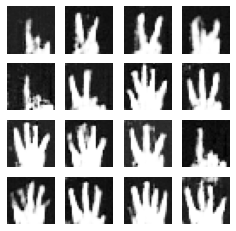

epoch 1212/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.09it/s]


Time=0.2759 sec, gen_loss=-12.811994552612305, disc_loss=-0.6289824843406677
epoch 1213/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2743 sec, gen_loss=-13.172222137451172, disc_loss=-0.6282222270965576
epoch 1214/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2713 sec, gen_loss=-13.246540069580078, disc_loss=-0.6482896208763123
epoch 1215/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-12.232438087463379, disc_loss=-0.8356622457504272
epoch 1216/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.07it/s]


Time=0.2718 sec, gen_loss=-12.085076332092285, disc_loss=-0.667225182056427
epoch 1217/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-12.02536392211914, disc_loss=-0.7299947738647461
epoch 1218/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.59it/s]


Time=0.2734 sec, gen_loss=-11.94775390625, disc_loss=-0.5960215330123901
epoch 1219/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2753 sec, gen_loss=-12.476507186889648, disc_loss=-0.646103024482727
epoch 1220/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2732 sec, gen_loss=-12.587858200073242, disc_loss=-0.6420919299125671
epoch 1221/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2748 sec, gen_loss=-12.638534545898438, disc_loss=-0.682220458984375


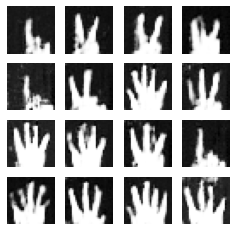

epoch 1222/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2763 sec, gen_loss=-13.192930221557617, disc_loss=-0.6653419733047485
epoch 1223/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-13.737075805664062, disc_loss=-0.5688887238502502
epoch 1224/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2752 sec, gen_loss=-13.107593536376953, disc_loss=-0.7424947619438171
epoch 1225/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2755 sec, gen_loss=-11.227585792541504, disc_loss=-0.6260587573051453
epoch 1226/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.60it/s]


Time=0.2727 sec, gen_loss=-10.788986206054688, disc_loss=-0.5376623868942261
epoch 1227/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2738 sec, gen_loss=-11.804719924926758, disc_loss=-0.5994612574577332
epoch 1228/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.09it/s]


Time=0.2756 sec, gen_loss=-13.710545539855957, disc_loss=-0.7403793334960938
epoch 1229/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2754 sec, gen_loss=-12.981754302978516, disc_loss=-0.60866779088974
epoch 1230/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2764 sec, gen_loss=-11.907150268554688, disc_loss=-0.6003662943840027
epoch 1231/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.48it/s]


Time=0.2742 sec, gen_loss=-12.028553009033203, disc_loss=-0.7674500942230225


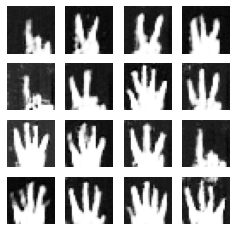

epoch 1232/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.53it/s]


Time=0.2806 sec, gen_loss=-12.719319343566895, disc_loss=-0.6185665130615234
epoch 1233/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.43it/s]


Time=0.2744 sec, gen_loss=-13.557085037231445, disc_loss=-0.5675017237663269
epoch 1234/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.54it/s]


Time=0.2740 sec, gen_loss=-12.695661544799805, disc_loss=-0.7075015306472778
epoch 1235/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2744 sec, gen_loss=-11.019287109375, disc_loss=-0.49524593353271484
epoch 1236/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.41it/s]


Time=0.2745 sec, gen_loss=-10.708802223205566, disc_loss=-0.6718781590461731
epoch 1237/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2748 sec, gen_loss=-11.676220893859863, disc_loss=-0.9437150359153748
epoch 1238/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2749 sec, gen_loss=-12.703924179077148, disc_loss=-0.7679803371429443
epoch 1239/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2746 sec, gen_loss=-13.039710998535156, disc_loss=-0.8297888040542603
epoch 1240/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2748 sec, gen_loss=-12.270828247070312, disc_loss=-0.6241021752357483
epoch 1241/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.98it/s]


Time=0.2753 sec, gen_loss=-11.596965789794922, disc_loss=-0.7257574796676636


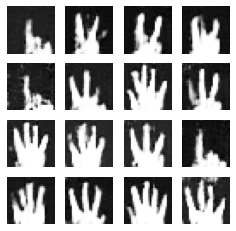

epoch 1242/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.30it/s]


Time=0.2793 sec, gen_loss=-11.922945022583008, disc_loss=-0.7655951976776123
epoch 1243/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.57it/s]


Time=0.2738 sec, gen_loss=-12.741735458374023, disc_loss=-0.5864861607551575
epoch 1244/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-12.486186027526855, disc_loss=-0.5110294818878174
epoch 1245/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-11.347989082336426, disc_loss=-0.5943155288696289
epoch 1246/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.87it/s]


Time=0.2812 sec, gen_loss=-11.245582580566406, disc_loss=-0.5539531707763672
epoch 1247/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.71it/s]


Time=0.2829 sec, gen_loss=-12.574623107910156, disc_loss=-0.6552048325538635
epoch 1248/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2744 sec, gen_loss=-13.546733856201172, disc_loss=-0.7420159578323364
epoch 1249/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2773 sec, gen_loss=-13.235904693603516, disc_loss=-0.6594090461730957
epoch 1250/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-11.986125946044922, disc_loss=-0.577845573425293
epoch 1251/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2742 sec, gen_loss=-10.811479568481445, disc_loss=-0.6115500926971436


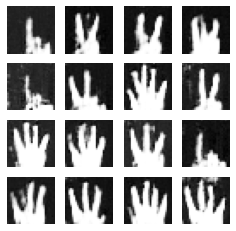

epoch 1252/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.61it/s]


Time=0.2727 sec, gen_loss=-11.495338439941406, disc_loss=-0.5423658490180969
epoch 1253/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.05it/s]


Time=0.2760 sec, gen_loss=-12.980965614318848, disc_loss=-0.6444294452667236
epoch 1254/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.74it/s]


Time=0.2778 sec, gen_loss=-13.07986831665039, disc_loss=-0.7847514152526855
epoch 1255/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2753 sec, gen_loss=-11.433168411254883, disc_loss=-0.6360311508178711
epoch 1256/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2744 sec, gen_loss=-11.22344970703125, disc_loss=-0.7747359275817871
epoch 1257/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.06it/s]


Time=0.2738 sec, gen_loss=-12.442715644836426, disc_loss=-0.6888701915740967
epoch 1258/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.89it/s]


Time=0.2705 sec, gen_loss=-13.324443817138672, disc_loss=-0.6591824293136597
epoch 1259/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.73it/s]


Time=0.2732 sec, gen_loss=-13.27812385559082, disc_loss=-0.6809598803520203
epoch 1260/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.82it/s]


Time=0.2728 sec, gen_loss=-11.857664108276367, disc_loss=-0.5765252113342285
epoch 1261/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2724 sec, gen_loss=-10.527021408081055, disc_loss=-0.7107758522033691


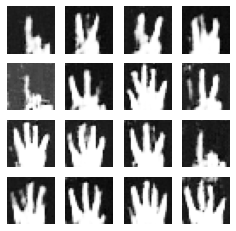

epoch 1262/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.78it/s]


Time=0.2769 sec, gen_loss=-11.474952697753906, disc_loss=-0.5499956607818604
epoch 1263/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-12.653671264648438, disc_loss=-0.7735908031463623
epoch 1264/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2752 sec, gen_loss=-13.377840995788574, disc_loss=-0.5511587858200073
epoch 1265/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.80it/s]


Time=0.2771 sec, gen_loss=-12.770986557006836, disc_loss=-0.6285392045974731
epoch 1266/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2748 sec, gen_loss=-11.979459762573242, disc_loss=-0.48486849665641785
epoch 1267/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.32it/s]


Time=0.2749 sec, gen_loss=-12.07023811340332, disc_loss=-0.7601920366287231
epoch 1268/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.97it/s]


Time=0.2722 sec, gen_loss=-12.725747108459473, disc_loss=-0.7348724007606506
epoch 1269/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2752 sec, gen_loss=-13.78410530090332, disc_loss=-0.6229578256607056
epoch 1270/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-12.56765365600586, disc_loss=-0.44189536571502686
epoch 1271/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.01it/s]


Time=0.2752 sec, gen_loss=-10.267010688781738, disc_loss=-0.676632285118103


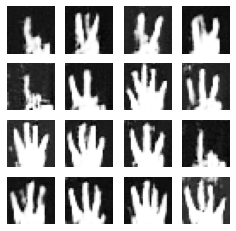

epoch 1272/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2724 sec, gen_loss=-10.657537460327148, disc_loss=-0.7906009554862976
epoch 1273/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.14it/s]


Time=0.2714 sec, gen_loss=-12.70035171508789, disc_loss=-0.6974017024040222
epoch 1274/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.31it/s]


Time=0.2802 sec, gen_loss=-13.650623321533203, disc_loss=-0.69978266954422
epoch 1275/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-13.308542251586914, disc_loss=-0.6110851764678955
epoch 1276/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2748 sec, gen_loss=-11.815864562988281, disc_loss=-0.7086855173110962
epoch 1277/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2733 sec, gen_loss=-10.648009300231934, disc_loss=-0.721514105796814
epoch 1278/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.28it/s]


Time=0.2709 sec, gen_loss=-11.48559856414795, disc_loss=-0.664915919303894
epoch 1279/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.39it/s]


Time=0.2694 sec, gen_loss=-12.887760162353516, disc_loss=-0.6054226160049438
epoch 1280/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.43it/s]


Time=0.2693 sec, gen_loss=-12.916226387023926, disc_loss=-0.639777660369873
epoch 1281/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.92it/s]


Time=0.2673 sec, gen_loss=-11.770557403564453, disc_loss=-0.710275411605835


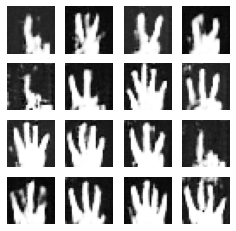

epoch 1282/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.44it/s]


Time=0.2744 sec, gen_loss=-10.70252799987793, disc_loss=-0.5736947059631348
epoch 1283/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2712 sec, gen_loss=-10.970735549926758, disc_loss=-0.7474088668823242
epoch 1284/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.89it/s]


Time=0.2683 sec, gen_loss=-13.386741638183594, disc_loss=-0.8134787082672119
epoch 1285/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.30it/s]


Time=0.2698 sec, gen_loss=-14.509149551391602, disc_loss=-0.6161935329437256
epoch 1286/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.38it/s]


Time=0.2704 sec, gen_loss=-11.592641830444336, disc_loss=-0.8366681337356567
epoch 1287/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.66it/s]


Time=0.2703 sec, gen_loss=-9.786239624023438, disc_loss=-0.6350163221359253
epoch 1288/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2712 sec, gen_loss=-10.607401847839355, disc_loss=-0.6183504462242126
epoch 1289/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.90it/s]


Time=0.2683 sec, gen_loss=-12.937759399414062, disc_loss=-0.6608467102050781
epoch 1290/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.52it/s]


Time=0.2699 sec, gen_loss=-13.904003143310547, disc_loss=-0.6558016538619995
epoch 1291/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.70it/s]


Time=0.2682 sec, gen_loss=-11.633565902709961, disc_loss=-0.6403344869613647


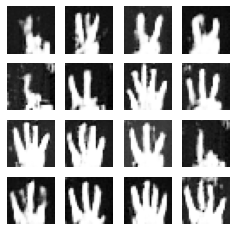

epoch 1292/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2733 sec, gen_loss=-10.381328582763672, disc_loss=-0.6951937675476074
epoch 1293/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.37it/s]


Time=0.2695 sec, gen_loss=-11.666120529174805, disc_loss=-0.5451807975769043
epoch 1294/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.67it/s]


Time=0.2693 sec, gen_loss=-13.7012939453125, disc_loss=-0.8276220560073853
epoch 1295/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2727 sec, gen_loss=-14.203125, disc_loss=-0.6982144713401794
epoch 1296/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.29it/s]


Time=0.2698 sec, gen_loss=-11.859216690063477, disc_loss=-0.6643520593643188
epoch 1297/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.55it/s]


Time=0.2739 sec, gen_loss=-9.964122772216797, disc_loss=-0.5482356548309326
epoch 1298/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.69it/s]


Time=0.2766 sec, gen_loss=-9.63447380065918, disc_loss=-0.5265270471572876
epoch 1299/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2738 sec, gen_loss=-11.483257293701172, disc_loss=-0.44866815209388733
epoch 1300/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2725 sec, gen_loss=-13.335786819458008, disc_loss=-0.6003087759017944
epoch 1301/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2724 sec, gen_loss=-12.631450653076172, disc_loss=-0.5357543230056763


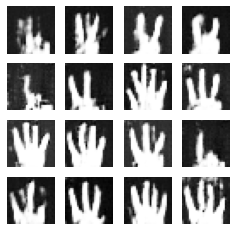

epoch 1302/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.45it/s]


Time=0.2733 sec, gen_loss=-10.972297668457031, disc_loss=-0.5113323926925659
epoch 1303/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.56it/s]


Time=0.2739 sec, gen_loss=-10.81283187866211, disc_loss=-0.4671538472175598
epoch 1304/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.91it/s]


Time=0.2714 sec, gen_loss=-12.967147827148438, disc_loss=-0.6162044405937195
epoch 1305/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-13.878215789794922, disc_loss=-0.6793752908706665
epoch 1306/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.52it/s]


Time=0.2740 sec, gen_loss=-11.935155868530273, disc_loss=-0.5207478404045105
epoch 1307/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2742 sec, gen_loss=-10.045951843261719, disc_loss=-0.6958702802658081
epoch 1308/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.67it/s]


Time=0.2736 sec, gen_loss=-9.819217681884766, disc_loss=-0.7875879406929016
epoch 1309/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.88it/s]


Time=0.2723 sec, gen_loss=-11.141985893249512, disc_loss=-0.7010700106620789
epoch 1310/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.80it/s]


Time=0.2738 sec, gen_loss=-12.215099334716797, disc_loss=-0.8250897526741028
epoch 1311/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2720 sec, gen_loss=-12.557256698608398, disc_loss=-0.6408637166023254


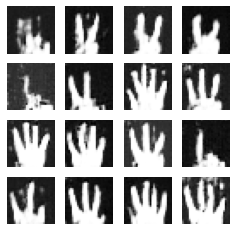

epoch 1312/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2763 sec, gen_loss=-12.231298446655273, disc_loss=-0.5861888527870178
epoch 1313/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2753 sec, gen_loss=-11.474658966064453, disc_loss=-0.6196710467338562
epoch 1314/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.93it/s]


Time=0.2766 sec, gen_loss=-11.756078720092773, disc_loss=-0.45550498366355896
epoch 1315/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2772 sec, gen_loss=-12.303262710571289, disc_loss=-0.7124701738357544
epoch 1316/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.19it/s]


Time=0.2745 sec, gen_loss=-13.172752380371094, disc_loss=-0.6708498597145081
epoch 1317/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.75it/s]


Time=0.2735 sec, gen_loss=-11.712660789489746, disc_loss=-0.6974129676818848
epoch 1318/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2752 sec, gen_loss=-9.619728088378906, disc_loss=-0.5100902318954468
epoch 1319/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2733 sec, gen_loss=-9.957958221435547, disc_loss=-0.6547495126724243
epoch 1320/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-12.485406875610352, disc_loss=-0.6527810096740723
epoch 1321/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2738 sec, gen_loss=-13.617067337036133, disc_loss=-0.7872839570045471


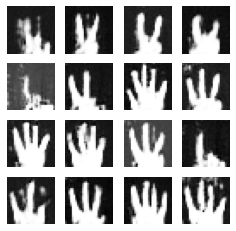

epoch 1322/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.91it/s]


Time=0.2714 sec, gen_loss=-12.610882759094238, disc_loss=-0.7382827401161194
epoch 1323/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.91it/s]


Time=0.2730 sec, gen_loss=-10.991233825683594, disc_loss=-0.6082077622413635
epoch 1324/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2763 sec, gen_loss=-10.57597541809082, disc_loss=-0.7258008718490601
epoch 1325/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2723 sec, gen_loss=-11.514917373657227, disc_loss=-0.7118238806724548
epoch 1326/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.33it/s]


Time=0.2738 sec, gen_loss=-12.708876609802246, disc_loss=-0.7032855749130249
epoch 1327/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2740 sec, gen_loss=-12.831798553466797, disc_loss=-0.3882981538772583
epoch 1328/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.69it/s]


Time=0.2729 sec, gen_loss=-11.868938446044922, disc_loss=-0.6287045478820801
epoch 1329/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.02it/s]


Time=0.2719 sec, gen_loss=-10.959293365478516, disc_loss=-0.6774238348007202
epoch 1330/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.52it/s]


Time=0.2783 sec, gen_loss=-10.97960090637207, disc_loss=-0.579393744468689
epoch 1331/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-11.845500946044922, disc_loss=-0.5607168078422546


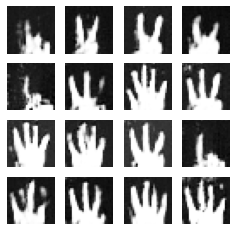

epoch 1332/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.88it/s]


Time=0.2761 sec, gen_loss=-12.224443435668945, disc_loss=-0.7481828927993774
epoch 1333/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.59it/s]


Time=0.2780 sec, gen_loss=-12.693151473999023, disc_loss=-0.6209595203399658
epoch 1334/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2763 sec, gen_loss=-11.736661911010742, disc_loss=-0.5978565216064453
epoch 1335/1500: 


100%|██████████| 16/16 [00:00<00:00, 58.76it/s]


Time=0.2876 sec, gen_loss=-10.896904945373535, disc_loss=-0.7375152707099915
epoch 1336/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2763 sec, gen_loss=-10.483391761779785, disc_loss=-0.7210448980331421
epoch 1337/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.89it/s]


Time=0.2767 sec, gen_loss=-11.273372650146484, disc_loss=-0.6773452162742615
epoch 1338/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2730 sec, gen_loss=-13.343443870544434, disc_loss=-0.5186254978179932
epoch 1339/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2742 sec, gen_loss=-13.535436630249023, disc_loss=-0.7236173152923584
epoch 1340/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2729 sec, gen_loss=-12.623838424682617, disc_loss=-0.6059658527374268
epoch 1341/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.86it/s]


Time=0.2779 sec, gen_loss=-11.286715507507324, disc_loss=-0.5187102556228638


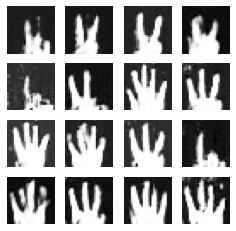

epoch 1342/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.84it/s]


Time=0.2827 sec, gen_loss=-11.028396606445312, disc_loss=-0.648354172706604
epoch 1343/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.84it/s]


Time=0.2810 sec, gen_loss=-12.448984146118164, disc_loss=-0.7279142141342163
epoch 1344/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2752 sec, gen_loss=-13.157625198364258, disc_loss=-0.5708781480789185
epoch 1345/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.99it/s]


Time=0.2764 sec, gen_loss=-11.46827507019043, disc_loss=-0.594046950340271
epoch 1346/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2762 sec, gen_loss=-10.556760787963867, disc_loss=-0.5557828545570374
epoch 1347/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.67it/s]


Time=0.2734 sec, gen_loss=-10.671712875366211, disc_loss=-0.7266228199005127
epoch 1348/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2723 sec, gen_loss=-11.661020278930664, disc_loss=-0.7120633125305176
epoch 1349/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2723 sec, gen_loss=-13.303927421569824, disc_loss=-0.7718067169189453
epoch 1350/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2729 sec, gen_loss=-13.711755752563477, disc_loss=-0.6364635229110718
epoch 1351/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.84it/s]


Time=0.2727 sec, gen_loss=-12.131004333496094, disc_loss=-0.6464841365814209


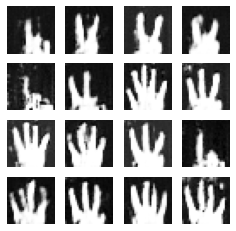

epoch 1352/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.06it/s]


Time=0.2728 sec, gen_loss=-10.800987243652344, disc_loss=-0.7116377353668213
epoch 1353/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.92it/s]


Time=0.2733 sec, gen_loss=-11.447664260864258, disc_loss=-0.8098089694976807
epoch 1354/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-12.77904224395752, disc_loss=-0.6013125777244568
epoch 1355/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-12.927797317504883, disc_loss=-0.7202647924423218
epoch 1356/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.95it/s]


Time=0.2732 sec, gen_loss=-12.809852600097656, disc_loss=-0.7520976066589355
epoch 1357/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.32it/s]


Time=0.2749 sec, gen_loss=-12.328827857971191, disc_loss=-0.630679726600647
epoch 1358/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.83it/s]


Time=0.2727 sec, gen_loss=-11.600967407226562, disc_loss=-0.7016756534576416
epoch 1359/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.30it/s]


Time=0.2793 sec, gen_loss=-11.48802375793457, disc_loss=-0.47881072759628296
epoch 1360/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.32it/s]


Time=0.2729 sec, gen_loss=-12.352426528930664, disc_loss=-0.5597027540206909
epoch 1361/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.53it/s]


Time=0.2783 sec, gen_loss=-13.783451080322266, disc_loss=-0.6248456239700317


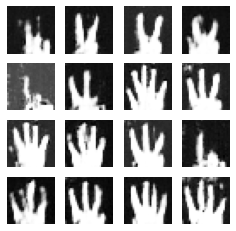

epoch 1362/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.56it/s]


Time=0.2782 sec, gen_loss=-13.462747573852539, disc_loss=-0.6358017325401306
epoch 1363/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.75it/s]


Time=0.2771 sec, gen_loss=-11.042444229125977, disc_loss=-0.833477258682251
epoch 1364/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2753 sec, gen_loss=-10.654316902160645, disc_loss=-0.555557370185852
epoch 1365/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2762 sec, gen_loss=-11.912553787231445, disc_loss=-0.6298795938491821
epoch 1366/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.74it/s]


Time=0.2848 sec, gen_loss=-13.414844512939453, disc_loss=-0.7611863613128662
epoch 1367/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.55it/s]


Time=0.2749 sec, gen_loss=-14.184623718261719, disc_loss=-0.6736559867858887
epoch 1368/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2762 sec, gen_loss=-12.983738899230957, disc_loss=-0.560255765914917
epoch 1369/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.65it/s]


Time=0.2768 sec, gen_loss=-11.258407592773438, disc_loss=-0.6049565672874451
epoch 1370/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.09it/s]


Time=0.2793 sec, gen_loss=-11.433126449584961, disc_loss=-0.5355514287948608
epoch 1371/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.32it/s]


Time=0.2802 sec, gen_loss=-12.468094825744629, disc_loss=-0.5258214473724365


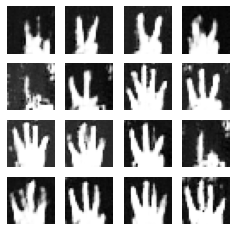

epoch 1372/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.07it/s]


Time=0.2779 sec, gen_loss=-12.865825653076172, disc_loss=-0.7482530474662781
epoch 1373/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.11it/s]


Time=0.2768 sec, gen_loss=-12.138588905334473, disc_loss=-0.5990347862243652
epoch 1374/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.30it/s]


Time=0.2793 sec, gen_loss=-10.950592041015625, disc_loss=-0.5648112297058105
epoch 1375/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.90it/s]


Time=0.2777 sec, gen_loss=-11.241649627685547, disc_loss=-0.5630588531494141
epoch 1376/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.75it/s]


Time=0.2773 sec, gen_loss=-12.274293899536133, disc_loss=-0.5069844722747803
epoch 1377/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.09it/s]


Time=0.2779 sec, gen_loss=-13.740341186523438, disc_loss=-0.5246212482452393
epoch 1378/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.55it/s]


Time=0.2782 sec, gen_loss=-13.082731246948242, disc_loss=-0.5739489793777466
epoch 1379/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.78it/s]


Time=0.2792 sec, gen_loss=-11.662660598754883, disc_loss=-0.6321519613265991
epoch 1380/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2773 sec, gen_loss=-10.35330867767334, disc_loss=-0.7307759523391724
epoch 1381/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2773 sec, gen_loss=-10.70242977142334, disc_loss=-0.8248008489608765


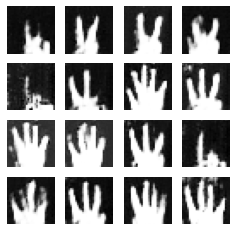

epoch 1382/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2750 sec, gen_loss=-12.175093650817871, disc_loss=-0.7442362308502197
epoch 1383/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.25it/s]


Time=0.2730 sec, gen_loss=-13.702372550964355, disc_loss=-0.5930123925209045
epoch 1384/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2753 sec, gen_loss=-12.930246353149414, disc_loss=-0.8217113614082336
epoch 1385/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.83it/s]


Time=0.2737 sec, gen_loss=-11.284626007080078, disc_loss=-0.7024275660514832
epoch 1386/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.73it/s]


Time=0.2732 sec, gen_loss=-11.182754516601562, disc_loss=-0.7286810278892517
epoch 1387/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.46it/s]


Time=0.2743 sec, gen_loss=-12.311335563659668, disc_loss=-0.6287453174591064
epoch 1388/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-12.871099472045898, disc_loss=-0.6380152702331543
epoch 1389/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.05it/s]


Time=0.2728 sec, gen_loss=-12.340126037597656, disc_loss=-0.8064571022987366
epoch 1390/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.88it/s]


Time=0.2778 sec, gen_loss=-11.521974563598633, disc_loss=-0.539835512638092
epoch 1391/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.42it/s]


Time=0.2788 sec, gen_loss=-11.335929870605469, disc_loss=-0.7337204217910767


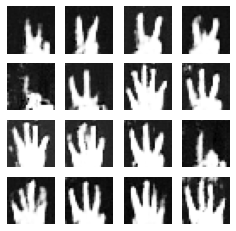

epoch 1392/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.56it/s]


Time=0.2782 sec, gen_loss=-11.722084999084473, disc_loss=-0.7659794092178345
epoch 1393/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.07it/s]


Time=0.2793 sec, gen_loss=-12.803050994873047, disc_loss=-0.685499906539917
epoch 1394/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.05it/s]


Time=0.2760 sec, gen_loss=-13.66761589050293, disc_loss=-0.636014997959137
epoch 1395/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.14it/s]


Time=0.2714 sec, gen_loss=-12.497879028320312, disc_loss=-0.5666255354881287
epoch 1396/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.86it/s]


Time=0.2736 sec, gen_loss=-11.022218704223633, disc_loss=-0.6749169826507568
epoch 1397/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.81it/s]


Time=0.2728 sec, gen_loss=-11.241748809814453, disc_loss=-0.4844666123390198
epoch 1398/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2763 sec, gen_loss=-11.757099151611328, disc_loss=-0.663176417350769
epoch 1399/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.01it/s]


Time=0.2772 sec, gen_loss=-12.738587379455566, disc_loss=-0.7160637378692627
epoch 1400/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.97it/s]


Time=0.2764 sec, gen_loss=-13.018440246582031, disc_loss=-0.5688034296035767
epoch 1401/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.41it/s]


Time=0.2775 sec, gen_loss=-12.013805389404297, disc_loss=-0.7274006605148315


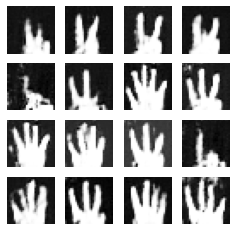

epoch 1402/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2793 sec, gen_loss=-11.106649398803711, disc_loss=-0.7232769727706909
epoch 1403/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2793 sec, gen_loss=-11.31755256652832, disc_loss=-0.6425896883010864
epoch 1404/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.07it/s]


Time=0.2770 sec, gen_loss=-12.066200256347656, disc_loss=-0.6716163754463196
epoch 1405/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.22it/s]


Time=0.2743 sec, gen_loss=-13.099349975585938, disc_loss=-0.6095489263534546
epoch 1406/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.24it/s]


Time=0.2757 sec, gen_loss=-12.729913711547852, disc_loss=-0.6301833391189575
epoch 1407/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-11.421276092529297, disc_loss=-0.6757379770278931
epoch 1408/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2793 sec, gen_loss=-10.483173370361328, disc_loss=-0.8724358677864075
epoch 1409/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.86it/s]


Time=0.2822 sec, gen_loss=-11.81108283996582, disc_loss=-0.5666210651397705
epoch 1410/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2773 sec, gen_loss=-12.946590423583984, disc_loss=-0.6542040705680847
epoch 1411/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.18it/s]


Time=0.2798 sec, gen_loss=-12.850186347961426, disc_loss=-0.7324919104576111


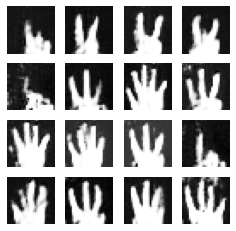

epoch 1412/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.60it/s]


Time=0.2737 sec, gen_loss=-12.264019012451172, disc_loss=-0.7502537965774536
epoch 1413/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2753 sec, gen_loss=-11.201343536376953, disc_loss=-0.8808305263519287
epoch 1414/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2758 sec, gen_loss=-11.058597564697266, disc_loss=-0.569943904876709
epoch 1415/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.31it/s]


Time=0.2759 sec, gen_loss=-12.542107582092285, disc_loss=-0.5342801809310913
epoch 1416/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.32it/s]


Time=0.2700 sec, gen_loss=-13.864533424377441, disc_loss=-0.617584764957428
epoch 1417/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.31it/s]


Time=0.2708 sec, gen_loss=-12.964929580688477, disc_loss=-0.7382457256317139
epoch 1418/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.34it/s]


Time=0.2738 sec, gen_loss=-10.903770446777344, disc_loss=-0.7021234035491943
epoch 1419/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2733 sec, gen_loss=-10.32234001159668, disc_loss=-0.5851038098335266
epoch 1420/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.50it/s]


Time=0.2751 sec, gen_loss=-11.532833099365234, disc_loss=-0.6236801743507385
epoch 1421/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2713 sec, gen_loss=-14.02249526977539, disc_loss=-0.4573614299297333


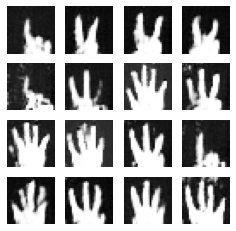

epoch 1422/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.77it/s]


Time=0.2699 sec, gen_loss=-13.83856201171875, disc_loss=-0.5496174693107605
epoch 1423/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2723 sec, gen_loss=-11.354413986206055, disc_loss=-0.6993539333343506
epoch 1424/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.09it/s]


Time=0.2753 sec, gen_loss=-9.983366966247559, disc_loss=-0.6322329044342041
epoch 1425/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-10.685375213623047, disc_loss=-0.5484868288040161
epoch 1426/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-12.817902565002441, disc_loss=-0.5315759181976318
epoch 1427/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2753 sec, gen_loss=-13.95767879486084, disc_loss=-0.6625477075576782
epoch 1428/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2793 sec, gen_loss=-12.865933418273926, disc_loss=-0.6335026025772095
epoch 1429/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2763 sec, gen_loss=-10.781501770019531, disc_loss=-0.6093251705169678
epoch 1430/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.09it/s]


Time=0.2803 sec, gen_loss=-10.805051803588867, disc_loss=-0.46852758526802063
epoch 1431/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.40it/s]


Time=0.2745 sec, gen_loss=-11.91845703125, disc_loss=-0.5128011703491211


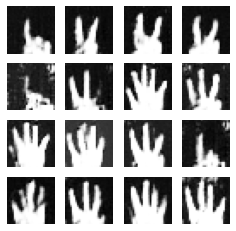

epoch 1432/1500: 


100%|██████████| 16/16 [00:00<00:00, 59.20it/s]


Time=0.2832 sec, gen_loss=-12.53150749206543, disc_loss=-0.7747313976287842
epoch 1433/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.77it/s]


Time=0.2740 sec, gen_loss=-12.865318298339844, disc_loss=-0.572016716003418
epoch 1434/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-11.908783912658691, disc_loss=-0.48028677701950073
epoch 1435/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.88it/s]


Time=0.2778 sec, gen_loss=-10.980361938476562, disc_loss=-0.8148592710494995
epoch 1436/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2749 sec, gen_loss=-11.103931427001953, disc_loss=-0.5339000821113586
epoch 1437/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.95it/s]


Time=0.2765 sec, gen_loss=-11.806883811950684, disc_loss=-0.658653974533081
epoch 1438/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2748 sec, gen_loss=-12.520238876342773, disc_loss=-0.5991075038909912
epoch 1439/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.09it/s]


Time=0.2793 sec, gen_loss=-12.255586624145508, disc_loss=-0.6990916728973389
epoch 1440/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-11.182882308959961, disc_loss=-0.6816509962081909
epoch 1441/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.28it/s]


Time=0.2761 sec, gen_loss=-10.182857513427734, disc_loss=-0.7427307963371277


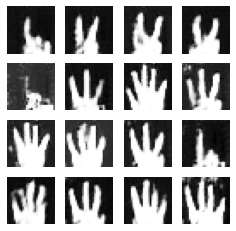

epoch 1442/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.88it/s]


Time=0.2768 sec, gen_loss=-10.631315231323242, disc_loss=-0.6207904815673828
epoch 1443/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2748 sec, gen_loss=-12.188098907470703, disc_loss=-0.721343994140625
epoch 1444/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.77it/s]


Time=0.2773 sec, gen_loss=-13.10489559173584, disc_loss=-0.6440305709838867
epoch 1445/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2753 sec, gen_loss=-12.211712837219238, disc_loss=-0.5665398240089417
epoch 1446/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.71it/s]


Time=0.2742 sec, gen_loss=-10.896286964416504, disc_loss=-0.6634716987609863
epoch 1447/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.84it/s]


Time=0.2737 sec, gen_loss=-11.037812232971191, disc_loss=-0.5079450607299805
epoch 1448/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.48it/s]


Time=0.2752 sec, gen_loss=-12.093050003051758, disc_loss=-0.542375385761261
epoch 1449/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.58it/s]


Time=0.2758 sec, gen_loss=-12.706089973449707, disc_loss=-0.684678852558136
epoch 1450/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2773 sec, gen_loss=-12.290281295776367, disc_loss=-0.6421520709991455
epoch 1451/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2743 sec, gen_loss=-11.569597244262695, disc_loss=-0.583085298538208


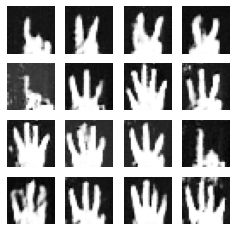

epoch 1452/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.42it/s]


Time=0.2788 sec, gen_loss=-10.250041961669922, disc_loss=-0.707656979560852
epoch 1453/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2753 sec, gen_loss=-10.744682312011719, disc_loss=-0.6772439479827881
epoch 1454/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2743 sec, gen_loss=-12.212536811828613, disc_loss=-0.6204374432563782
epoch 1455/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-12.7569580078125, disc_loss=-0.7577056288719177
epoch 1456/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-12.224292755126953, disc_loss=-0.5411823987960815
epoch 1457/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2733 sec, gen_loss=-11.647812843322754, disc_loss=-0.5505052804946899
epoch 1458/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.46it/s]


Time=0.2786 sec, gen_loss=-11.456649780273438, disc_loss=-0.602230429649353
epoch 1459/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.54it/s]


Time=0.2773 sec, gen_loss=-12.204483985900879, disc_loss=-0.6640113592147827
epoch 1460/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.26it/s]


Time=0.2752 sec, gen_loss=-12.96164321899414, disc_loss=-0.4813075065612793
epoch 1461/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.49it/s]


Time=0.2752 sec, gen_loss=-12.381621360778809, disc_loss=-0.6531810760498047


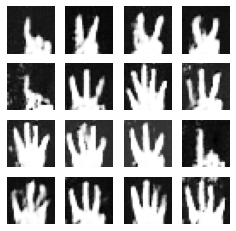

epoch 1462/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2733 sec, gen_loss=-11.47231674194336, disc_loss=-0.606458306312561
epoch 1463/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.76it/s]


Time=0.2720 sec, gen_loss=-11.297157287597656, disc_loss=-0.6213672757148743
epoch 1464/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2753 sec, gen_loss=-11.9500732421875, disc_loss=-0.5825832486152649
epoch 1465/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-12.403250694274902, disc_loss=-0.6898838877677917
epoch 1466/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.76it/s]


Time=0.2730 sec, gen_loss=-12.901704788208008, disc_loss=-0.6483044624328613
epoch 1467/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.76it/s]


Time=0.2773 sec, gen_loss=-11.921760559082031, disc_loss=-0.6261072158813477
epoch 1468/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.53it/s]


Time=0.2740 sec, gen_loss=-11.480325698852539, disc_loss=-0.5810748338699341
epoch 1469/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2747 sec, gen_loss=-11.948299407958984, disc_loss=-0.5974268317222595
epoch 1470/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.93it/s]


Time=0.2723 sec, gen_loss=-12.177343368530273, disc_loss=-0.5000143051147461
epoch 1471/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2763 sec, gen_loss=-12.432528495788574, disc_loss=-0.6747209429740906


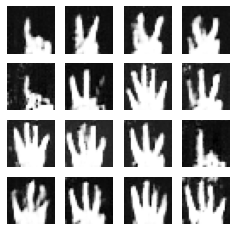

epoch 1472/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2743 sec, gen_loss=-12.716609001159668, disc_loss=-0.5284929275512695
epoch 1473/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.56it/s]


Time=0.2729 sec, gen_loss=-11.991168975830078, disc_loss=-0.5363394021987915
epoch 1474/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.70it/s]


Time=0.2732 sec, gen_loss=-11.471521377563477, disc_loss=-0.6725221276283264
epoch 1475/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.00it/s]


Time=0.2773 sec, gen_loss=-11.449508666992188, disc_loss=-0.6815727949142456
epoch 1476/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.54it/s]


Time=0.2749 sec, gen_loss=-11.48258113861084, disc_loss=-0.7769883871078491
epoch 1477/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2743 sec, gen_loss=-11.978361129760742, disc_loss=-0.7037023305892944
epoch 1478/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.57it/s]


Time=0.2771 sec, gen_loss=-11.739079475402832, disc_loss=-0.5787822008132935
epoch 1479/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.96it/s]


Time=0.2764 sec, gen_loss=-11.558429718017578, disc_loss=-0.6392098069190979
epoch 1480/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.47it/s]


Time=0.2753 sec, gen_loss=-11.832551956176758, disc_loss=-0.7271680235862732
epoch 1481/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.23it/s]


Time=0.2763 sec, gen_loss=-12.80215835571289, disc_loss=-0.6947077512741089


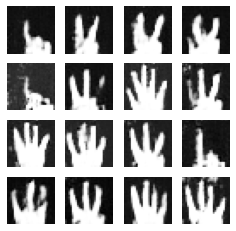

epoch 1482/1500: 


100%|██████████| 16/16 [00:00<00:00, 60.65it/s]


Time=0.2761 sec, gen_loss=-13.424283981323242, disc_loss=-0.588111937046051
epoch 1483/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2703 sec, gen_loss=-12.131513595581055, disc_loss=-0.6690727472305298
epoch 1484/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.20it/s]


Time=0.2712 sec, gen_loss=-11.528383255004883, disc_loss=-0.6903610229492188
epoch 1485/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2703 sec, gen_loss=-10.736860275268555, disc_loss=-0.6363465785980225
epoch 1486/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2723 sec, gen_loss=-12.176745414733887, disc_loss=-0.5763542652130127
epoch 1487/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2703 sec, gen_loss=-13.273736000061035, disc_loss=-0.6545674204826355
epoch 1488/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.44it/s]


Time=0.2702 sec, gen_loss=-13.009904861450195, disc_loss=-0.625962495803833
epoch 1489/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2693 sec, gen_loss=-11.743941307067871, disc_loss=-0.537735641002655
epoch 1490/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.91it/s]


Time=0.2734 sec, gen_loss=-10.889862060546875, disc_loss=-0.5565193891525269
epoch 1491/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2703 sec, gen_loss=-11.298932075500488, disc_loss=-0.6405312418937683


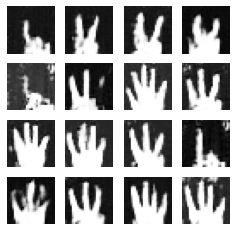

epoch 1492/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.68it/s]


Time=0.2733 sec, gen_loss=-12.688199996948242, disc_loss=-0.548180341720581
epoch 1493/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.77it/s]


Time=0.2679 sec, gen_loss=-12.759162902832031, disc_loss=-0.6473777890205383
epoch 1494/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.29it/s]


Time=0.2719 sec, gen_loss=-11.43152904510498, disc_loss=-0.760116696357727
epoch 1495/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2696 sec, gen_loss=-11.219133377075195, disc_loss=-0.658602237701416
epoch 1496/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.94it/s]


Time=0.2713 sec, gen_loss=-11.26455307006836, disc_loss=-0.5459507703781128
epoch 1497/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2703 sec, gen_loss=-12.024020195007324, disc_loss=-0.5069029927253723
epoch 1498/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.42it/s]


Time=0.2703 sec, gen_loss=-13.00794792175293, disc_loss=-0.7631272077560425
epoch 1499/1500: 


100%|██████████| 16/16 [00:00<00:00, 61.35it/s]


Time=0.2738 sec, gen_loss=-12.585675239562988, disc_loss=-0.5228515267372131
epoch 1500/1500: 


100%|██████████| 16/16 [00:00<00:00, 62.18it/s]


Time=0.2713 sec, gen_loss=-10.938982009887695, disc_loss=-0.7465266585350037


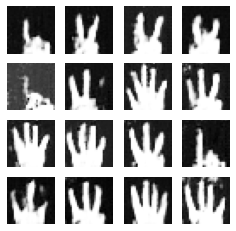

AttributeError: 'Writer' object has no attribute 'appen'

In [25]:
train_images = load_data(1005, BATCH_SIZE)
history = train(train_images, epochs=1500)

In [27]:
create_gif('wgan_gp.gif')

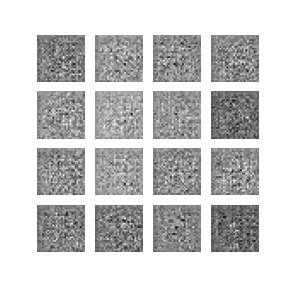

In [28]:
from IPython import display
display.Image(filename='wgan_gp.gif')

In [29]:
history.keys()

dict_keys(['gen_loss', 'disc_loss'])

Text(0.5, 0, 'epochs')

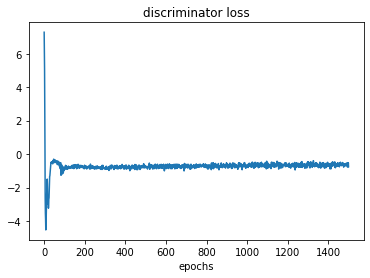

In [30]:
plt.plot(history['disc_loss'])
plt.title('discriminator loss')
plt.xlabel('epochs')

Text(0.5, 0, 'epochs')

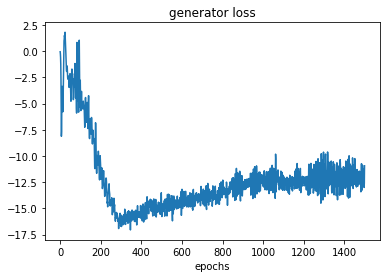

In [31]:
plt.plot(history['gen_loss'])
plt.title('generator loss')
plt.xlabel('epochs')